# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [1]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [2]:
len(reviews)

25000

In [3]:
reviews[0]

'bromwell high is a cartoon comedy . it ran at the same time as some other programs about school life  such as  teachers  . my   years in the teaching profession lead me to believe that bromwell high  s satire is much closer to reality than is  teachers  . the scramble to survive financially  the insightful students who can see right through their pathetic teachers  pomp  the pettiness of the whole situation  all remind me of the schools i knew and their students . when i saw the episode in which a student repeatedly tried to burn down the school  i immediately recalled . . . . . . . . . at . . . . . . . . . . high . a classic line inspector i  m here to sack one of your teachers . student welcome to bromwell high . i expect that many adults of my age think that bromwell high is far fetched . what a pity that it isn  t   '

In [4]:
labels[0]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [5]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [6]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [7]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

 Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [8]:
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()
for target, review in zip(labels, reviews):
    words = review.lower().split(' ')
    if target == 'NEGATIVE':
        negative_counts.update(words)
    else:
        positive_counts.update(words)
    total_counts.update(words)

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [9]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [10]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [11]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()
for word, count in total_counts.items():
    if count >= 100:
        pos_neg_ratios[word] = positive_counts[word] / float(negative_counts[word] + 1)

Examine the ratios you've calculated for a few words:

In [12]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value from neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [13]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()
for word, count in total_counts.items():
    if count >= 100:
        pos_neg_ratios[word] = np.log(positive_counts[word] / float(negative_counts[word] + 1))

Examine the new ratios you've calculated for the same words from before:

In [14]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.7291085042663878


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [15]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('voight', 2.0301704926730531),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('socc

In [16]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('boll', -4.9698132995760007),
 ('uwe', -4.6249728132842707),
 ('seagal', -3.6441435602725449),
 ('unwatchable', -3.2580965380214821),
 ('stinker', -3.2088254890146994),
 ('mst', -2.9502698994772336),
 ('incoherent', -2.9368917735310576),
 ('unfunny', -2.6922395950755678),
 ('waste', -2.6193845640165536),
 ('blah', -2.5704288232261625),
 ('horrid', -2.4849066497880004),
 ('pointless', -2.4553061800117097),
 ('atrocious', -2.4259083090260445),
 ('redeeming', -2.3682390632154826),
 ('prom', -2.3608540011180215),
 ('drivel', -2.3470368555648795),
 ('lousy', -2.3075726345050849),
 ('worst', -2.2869878961803778),
 ('laughable', -2.2643638801738479),
 ('awful', -2.2271942470274348),
 ('poorly', -2.2207550747464135),
 ('wasting', -2.2046046846338418),
 ('remotely', -2.1972245773362196),
 ('existent', -2.0794415416798357),
 ('boredom', -1.9951003932460849),
 ('miserably', -1.9924301646902063),
 ('sucks', -1.9870682215488209),
 ('uninspired', -1.9832976811269336),
 ('lame', -1.981767458946166)

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

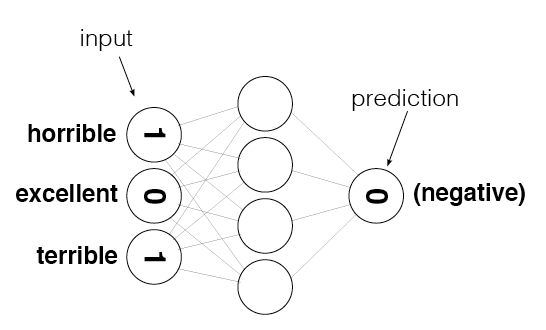

In [17]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

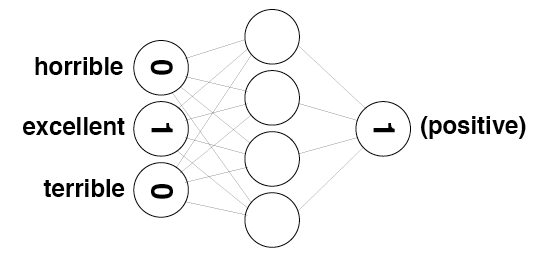

In [18]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [266]:
# Create set named "vocab" containing all of the words from all of the reviews
vocab = set(total_counts.keys())

Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [20]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

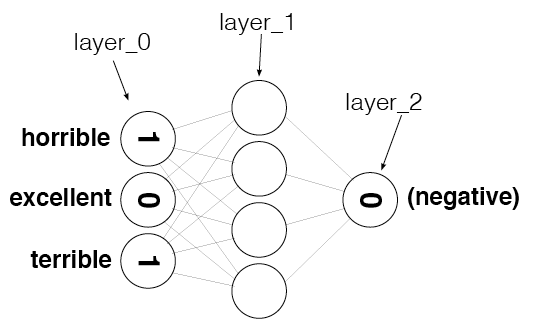

In [21]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [22]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1, vocab_size))

Run the following cell. It should display `(1, 74074)`

In [23]:
layer_0.shape

(1, 74074)

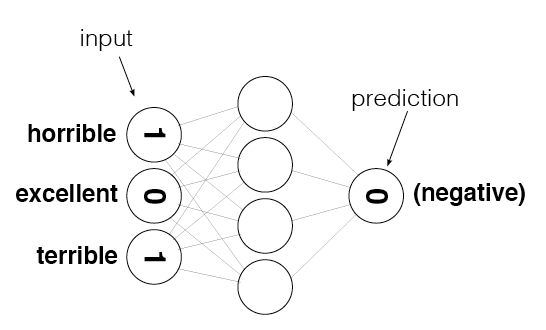

In [24]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [25]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
word2index

{'': 0,
 'sloooowly': 1,
 'jobbo': 2,
 'merkley': 3,
 'centimeters': 4,
 'satchwell': 5,
 'schwarzmann': 6,
 'ondrej': 7,
 'lamore': 8,
 'reformer': 9,
 'php': 10,
 'seventeen': 11,
 'undefeatable': 12,
 'kaiso': 13,
 'sakez': 14,
 'konchalovski': 15,
 'farligt': 16,
 'falak': 17,
 'petered': 18,
 'hiking': 19,
 'wan': 20,
 'biggen': 21,
 'glavas': 22,
 'baffles': 23,
 'enterprising': 24,
 'headbanger': 25,
 'raymie': 26,
 'feliz': 27,
 'swanton': 28,
 'muscari': 29,
 'desai': 30,
 'satyagrah': 31,
 'purgatori': 32,
 'conceits': 33,
 'pining': 34,
 'gulping': 35,
 'moralizing': 36,
 'foxs': 37,
 'alistar': 38,
 'hyping': 39,
 'adulating': 40,
 'gasoline': 41,
 'prospering': 42,
 'overmasters': 43,
 'comrades': 44,
 'lgbt': 45,
 'sensible': 46,
 'aughties': 47,
 'treble': 48,
 'flavorsome': 49,
 'sawa': 50,
 'endeavour': 51,
 'handycam': 52,
 'wreath': 53,
 'vulgate': 54,
 'reoccurred': 55,
 'cliver': 56,
 'ulrike': 57,
 'anonymously': 58,
 'steroids': 59,
 'prisoner': 60,
 'conrads': 6

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [26]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """
    temp_counter = Counter()
    words = review.lower().split(' ')
    temp_counter.update(words)
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    for words, counts in temp_counter.items():
        idx = word2index[words]
        layer_0[0, idx] = counts

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [27]:
update_input_layer(reviews[0])
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [28]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    if label.lower().startswith('pos'):
        return 1
    return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [29]:
labels[0]

'POSITIVE'

In [30]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [31]:
labels[1]

'NEGATIVE'

In [32]:
get_target_for_label(labels[1])

0

# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

 We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [151]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        #populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        review_vocab = set(' '.join(reviews).split(' '))
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set(labels)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        
        # populate self.word2index with indices for all the words in self.review_vocab
        for i,word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # populate self.label_vocab with indices for all the words in self.review_vocab
        for i,word in enumerate(self.label_vocab):
            self.label2index[word] = i
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.review_vocab_size, hidden_nodes))
        #np.random.normal(scale=1 / self.review_vocab_size ** .5,
        #                 size=(self.review_vocab_size, hidden_nodes))
        
        # initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                            (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        """ Modify the global layer_0 to represent the vector form of review.
        The element at a given index of layer_0 should represent
        how many times the given word occurs in the review.
        Args:
            review(string) - the string of the review
        Returns:
            None
        """
        temp_counter = Counter()
        words = review.lower().split(' ')
        temp_counter.update(words)
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        for words, counts in temp_counter.items():
            if words in self.word2index.keys():
                idx = self.word2index[words]
                self.layer_0[0, idx] = counts
                
    def get_target_for_label(self,label):
        """Convert a label to `0` or `1`.
        Args:
            label(string) - Either "POSITIVE" or "NEGATIVE".
        Returns:
            `0` or `1`.
        """
        if label.lower().startswith('pos'):
            return 1
        return 0
        
    def sigmoid(self,x):
        """
        Calculate sigmoid
        """
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        '''
        Return the derivative of the sigmoid activation function, 
        where "output" is the original output from the sigmoid fucntion 
        '''
        return output * (1 - output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            # Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.update_input_layer(review)
            layer1 = np.dot(self.layer_0, self.weights_0_1)
            output = self.sigmoid(np.dot(layer1, self.weights_1_2))
            
            #  Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            output_error = self.get_target_for_label(label) - output
            output_error_term = output_error * self.sigmoid_output_2_derivative(output)
            
            
            layer_1_error = np.dot(output_error_term, self.weights_1_2.T)
            # no non-linteraity
            layer_1_errror_term = layer_1_error 
            
            self.weights_1_2 += self.learning_rate * np.dot(layer1.T, output_error_term)
            self.weights_0_1 += self.learning_rate * np.dot(self.layer_0.T, layer_1_errror_term)
            
            
            #  Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            # Keep track of correct predictions.
            if(output >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(output < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        self.update_input_layer(review)
        hidden_input = np.dot(self.layer_0, self.weights_0_1)
        hidden_output = hidden_input#sigmoid(hidden_input)
        output = self.sigmoid(np.dot(hidden_output, self.weights_1_2))
        if output >= 0.5:
            return 'POSITIVE'
        else:
            return 'NEGATIVE'


Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [142]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [143]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:17.4% Speed(reviews/sec):848.7 #Correct:88 #Tested:175 Testing Accuracy:50.2%

Progress:37.5% Speed(reviews/sec):917.4 #Correct:188 #Tested:376 Testing Accuracy:50.0%

Progress:55.9% Speed(reviews/sec):911.6 #Correct:280 #Tested:560 Testing Accuracy:50.0%

Progress:75.7% Speed(reviews/sec):926.9 #Correct:379 #Tested:758 Testing Accuracy:50.0%

Progress:95.3% Speed(reviews/sec):934.1 #Correct:477 #Tested:954 Testing Accuracy:50.0%

Progress:99.9% Speed(reviews/sec):933.9 #Correct:500 #Tested:1000 Testing Accuracy:50.0%

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [144]:
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):156.3 #Correct:1251 #Trained:2501 Training Accuracy:50.0%
Progress:20.8% Speed(reviews/sec):158.6 #Correct:2501 #Trained:5001 Training Accuracy:50.0%
Progress:31.2% Speed(reviews/sec):159.0 #Correct:3751 #Trained:7501 Training Accuracy:50.0%
Progress:41.6% Speed(reviews/sec):157.0 #Correct:5001 #Trained:10001 Training Accuracy:50.0%
Progress:52.0% Speed(reviews/sec):157.6 #Correct:6251 #Trained:12501 Training Accuracy:50.0%
Progress:62.5% Speed(reviews/sec):158.9 #Correct:7501 #Trained:15001 Training Accuracy:50.0%
Progress:72.9% Speed(reviews/sec):160.7 #Correct:8751 #Trained:17501 Training Accuracy:50.0%
Progress:83.3% Speed(reviews/sec):161.6 #Correct:10001 #Trained:20001 Training Accuracy:50.0%
Progress:93.7% Speed(reviews/sec):162.4 #Correct:11251 #Trained:22501 Training Accuracy:50.0%
Progress:99.9% Speed(reviews/sec):163.1 #Correct:12000 #Trained:24000 Training Ac

In [145]:
mlp.weights_1_2

array([[ 1.62434538],
       [-0.61175642],
       [-0.52817176],
       [-1.07296863],
       [ 0.86540764],
       [-2.30153871],
       [ 1.74481178],
       [-0.76120691],
       [ 0.3190391 ],
       [-0.24937038]])

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [146]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):176.7 #Correct:1251 #Trained:2501 Training Accuracy:50.0%
Progress:20.8% Speed(reviews/sec):176.2 #Correct:2501 #Trained:5001 Training Accuracy:50.0%
Progress:31.2% Speed(reviews/sec):176.1 #Correct:3751 #Trained:7501 Training Accuracy:50.0%
Progress:41.6% Speed(reviews/sec):175.3 #Correct:5001 #Trained:10001 Training Accuracy:50.0%
Progress:52.0% Speed(reviews/sec):173.9 #Correct:6251 #Trained:12501 Training Accuracy:50.0%
Progress:62.5% Speed(reviews/sec):172.4 #Correct:7501 #Trained:15001 Training Accuracy:50.0%
Progress:72.9% Speed(reviews/sec):172.1 #Correct:8751 #Trained:17501 Training Accuracy:50.0%
Progress:83.3% Speed(reviews/sec):171.3 #Correct:10001 #Trained:20001 Training Accuracy:50.0%
Progress:93.7% Speed(reviews/sec):170.6 #Correct:11251 #Trained:22501 Training Accuracy:50.0%
Progress:99.9% Speed(reviews/sec):170.5 #Correct:12000 #Trained:24000 Training Ac

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [152]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):161.2 #Correct:1279 #Trained:2501 Training Accuracy:51.1%
Progress:20.8% Speed(reviews/sec):162.8 #Correct:2625 #Trained:5001 Training Accuracy:52.4%
Progress:31.2% Speed(reviews/sec):161.8 #Correct:4059 #Trained:7501 Training Accuracy:54.1%
Progress:41.6% Speed(reviews/sec):163.7 #Correct:5614 #Trained:10001 Training Accuracy:56.1%
Progress:52.0% Speed(reviews/sec):164.8 #Correct:7174 #Trained:12501 Training Accuracy:57.3%
Progress:62.5% Speed(reviews/sec):165.2 #Correct:8727 #Trained:15001 Training Accuracy:58.1%
Progress:72.9% Speed(reviews/sec):165.9 #Correct:10362 #Trained:17501 Training Accuracy:59.2%
Progress:83.3% Speed(reviews/sec):166.7 #Correct:12024 #Trained:20001 Training Accuracy:60.1%
Progress:93.7% Speed(reviews/sec):167.1 #Correct:13720 #Trained:22501 Training Accuracy:60.9%
Progress:99.9% Speed(reviews/sec):167.1 #Correct:14788 #Trained:24000 Training A

In [153]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:14.1% Speed(reviews/sec):682.9 #Correct:100 #Tested:142 Testing Accuracy:70.4%

Progress:33.3% Speed(reviews/sec):810.6 #Correct:222 #Tested:334 Testing Accuracy:66.4%

Progress:51.1% Speed(reviews/sec):831.8 #Correct:335 #Tested:512 Testing Accuracy:65.4%

Progress:70.2% Speed(reviews/sec):857.5 #Correct:468 #Tested:703 Testing Accuracy:66.5%

Progress:89.2% Speed(reviews/sec):871.4 #Correct:585 #Tested:893 Testing Accuracy:65.5%

Progress:99.9% Speed(reviews/sec):882.1 #Correct:660 #Tested:1000 Testing Accuracy:66.0%

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

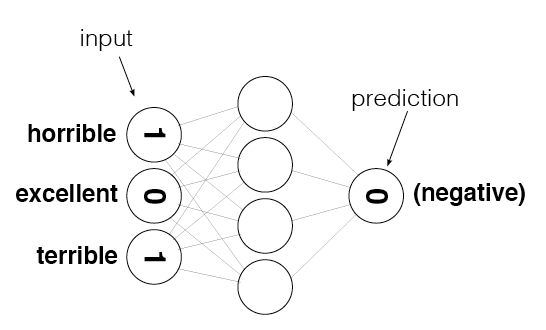

In [154]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [155]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [156]:
layer_0

array([[ 18.,   0.,   0., ...,   0.,   0.,   0.]])

In [157]:
review_counter = Counter()

In [158]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [159]:
review_counter.most_common()

[('.', 27),
 ('', 18),
 ('the', 9),
 ('to', 6),
 ('high', 5),
 ('i', 5),
 ('bromwell', 4),
 ('is', 4),
 ('a', 4),
 ('teachers', 4),
 ('that', 4),
 ('of', 4),
 ('it', 2),
 ('at', 2),
 ('as', 2),
 ('school', 2),
 ('my', 2),
 ('in', 2),
 ('me', 2),
 ('students', 2),
 ('their', 2),
 ('student', 2),
 ('cartoon', 1),
 ('comedy', 1),
 ('ran', 1),
 ('same', 1),
 ('time', 1),
 ('some', 1),
 ('other', 1),
 ('programs', 1),
 ('about', 1),
 ('life', 1),
 ('such', 1),
 ('years', 1),
 ('teaching', 1),
 ('profession', 1),
 ('lead', 1),
 ('believe', 1),
 ('s', 1),
 ('satire', 1),
 ('much', 1),
 ('closer', 1),
 ('reality', 1),
 ('than', 1),
 ('scramble', 1),
 ('survive', 1),
 ('financially', 1),
 ('insightful', 1),
 ('who', 1),
 ('can', 1),
 ('see', 1),
 ('right', 1),
 ('through', 1),
 ('pathetic', 1),
 ('pomp', 1),
 ('pettiness', 1),
 ('whole', 1),
 ('situation', 1),
 ('all', 1),
 ('remind', 1),
 ('schools', 1),
 ('knew', 1),
 ('and', 1),
 ('when', 1),
 ('saw', 1),
 ('episode', 1),
 ('which', 1),
 ('r

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [162]:

class SentimentNetworkNoCount(SentimentNetwork):
    def update_input_layer(self,review):
        """ Modify the global layer_0 to represent the vector form of review.
        The element at a given index of layer_0 should represent
        how many times the given word occurs in the review.
        Args:
            review(string) - the string of the review
        Returns:
            None
        """
        word_set = set(review.lower().split(' '))
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        for words in word_set:
            if words in self.word2index.keys():
                idx = self.word2index[words]
                self.layer_0[0, idx] = 1

Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [163]:
mlp = SentimentNetworkNoCount(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Progress:10.4% Speed(reviews/sec):169.8 #Correct:1801 #Trained:2501 Training Accuracy:72.0%
Progress:20.8% Speed(reviews/sec):170.4 #Correct:3782 #Trained:5001 Training Accuracy:75.6%
Progress:31.2% Speed(reviews/sec):168.8 #Correct:5865 #Trained:7501 Training Accuracy:78.1%
Progress:41.6% Speed(reviews/sec):166.6 #Correct:7994 #Trained:10001 Training Accuracy:79.9%
Progress:52.0% Speed(reviews/sec):167.0 #Correct:10128 #Trained:12501 Training Accuracy:81.0%
Progress:62.5% Speed(reviews/sec):167.9 #Correct:12277 #Trained:15001 Training Accuracy:81.8%
Progress:72.9% Speed(reviews/sec):167.6 #Correct:14394 #Trained:17501 Training Accuracy:82.2%
Progress:83.3% Speed(reviews/sec):167.2 #Correct:16571 #Trained:20001 Training Accuracy:82.8%
Progress:93.7% Speed(reviews/sec):166.8 #Correct:18772 #Trained:22501 Training Accuracy:83.4%
Progress:99.9% Speed(reviews/sec):166.9 #Correct:20100 #Trained:24000 Training

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [164]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:17.8% Speed(reviews/sec):868.9 #Correct:155 #Tested:179 Testing Accuracy:86.5%

Progress:36.9% Speed(reviews/sec):903.7 #Correct:323 #Tested:370 Testing Accuracy:87.2%

Progress:54.8% Speed(reviews/sec):893.7 #Correct:479 #Tested:549 Testing Accuracy:87.2%

Progress:74.6% Speed(reviews/sec):913.5 #Correct:640 #Tested:747 Testing Accuracy:85.6%

Progress:92.8% Speed(reviews/sec):907.8 #Correct:790 #Tested:929 Testing Accuracy:85.0%

Progress:99.9% Speed(reviews/sec):900.2 #Correct:853 #Tested:1000 Testing Accuracy:85.3%

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

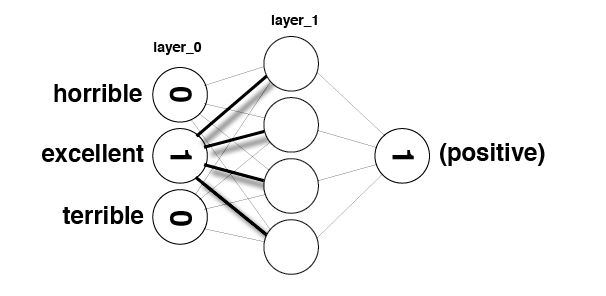

In [165]:
Image(filename='sentiment_network_sparse.png')

In [166]:
layer_0 = np.zeros(10)

In [167]:
layer_0

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [168]:
layer_0[4] = 1
layer_0[9] = 1

In [169]:
layer_0

array([ 0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.])

In [170]:
weights_0_1 = np.random.randn(10,5)

In [171]:
layer_0.dot(weights_0_1)

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [172]:
indices = [4,9]

In [173]:
layer_1 = np.zeros(5)

In [174]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])

In [175]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

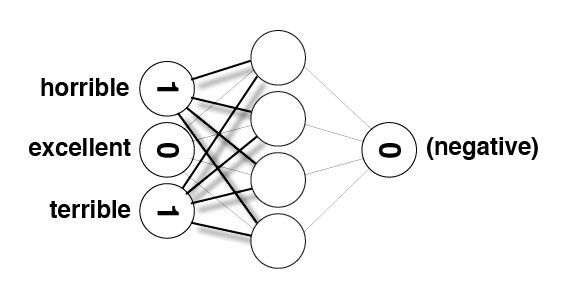

In [176]:
Image(filename='sentiment_network_sparse_2.png')

In [177]:
layer_1 = np.zeros(5)

In [178]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [179]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [231]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        #populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        review_vocab = set(' '.join(reviews).split(' '))
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set(labels)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        
        # populate self.word2index with indices for all the words in self.review_vocab
        for i,word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # populate self.label_vocab with indices for all the words in self.review_vocab
        for i,word in enumerate(self.label_vocab):
            self.label2index[word] = i
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, hidden_nodes))
        #np.random.normal(scale=1 / self.review_vocab_size ** .5,
        #                 size=(self.review_vocab_size, hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.hidden_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_1 = np.zeros((1,hidden_nodes))
    
        
    def get_index_review_representation(self,reviews_raw):
        """ Modify the global layer_0 to represent the vector form of review.
        The element at a given index of layer_0 should represent
        how many times the given word occurs in the review.
        Args:
            review(string) - the string of the review
        Returns:
            None
        """
        reviews_result = []
        for review in reviews_raw:
            current_review_indx = []
            word_set = set(review.lower().split(' '))
            # clear out previous state by resetting the layer to be all 0s
            for words in word_set:
                if words in self.word2index.keys():
                    idx = self.word2index[words]
                    current_review_indx.append(idx)
            reviews_result.append(current_review_indx)
        return reviews_result
                
    def get_target_for_label(self,label):
        """Convert a label to `0` or `1`.
        Args:
            label(string) - Either "POSITIVE" or "NEGATIVE".
        Returns:
            `0` or `1`.
        """
        if label.lower().startswith('pos'):
            return 1
        return 0
        
    def sigmoid(self,x):
        """
        Calculate sigmoid
        """
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        '''
        Return the derivative of the sigmoid activation function, 
        where "output" is the original output from the sigmoid fucntion 
        '''
        return output * (1 - output)

    def train(self, training_reviews_raw, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews_raw) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        
        training_reviews = self.get_index_review_representation(training_reviews_raw)
        for i in range(len(training_reviews)):
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]
            
            output = self.sigmoid(np.dot(self.layer_1, self.weights_1_2))
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            output_error = self.get_target_for_label(label) - output
            output_error_term = output_error * self.sigmoid_output_2_derivative(output)
            
            
            layer_1_error = np.dot(output_error_term, self.weights_1_2.T)
            # no non-linteraity
            layer_1_error_term = layer_1_error 
            
            self.weights_1_2 += self.learning_rate * np.dot(self.layer_1.T, output_error_term)
            self.weights_0_1[review] += self.learning_rate * layer_1_error_term
            
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            # Keep track of correct predictions.
            if(output >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(output < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_raw, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        testing_reviews = self.get_index_review_representation(testing_raw)
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        
        self.layer_1 *= 0
        for index in review:
            self.layer_1 += self.weights_0_1[index]
        output = self.sigmoid(np.dot(self.layer_1, self.weights_1_2))
        if(output >= 0.5):
            return 'POSITIVE'
        elif(output < 0.5):
            return 'NEGATIVE'


Run the following cell to recreate the network and train it once again.

In [232]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

[[ 0.06420789 -0.0241818  -0.02087782 -0.04241281  0.03420824 -0.09097631
   0.06896974 -0.03008934  0.01261113 -0.00985723]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
[[-0.07287558  0.0274462   0.02369621  0.04813829 -0.03882615  0.10325758
  -0.07828025  0.03415123 -0.01431356  0.0111879 ]]
Progress:0.00% Speed(reviews/sec):0.314 #Correct:1 #Trained:2 Training Accuracy:50.0%[[ 0.06693565 -0.02520912 -0.02176478 -0.04421464  0.03566152 -0.09484127
   0.0718998  -0.03136764  0.01314689 -0.010276  ]]
Progress:0.00% Speed(reviews/sec):0.629 #Correct:1 #Trained:3 Training Accuracy:33.3%[[-0.06862616  0.02584579  0.02231447  0.04533132 -0.03656218  0.09723656
  -0.07371569  0.03215985 -0.01347892  0.01053553]]
Progress:0.01% Speed(reviews/sec):0.943 #Correct:1 #Trained:4 Training Accuracy:25.0%[[ 0.06926907 -0.02608792 -0.02252351 -0.045756    0.0369047  -0.09814751
   0.07440628 -0.03246114  0.0136052  -0.01063423]]
Progress:0.01% Speed(reviews/sec

  -0.02751068  0.01200205 -0.00503033  0.00393186]]
Progress:0.88% Speed(reviews/sec):63.00 #Correct:150 #Trained:214 Training Accuracy:70.0%[[ 0.08066834 -0.03038109 -0.0262301  -0.05328584  0.04297793 -0.11429916
   0.08665095 -0.03780311  0.01584414 -0.01238425]]
Progress:0.89% Speed(reviews/sec):63.27 #Correct:150 #Trained:215 Training Accuracy:69.7%[[-0.02047615  0.00771167  0.00665802  0.01352562 -0.01090915  0.02901271
  -0.02199473  0.00959561 -0.00402174  0.00314351]]
Progress:0.89% Speed(reviews/sec):63.55 #Correct:151 #Trained:216 Training Accuracy:69.9%[[ 0.0715061  -0.02693043 -0.02325091 -0.04723367  0.03809653 -0.10131715
   0.07680921 -0.03350946  0.01404458 -0.01097765]]
Progress:0.9% Speed(reviews/sec):63.83 #Correct:152 #Trained:217 Training Accuracy:70.0%[[-0.08470541  0.03190152  0.02754279  0.05595254 -0.04512877  0.12001929
  -0.09098742  0.03969497 -0.01663706  0.01300402]]
Progress:0.90% Speed(reviews/sec):64.11 #Correct:152 #Trained:218 Training Accuracy:69.7%

Progress:1.77% Speed(reviews/sec):119.2 #Correct:312 #Trained:428 Training Accuracy:72.8%[[ 0.00821178 -0.0030927  -0.00267014 -0.00542433  0.00437502 -0.01163529
   0.00882079 -0.00384823  0.00161288 -0.00126068]]
Progress:1.78% Speed(reviews/sec):119.3 #Correct:313 #Trained:429 Training Accuracy:72.9%[[-0.06357897  0.02394494  0.02067332  0.04199738 -0.03387317  0.09008519
  -0.06829418  0.02979462 -0.0124876   0.00976068]]
Progress:1.78% Speed(reviews/sec):119.5 #Correct:314 #Trained:430 Training Accuracy:73.0%[[ 0.08096419 -0.03049251 -0.0263263  -0.05348126  0.04313555 -0.11471835
   0.08696874 -0.03794175  0.01590225 -0.01242967]]
Progress:1.79% Speed(reviews/sec):119.8 #Correct:314 #Trained:431 Training Accuracy:72.8%[[-0.08891661  0.03348752  0.0289121   0.05873426 -0.04737238  0.12598615
  -0.09551093  0.04166844 -0.01746419  0.01365053]]
Progress:1.79% Speed(reviews/sec):120.0 #Correct:314 #Trained:432 Training Accuracy:72.6%[[ 0.08382476 -0.03156985 -0.02725644 -0.05537082  

  -0.04979748  0.02172509 -0.00910548  0.00711711]]
Progress:2.60% Speed(reviews/sec):164.9 #Correct:457 #Trained:626 Training Accuracy:73.0%[[ 0.0170901  -0.00643642 -0.00555701 -0.01128894  0.00910514 -0.024215
   0.01835755 -0.00800883  0.00335668 -0.00262368]]
Progress:2.60% Speed(reviews/sec):165.1 #Correct:458 #Trained:627 Training Accuracy:73.0%[[-0.0274734   0.01034695  0.00893324  0.01814768 -0.01463709  0.03892712
  -0.02951091  0.01287469 -0.00539607  0.00421773]]
Progress:2.61% Speed(reviews/sec):165.3 #Correct:459 #Trained:628 Training Accuracy:73.0%[[ 0.00069064 -0.00026011 -0.00022457 -0.0004562   0.00036795 -0.00097856
   0.00074185 -0.00032365  0.00013565 -0.00010603]]
Progress:2.61% Speed(reviews/sec):165.5 #Correct:460 #Trained:629 Training Accuracy:73.1%[[-0.05829067  0.02195327  0.01895378  0.03850416 -0.03105571  0.08259219
  -0.06261368  0.0273164  -0.01144892  0.00894882]]
Progress:2.62% Speed(reviews/sec):165.7 #Correct:461 #Trained:630 Training Accuracy:73.1%[

  -0.06655906  0.02903764 -0.01217033  0.00951269]]
Progress:3.42% Speed(reviews/sec):205.5 #Correct:603 #Trained:822 Training Accuracy:73.3%[[  6.26235426e-04  -2.35851037e-04  -2.03626562e-04  -4.13662622e-04
    3.33641433e-04  -8.87314421e-04   6.72678953e-04  -2.93468827e-04
    1.22999449e-04  -9.61400000e-05]]
Progress:3.42% Speed(reviews/sec):205.7 #Correct:604 #Trained:823 Training Accuracy:73.3%[[-0.01226178  0.004618    0.00398704  0.00809957 -0.00653275  0.01737374
  -0.01317115  0.00574616 -0.00240835  0.00188243]]
Progress:3.42% Speed(reviews/sec):205.9 #Correct:605 #Trained:824 Training Accuracy:73.4%[[ 0.00717931 -0.00270385 -0.00233442 -0.00474233  0.00382495 -0.01017239
   0.00771175 -0.0033644   0.0014101  -0.00110217]]
Progress:3.43% Speed(reviews/sec):206.1 #Correct:606 #Trained:825 Training Accuracy:73.4%[[-0.00589972  0.00222194  0.00191835  0.00389709 -0.00314321  0.00835933
  -0.00633726  0.00276475 -0.00115877  0.00090573]]
Progress:3.43% Speed(reviews/sec):20

   -6.12148206e-05   4.78473109e-05]]
Progress:4.31% Speed(reviews/sec):246.4 #Correct:776 #Trained:1036 Training Accuracy:74.9%[[ 0.02232781 -0.00840904 -0.0072601  -0.01474873  0.01189566 -0.03163632
   0.0239837  -0.01046334  0.00438542 -0.00342778]]
Progress:4.31% Speed(reviews/sec):246.6 #Correct:777 #Trained:1037 Training Accuracy:74.9%[[-0.00257273  0.00096894  0.00083655  0.00169943 -0.00137068  0.00364531
  -0.00276353  0.00120564 -0.00050531  0.00039497]]
Progress:4.32% Speed(reviews/sec):246.8 #Correct:778 #Trained:1038 Training Accuracy:74.9%[[ 0.05530561 -0.02082904 -0.01798316 -0.03653237  0.02946535 -0.07836265
   0.05940724 -0.02591753  0.01086262 -0.00849055]]
Progress:4.32% Speed(reviews/sec):247.0 #Correct:779 #Trained:1039 Training Accuracy:74.9%[[-0.01114115  0.00419595  0.00362265  0.00735934 -0.00593571  0.01578592
  -0.01196741  0.00522101 -0.00218824  0.0017104 ]]
Progress:4.32% Speed(reviews/sec):247.2 #Correct:780 #Trained:1040 Training Accuracy:75.0%[[ 0.039

Progress:5.21% Speed(reviews/sec):284.6 #Correct:949 #Trained:1253 Training Accuracy:75.7%[[-0.01287181  0.00484775  0.00418539  0.00850253 -0.00685775  0.0182381
  -0.01382642  0.00603204 -0.00252816  0.00197609]]
Progress:5.22% Speed(reviews/sec):284.5 #Correct:950 #Trained:1254 Training Accuracy:75.7%[[ 0.00791208 -0.00297983 -0.00257269 -0.00522636  0.00421534 -0.01121064
   0.00849886 -0.00370779  0.00155402 -0.00121467]]
Progress:5.22% Speed(reviews/sec):284.6 #Correct:951 #Trained:1255 Training Accuracy:75.7%[[-0.05063479  0.01906993  0.0164644   0.03344704 -0.02697686  0.07174455
  -0.05439002  0.02372867 -0.00994522  0.00777348]]
Progress:5.22% Speed(reviews/sec):284.8 #Correct:951 #Trained:1256 Training Accuracy:75.7%[[ 0.00678495 -0.00255533 -0.00220619 -0.00448183  0.00361484 -0.00961362
   0.00728815 -0.00317959  0.00133264 -0.00104163]]
Progress:5.23% Speed(reviews/sec):285.0 #Correct:952 #Trained:1257 Training Accuracy:75.7%[[-0.02347878  0.00884251  0.00763435  0.015509

   0.01448619 -0.00631987  0.0026488  -0.00207038]]
Progress:6.13% Speed(reviews/sec):319.4 #Correct:1113 #Trained:1473 Training Accuracy:75.5%[[-0.01890258  0.00711904  0.00614636  0.01248619 -0.01007079  0.02678311
  -0.02030446  0.0088582  -0.00371267  0.00290193]]
Progress:6.13% Speed(reviews/sec):319.6 #Correct:1114 #Trained:1474 Training Accuracy:75.5%[[  2.99380983e-04  -1.12752030e-04  -9.73466493e-05  -1.97757452e-04
    1.59502156e-04  -4.24193606e-04   3.21583989e-04  -1.40297055e-04
    5.88016812e-05  -4.59611299e-05]]
Progress:6.14% Speed(reviews/sec):319.7 #Correct:1115 #Trained:1475 Training Accuracy:75.5%[[-0.07062838  0.02659986  0.02296551  0.04665389 -0.0376289   0.10007351
  -0.07586639  0.03309814 -0.01387218  0.01084291]]
Progress:6.14% Speed(reviews/sec):319.9 #Correct:1115 #Trained:1476 Training Accuracy:75.5%[[ 0.00421235 -0.00158644 -0.00136969 -0.00278249  0.00224423 -0.00596849
   0.00452475 -0.00197401  0.00082735 -0.00064668]]
Progress:6.15% Speed(reviews

Progress:7.04% Speed(reviews/sec):351.5 #Correct:1290 #Trained:1691 Training Accuracy:76.2%[[ -2.63062682e-05   9.90739324e-06   8.55373991e-06   1.73767235e-05
   -1.40152739e-05   3.72734121e-05  -2.82572212e-05   1.23277434e-05
   -5.16683718e-06   4.03855247e-06]]
Progress:7.04% Speed(reviews/sec):351.3 #Correct:1291 #Trained:1692 Training Accuracy:76.3%[[ 0.00068418 -0.00025767 -0.00022247 -0.00045194  0.00036451 -0.00096942
   0.00073492 -0.00032062  0.00013438 -0.00010504]]
Progress:7.05% Speed(reviews/sec):351.4 #Correct:1292 #Trained:1693 Training Accuracy:76.3%[[-0.03455514  0.01301406  0.01123594  0.02282555 -0.01841005  0.04896125
  -0.03711785  0.01619336 -0.006787    0.00530492]]
Progress:7.05% Speed(reviews/sec):351.5 #Correct:1293 #Trained:1694 Training Accuracy:76.3%[[ 0.0115523  -0.00435079 -0.00375634 -0.00763092  0.00615475 -0.01636848
   0.01240905 -0.00541368  0.002269   -0.00177352]]
Progress:7.05% Speed(reviews/sec):351.7 #Correct:1294 #Trained:1695 Training Acc

   -1.05325662e-04   8.23256469e-05]]
Progress:7.97% Speed(reviews/sec):381.6 #Correct:1472 #Trained:1916 Training Accuracy:76.8%[[ 0.08087293 -0.03045814 -0.02629662 -0.05342098  0.04308693 -0.11458904
   0.08687071 -0.03789898  0.01588432 -0.01241566]]
Progress:7.98% Speed(reviews/sec):381.7 #Correct:1472 #Trained:1917 Training Accuracy:76.7%[[-0.06668967  0.02511648  0.0216848   0.04405216 -0.03553047  0.09449275
  -0.07163558  0.03125237 -0.01309858  0.01023823]]
Progress:7.98% Speed(reviews/sec):381.8 #Correct:1472 #Trained:1918 Training Accuracy:76.7%[[  1.05319294e-05  -3.96650582e-06  -3.42455965e-06  -6.95691322e-06
    5.61112940e-06  -1.49227150e-05   1.13130093e-05  -4.93551279e-06
    2.06858547e-06  -1.61686747e-06]]
Progress:7.99% Speed(reviews/sec):382.0 #Correct:1473 #Trained:1919 Training Accuracy:76.7%[[-0.06782282  0.02554324  0.02205325  0.04480067 -0.03613418  0.09609831
  -0.07285276  0.03178339 -0.01332114  0.0104122 ]]
Progress:7.99% Speed(reviews/sec):382.1 #C

  -0.00224339  0.00097872 -0.0004102   0.00032063]]
Progress:8.87% Speed(reviews/sec):408.0 #Correct:1650 #Trained:2132 Training Accuracy:77.3%[[ 0.07042064 -0.02652163 -0.02289796 -0.04651667  0.03751823 -0.09977917
   0.07564325 -0.03300079  0.01383138 -0.01081102]]
Progress:8.88% Speed(reviews/sec):408.1 #Correct:1650 #Trained:2133 Training Accuracy:77.3%[[-0.00183458  0.00069093  0.00059653  0.00121184 -0.00097742  0.00259942
  -0.00197064  0.00085973 -0.00036033  0.00028165]]
Progress:8.88% Speed(reviews/sec):408.3 #Correct:1651 #Trained:2134 Training Accuracy:77.3%[[ 0.00344403 -0.00129708 -0.00111986 -0.00227497  0.00183489 -0.00487986
   0.00369945 -0.00161396  0.00067645 -0.00052873]]
Progress:8.89% Speed(reviews/sec):408.4 #Correct:1652 #Trained:2135 Training Accuracy:77.3%[[-0.0012819   0.00048278  0.00041682  0.00084676 -0.00068296  0.00181632
  -0.00137697  0.00060073 -0.00025178  0.0001968 ]]
Progress:8.89% Speed(reviews/sec):408.5 #Correct:1653 #Trained:2136 Training Acc

Progress:9.75% Speed(reviews/sec):431.7 #Correct:1823 #Trained:2342 Training Accuracy:77.8%[[ 0.00095356 -0.00035913 -0.00031006 -0.00062988  0.00050803 -0.0013511
   0.00102428 -0.00044686  0.00018729 -0.00014639]]
Progress:9.75% Speed(reviews/sec):431.5 #Correct:1824 #Trained:2343 Training Accuracy:77.8%[[-0.0759548   0.02860588  0.02469744  0.05017228 -0.04046668  0.10762053
  -0.08158784  0.03559423 -0.01491835  0.01166062]]
Progress:9.76% Speed(reviews/sec):431.6 #Correct:1824 #Trained:2344 Training Accuracy:77.8%[[ 0.00083963 -0.00031622 -0.00027302 -0.00055462  0.00044733 -0.00118968
   0.0009019  -0.00039347  0.00016491 -0.0001289 ]]
Progress:9.76% Speed(reviews/sec):431.7 #Correct:1825 #Trained:2345 Training Accuracy:77.8%[[-0.00963323  0.00362804  0.00313234  0.00636328 -0.00513233  0.01364935
  -0.01034766  0.00451436 -0.00189207  0.0014789 ]]
Progress:9.77% Speed(reviews/sec):431.8 #Correct:1826 #Trained:2346 Training Accuracy:77.8%[[ 0.0412328  -0.01552898 -0.01340725 -0.0

   -4.66306910e-05   3.64479246e-05]]
Progress:10.6% Speed(reviews/sec):454.1 #Correct:2001 #Trained:2558 Training Accuracy:78.2%[[  2.76726956e-07  -1.04220133e-07  -8.99804711e-08  -1.82793233e-07
    1.47432698e-07  -3.92095063e-07   2.97249870e-07  -1.29680838e-07
    5.43521838e-08  -4.24832713e-08]]
Progress:10.6% Speed(reviews/sec):454.1 #Correct:2002 #Trained:2559 Training Accuracy:78.2%[[ -2.39481753e-08   9.01929489e-09   7.78698299e-09   1.58190747e-08
   -1.27589453e-08   3.39322249e-08  -2.57242450e-08   1.12226850e-08
   -4.70368210e-09   3.67653678e-09]]
Progress:10.6% Speed(reviews/sec):454.2 #Correct:2003 #Trained:2560 Training Accuracy:78.2%[[ 0.04231406 -0.0159362  -0.01375883 -0.02795074  0.02254379 -0.05995489
   0.0454522  -0.01982937  0.00831094 -0.00649608]]
Progress:10.6% Speed(reviews/sec):454.3 #Correct:2004 #Trained:2561 Training Accuracy:78.2%[[-0.00090902  0.00034235  0.00029558  0.00060046 -0.0004843   0.001288
  -0.00097644  0.00042599 -0.00017854  0.000

   0.08189005 -0.03572607  0.01497361 -0.01170381]]
Progress:11.5% Speed(reviews/sec):475.0 #Correct:2184 #Trained:2773 Training Accuracy:78.7%[[-0.01011834  0.00381074  0.00329008  0.00668371 -0.00539078  0.01433669
  -0.01086874  0.00474169 -0.00198735  0.00155337]]
Progress:11.5% Speed(reviews/sec):475.1 #Correct:2185 #Trained:2774 Training Accuracy:78.7%[[  5.01034496e-04  -1.88698212e-04  -1.62916258e-04  -3.30960586e-04
    2.66937737e-04  -7.09916935e-04   5.38192741e-04  -2.34796691e-04
    9.84086244e-05  -7.69190858e-05]]
Progress:11.5% Speed(reviews/sec):475.2 #Correct:2186 #Trained:2775 Training Accuracy:78.7%[[-0.00091228  0.00034358  0.00029664  0.00060261 -0.00048604  0.00129262
  -0.00097994  0.00042752 -0.00017918  0.00014005]]
Progress:11.5% Speed(reviews/sec):475.3 #Correct:2187 #Trained:2776 Training Accuracy:78.7%[[ 0.06932715 -0.0261098  -0.0225424  -0.04579436  0.03693565 -0.0982298
   0.07446866 -0.03248835  0.01361661 -0.01064314]]
Progress:11.5% Speed(reviews/

  -0.0864663   0.03772255 -0.01581038  0.01235786]]
Progress:12.4% Speed(reviews/sec):494.2 #Correct:2365 #Trained:2986 Training Accuracy:79.2%[[ 0.00072915 -0.00027461 -0.00023709 -0.00048164  0.00038847 -0.00103314
   0.00078323 -0.0003417   0.00014321 -0.00011194]]
Progress:12.4% Speed(reviews/sec):494.3 #Correct:2366 #Trained:2987 Training Accuracy:79.2%[[-0.04177524  0.01573327  0.01358363  0.02759482 -0.02225672  0.05919143
  -0.04487341  0.01957687 -0.00820511  0.00641336]]
Progress:12.4% Speed(reviews/sec):494.4 #Correct:2367 #Trained:2988 Training Accuracy:79.2%[[ 0.08063488 -0.03036848 -0.02621922 -0.05326373  0.0429601  -0.11425174
   0.08661501 -0.03778742  0.01583757 -0.01237911]]
Progress:12.4% Speed(reviews/sec):494.5 #Correct:2367 #Trained:2989 Training Accuracy:79.1%[[-0.00091006  0.00034274  0.00029591  0.00060114 -0.00048485  0.00128946
  -0.00097755  0.00042647 -0.00017874  0.00013971]]
Progress:12.4% Speed(reviews/sec):494.5 #Correct:2368 #Trained:2990 Training Acc

  -0.04404089  0.01921366 -0.00805288  0.00629437]]
Progress:13.3% Speed(reviews/sec):512.9 #Correct:2543 #Trained:3204 Training Accuracy:79.3%[[ 0.06541362 -0.0246359  -0.02126988 -0.04320926  0.03485062 -0.09268472
   0.0702649  -0.03065438  0.01284795 -0.01004233]]
Progress:13.3% Speed(reviews/sec):513.0 #Correct:2544 #Trained:3205 Training Accuracy:79.3%[[ -4.62527483e-04   1.74195809e-04   1.50395326e-04   3.05524605e-04
   -2.46422233e-04   6.55356259e-04  -4.96829930e-04   2.16751388e-04
   -9.08454282e-05   7.10074684e-05]]
Progress:13.3% Speed(reviews/sec):513.1 #Correct:2545 #Trained:3206 Training Accuracy:79.3%[[ 0.00324139 -0.00122076 -0.00105397 -0.00214111  0.00172692 -0.00459273
   0.00348178 -0.00151899  0.00063664 -0.00049762]]
Progress:13.3% Speed(reviews/sec):513.2 #Correct:2546 #Trained:3207 Training Accuracy:79.3%[[-0.06490392  0.02444393  0.02110414  0.04287257 -0.03457906  0.09196251
  -0.06971739  0.03041552 -0.01274783  0.00996408]]
Progress:13.3% Speed(reviews

  -0.00212726  0.00092806 -0.00038897  0.00030403]]
Progress:14.2% Speed(reviews/sec):529.5 #Correct:2705 #Trained:3416 Training Accuracy:79.1%[[ 0.00091132 -0.00034322 -0.00029632 -0.00060197  0.00048552 -0.00129125
   0.0009789  -0.00042706  0.00017899 -0.00013991]]
Progress:14.2% Speed(reviews/sec):529.6 #Correct:2706 #Trained:3417 Training Accuracy:79.1%[[ -2.31400503e-05   8.71494111e-06   7.52421326e-06   1.52852641e-05
   -1.23283980e-05   3.27871907e-05  -2.48561869e-05   1.08439784e-05
   -4.54495755e-06   3.55247299e-06]]
Progress:14.2% Speed(reviews/sec):529.7 #Correct:2707 #Trained:3418 Training Accuracy:79.1%[[ 0.01224235 -0.00461068 -0.00398072 -0.00808674  0.00652239 -0.01734621
   0.01315028 -0.00573706  0.00240453 -0.00187945]]
Progress:14.2% Speed(reviews/sec):529.7 #Correct:2708 #Trained:3419 Training Accuracy:79.2%[[ -2.07370241e-04   7.80992010e-05   6.74284583e-05   1.36979344e-04
   -1.10481301e-04   2.93823373e-04  -2.22749450e-04   9.71786309e-05
   -4.07297707

Progress:15.1% Speed(reviews/sec):546.6 #Correct:2876 #Trained:3635 Training Accuracy:79.1%[[-0.02714334  0.01022265  0.00882592  0.01792965 -0.01446124  0.03845946
  -0.02915637  0.01272001 -0.00533125  0.00416706]]
Progress:15.1% Speed(reviews/sec):546.3 #Correct:2877 #Trained:3636 Training Accuracy:79.1%[[ 0.04351614 -0.01638893 -0.0141497  -0.02874478  0.02318423 -0.06165812
   0.04674343 -0.0203927   0.00854704 -0.00668062]]
Progress:15.1% Speed(reviews/sec):546.3 #Correct:2878 #Trained:3637 Training Accuracy:79.1%[[-0.00373433  0.00140641  0.00121425  0.00246673 -0.00198955  0.00529118
  -0.00401128  0.00174999 -0.00073346  0.0005733 ]]
Progress:15.1% Speed(reviews/sec):546.4 #Correct:2879 #Trained:3638 Training Accuracy:79.1%[[ 0.00355281 -0.00133805 -0.00115523 -0.00234682  0.00189284 -0.00503398
   0.00381629 -0.00166493  0.00069781 -0.00054543]]
Progress:15.1% Speed(reviews/sec):546.5 #Correct:2880 #Trained:3639 Training Accuracy:79.1%[[-0.00359715  0.00135475  0.00116965  0.

  -0.01544395  0.00673772 -0.00282393  0.00220727]]
Progress:16.0% Speed(reviews/sec):560.4 #Correct:3056 #Trained:3844 Training Accuracy:79.5%[[ 0.00565932 -0.0021314  -0.00184018 -0.00373829  0.00301513 -0.00801871
   0.00607903 -0.00265209  0.00111155 -0.00086882]]
Progress:16.0% Speed(reviews/sec):560.4 #Correct:3057 #Trained:3845 Training Accuracy:79.5%[[-0.05426546  0.02043731  0.01764494  0.03584529 -0.02891118  0.07688886
  -0.05828995  0.02543009 -0.01065833  0.00833086]]
Progress:16.0% Speed(reviews/sec):560.5 #Correct:3057 #Trained:3846 Training Accuracy:79.4%[[  7.19661820e-06  -2.71037024e-06  -2.34005066e-06  -4.75375846e-06
    3.83416509e-06  -1.01969049e-05   7.73034133e-06  -3.37250658e-06
    1.41349409e-06  -1.10482870e-06]]
Progress:16.0% Speed(reviews/sec):560.6 #Correct:3058 #Trained:3847 Training Accuracy:79.4%[[-0.06987402  0.02631576  0.02272022  0.0461556  -0.037227    0.09900466
  -0.07505609  0.03274463 -0.01372402  0.0107271 ]]
Progress:16.0% Speed(reviews

    7.03782624e-06  -5.50097274e-06]]
Progress:16.9% Speed(reviews/sec):575.1 #Correct:3236 #Trained:4063 Training Accuracy:79.6%[[-0.04038912  0.01521124  0.01313292  0.02667922 -0.02151824  0.05722744
  -0.0433845   0.0189273  -0.00793286  0.00620056]]
Progress:16.9% Speed(reviews/sec):575.2 #Correct:3237 #Trained:4064 Training Accuracy:79.6%[[ 0.05709515 -0.02150301 -0.01856504 -0.03771445  0.03041876 -0.08089824
   0.06132949 -0.02675614  0.01121411 -0.00876528]]
Progress:16.9% Speed(reviews/sec):575.3 #Correct:3238 #Trained:4065 Training Accuracy:79.6%[[-0.01580537  0.00595257  0.00513927  0.01044031 -0.00842068  0.02239466
  -0.01697754  0.00740677 -0.00310435  0.00242645]]
Progress:16.9% Speed(reviews/sec):575.3 #Correct:3239 #Trained:4066 Training Accuracy:79.6%[[ 0.04855425 -0.01828636 -0.01578789 -0.03207272  0.0258684  -0.06879662
   0.05215518 -0.02275368  0.00953658 -0.00745407]]
Progress:16.9% Speed(reviews/sec):575.4 #Correct:3240 #Trained:4067 Training Accuracy:79.6%[[-

   0.02406373 -0.01049826  0.00440006 -0.00343921]]
Progress:17.8% Speed(reviews/sec):588.6 #Correct:3412 #Trained:4279 Training Accuracy:79.7%[[ -1.08002847e-05   4.06757305e-06   3.51181800e-06   7.13417653e-06
   -5.75410191e-06   1.53029483e-05  -1.16012667e-05   5.06127047e-06
   -2.12129338e-06   1.65806552e-06]]
Progress:17.8% Speed(reviews/sec):588.7 #Correct:3413 #Trained:4280 Training Accuracy:79.7%[[ 0.02326907 -0.00876353 -0.00756617 -0.01537049  0.01239714 -0.03297
   0.02499478 -0.01090444  0.0045703  -0.00357228]]
Progress:17.8% Speed(reviews/sec):588.7 #Correct:3414 #Trained:4281 Training Accuracy:79.7%[[ -4.57159598e-05   1.72174171e-05   1.48649906e-05   3.01978825e-05
   -2.43562369e-05   6.47750491e-05  -4.91063947e-05   2.14235869e-05
   -8.97911172e-06   7.01833879e-06]]
Progress:17.8% Speed(reviews/sec):588.8 #Correct:3415 #Trained:4282 Training Accuracy:79.7%[[  1.80015044e-04  -6.77967629e-05  -5.85336488e-05  -1.18909745e-04
    9.59071855e-05  -2.55063731e-04

   0.02001356 -0.00873129  0.00365948 -0.00286036]]
Progress:18.7% Speed(reviews/sec):601.1 #Correct:3581 #Trained:4493 Training Accuracy:79.7%[[-0.00735336  0.0027694   0.00239102  0.00485729 -0.00391767  0.01041899
  -0.0078987   0.00344596 -0.00144428  0.00112889]]
Progress:18.7% Speed(reviews/sec):601.2 #Correct:3582 #Trained:4494 Training Accuracy:79.7%[[ 0.00339389 -0.0012782  -0.00110356 -0.00224185  0.00180818 -0.00480882
   0.00364559 -0.00159046  0.0006666  -0.00052103]]
Progress:18.7% Speed(reviews/sec):601.2 #Correct:3583 #Trained:4495 Training Accuracy:79.7%[[-0.02306686  0.00868737  0.00750041  0.01523691 -0.0122894   0.03268348
  -0.02477756  0.01080968 -0.00453058  0.00354124]]
Progress:18.7% Speed(reviews/sec):601.3 #Correct:3584 #Trained:4496 Training Accuracy:79.7%[[ 0.0061168  -0.00230369 -0.00198894 -0.00404048  0.00325887 -0.00866691
   0.00657044 -0.00286648  0.00120141 -0.00093905]]
Progress:18.7% Speed(reviews/sec):601.3 #Correct:3585 #Trained:4497 Training Acc

   0.02126343 -0.00927657  0.00388802 -0.00303899]]
Progress:19.6% Speed(reviews/sec):613.0 #Correct:3748 #Trained:4707 Training Accuracy:79.6%[[-0.04309032  0.01622856  0.01401124  0.0284635  -0.02295737  0.06105477
  -0.04628603  0.02019315 -0.00846341  0.00661525]]
Progress:19.6% Speed(reviews/sec):613.0 #Correct:3749 #Trained:4708 Training Accuracy:79.6%[[ 0.00200362 -0.0007546  -0.0006515  -0.0013235   0.00106747 -0.00283893
   0.00215221 -0.00093894  0.00039353 -0.0003076 ]]
Progress:19.6% Speed(reviews/sec):613.0 #Correct:3750 #Trained:4709 Training Accuracy:79.6%[[ -4.05290640e-06   1.52639429e-06   1.31784208e-06   2.67716552e-06
   -2.15927979e-06   5.74257244e-06  -4.35348229e-06   1.89928841e-06
   -7.96034897e-07   6.22204375e-07]]
Progress:19.6% Speed(reviews/sec):613.0 #Correct:3751 #Trained:4710 Training Accuracy:79.6%[[ 0.0022586  -0.00085063 -0.00073441 -0.00149193  0.00120332 -0.00320022
   0.00242611 -0.00105844  0.00044361 -0.00034674]]
Progress:19.6% Speed(reviews

   0.00101178 -0.00044141  0.000185   -0.00014461]]
Progress:20.4% Speed(reviews/sec):622.7 #Correct:3926 #Trained:4909 Training Accuracy:79.9%[[ -6.16520772e-06   2.32192331e-06   2.00467748e-06   4.07245564e-06
   -3.28465726e-06   8.73549705e-06  -6.62243830e-06   2.88916308e-06
   -1.21091385e-06   9.46486011e-07]]
Progress:20.4% Speed(reviews/sec):622.7 #Correct:3927 #Trained:4910 Training Accuracy:79.9%[[ 0.01592894 -0.00599911 -0.00517945 -0.01052193  0.00848651 -0.02256975
   0.01711028 -0.00746468  0.00312862 -0.00244542]]
Progress:20.4% Speed(reviews/sec):622.8 #Correct:3928 #Trained:4911 Training Accuracy:79.9%[[-0.01652547  0.00622377  0.00537342  0.01091597 -0.00880432  0.02341497
  -0.01775104  0.00774423 -0.00324578  0.002537  ]]
Progress:20.4% Speed(reviews/sec):622.8 #Correct:3929 #Trained:4912 Training Accuracy:79.9%[[ 0.05675614 -0.02137534 -0.01845481 -0.03749052  0.03023815 -0.08041791
   0.06096535 -0.02659728  0.01114752 -0.00871323]]
Progress:20.4% Speed(reviews

Progress:21.3% Speed(reviews/sec):633.0 #Correct:4100 #Trained:5117 Training Accuracy:80.1%[[ -1.54055705e-05   5.80200291e-06   5.00927163e-06   1.01762187e-05
   -8.20767461e-06   2.18281884e-05  -1.65480945e-05   7.21941701e-06
   -3.02582159e-06   2.36507148e-06]]
Progress:21.3% Speed(reviews/sec):632.7 #Correct:4101 #Trained:5118 Training Accuracy:80.1%[[ 0.01367058 -0.00514858 -0.00444512 -0.00903017  0.00728332 -0.01936988
   0.01468444 -0.00640636  0.00268505 -0.00209872]]
Progress:21.3% Speed(reviews/sec):632.8 #Correct:4102 #Trained:5119 Training Accuracy:80.1%[[ -6.47721458e-05   2.43943046e-05   2.10612955e-05   4.27855317e-05
   -3.45088615e-05   9.17758030e-05  -6.95758455e-05   3.03537693e-05
   -1.27219539e-05   9.94385473e-06]]
Progress:21.3% Speed(reviews/sec):632.8 #Correct:4103 #Trained:5120 Training Accuracy:80.1%[[ 0.03946337 -0.01486258 -0.0128319  -0.0260677   0.02102502 -0.05591573
   0.04239009 -0.01849347  0.00775103 -0.00605844]]
Progress:21.3% Speed(reviews

    3.60106555e-07  -2.81469914e-07]]
Progress:22.1% Speed(reviews/sec):640.9 #Correct:4265 #Trained:5313 Training Accuracy:80.2%[[-0.06240048  0.02350109  0.02029012  0.04121892 -0.0332453   0.08841538
  -0.06702829  0.02924235 -0.01225613  0.00957976]]
Progress:22.1% Speed(reviews/sec):640.9 #Correct:4265 #Trained:5314 Training Accuracy:80.2%[[ 0.05181006 -0.01951256 -0.01684655 -0.03422337  0.02760301 -0.0734098
   0.05565246 -0.02427943  0.01017606 -0.00795391]]
Progress:22.1% Speed(reviews/sec):640.7 #Correct:4266 #Trained:5315 Training Accuracy:80.2%[[-0.0556446   0.02095672  0.01809339  0.03675629 -0.02964595  0.07884297
  -0.05977138  0.02607639 -0.01092921  0.00854259]]
Progress:22.1% Speed(reviews/sec):640.8 #Correct:4267 #Trained:5316 Training Accuracy:80.2%[[ 0.03266249 -0.01230126 -0.01062053 -0.02157536  0.0174017  -0.04627956
   0.03508484 -0.01530642  0.00641527 -0.00501436]]
Progress:22.1% Speed(reviews/sec):640.8 #Correct:4268 #Trained:5317 Training Accuracy:80.2%[[-0

  -0.06598689  0.02878802 -0.01206571  0.00943092]]
Progress:22.6% Speed(reviews/sec):638.6 #Correct:4355 #Trained:5426 Training Accuracy:80.2%[[ 0.00452168 -0.00170294 -0.00147027 -0.00298682  0.00240903 -0.00640678
   0.00485703 -0.00211897  0.00088811 -0.00069417]]
Progress:22.6% Speed(reviews/sec):638.6 #Correct:4356 #Trained:5427 Training Accuracy:80.2%[[-0.00215955  0.00081332  0.0007022   0.0014265  -0.00115055  0.00305988
  -0.00231971  0.00101202 -0.00042416  0.00033154]]
Progress:22.6% Speed(reviews/sec):638.6 #Correct:4357 #Trained:5428 Training Accuracy:80.2%[[ 0.00493112 -0.00185714 -0.0016034  -0.00325727  0.00262717 -0.00698691
   0.00529682 -0.00231084  0.00096853 -0.00075703]]
Progress:22.6% Speed(reviews/sec):638.7 #Correct:4358 #Trained:5429 Training Accuracy:80.2%[[ -6.20139374e-04   2.33555159e-04   2.01644371e-04   4.09635847e-04
   -3.30393620e-04   8.78676911e-04  -6.66130799e-04   2.90612072e-04
   -1.21802118e-04   9.52041308e-05]]
Progress:22.6% Speed(reviews

   -8.61278056e-07   6.73200354e-07]]
Progress:23.0% Speed(reviews/sec):637.6 #Correct:4452 #Trained:5542 Training Accuracy:80.3%[[ 0.00066505 -0.00025047 -0.00021625 -0.0004393   0.00035432 -0.00094231
   0.00071437 -0.00031166  0.00013062 -0.0001021 ]]
Progress:23.0% Speed(reviews/sec):637.6 #Correct:4453 #Trained:5543 Training Accuracy:80.3%[[-0.0008823   0.00033229  0.00028689  0.00058281 -0.00047007  0.00125013
  -0.00094773  0.00041347 -0.00017329  0.00013545]]
Progress:23.0% Speed(reviews/sec):637.4 #Correct:4454 #Trained:5544 Training Accuracy:80.3%[[ 0.01710321 -0.00644136 -0.00556128 -0.0112976   0.00911213 -0.02423358
   0.01837164 -0.00801497  0.00335926 -0.00262569]]
Progress:23.1% Speed(reviews/sec):637.4 #Correct:4455 #Trained:5545 Training Accuracy:80.3%[[-0.04964152  0.01869585  0.01614142  0.03279093 -0.02644767  0.07033718
  -0.05332308  0.0232632  -0.00975013  0.00762099]]
Progress:23.1% Speed(reviews/sec):637.4 #Correct:4456 #Trained:5546 Training Accuracy:80.3%[[ 

   0.03014452 -0.01315111  0.00551193 -0.00430829]]
Progress:23.5% Speed(reviews/sec):635.2 #Correct:4539 #Trained:5651 Training Accuracy:80.3%[[-0.00714373  0.00269045  0.00232286  0.00471883 -0.00380599  0.01012197
  -0.00767354  0.00334772 -0.00140311  0.00109671]]
Progress:23.5% Speed(reviews/sec):635.3 #Correct:4539 #Trained:5652 Training Accuracy:80.3%[[ 0.01340663 -0.00504917 -0.0043593  -0.00885581  0.0071427  -0.01899589
   0.01440091 -0.00628267  0.00263321 -0.00205819]]
Progress:23.5% Speed(reviews/sec):635.3 #Correct:4540 #Trained:5653 Training Accuracy:80.3%[[-0.00085346  0.00032143  0.00027751  0.00056375 -0.0004547   0.00120926
  -0.00091675  0.00039995 -0.00016763  0.00013102]]
Progress:23.5% Speed(reviews/sec):635.4 #Correct:4541 #Trained:5654 Training Accuracy:80.3%[[  1.14871528e-04  -4.32625941e-05  -3.73515988e-05  -7.58789037e-05
    6.12004683e-05  -1.62761734e-04   1.23390751e-04  -5.38315324e-05
    2.25620175e-05  -1.76351389e-05]]
Progress:23.5% Speed(reviews

  -0.01406882  0.00613779 -0.00257249  0.00201073]]
Progress:24.4% Speed(reviews/sec):643.9 #Correct:4721 #Trained:5860 Training Accuracy:80.5%[[  2.64220722e-04  -9.95100703e-05  -8.59139472e-05  -1.74532184e-04
    1.40769712e-04  -3.74374951e-04   2.83816136e-04  -1.23820119e-04
    5.18958235e-05  -4.05633076e-05]]
Progress:24.4% Speed(reviews/sec):644.0 #Correct:4722 #Trained:5861 Training Accuracy:80.5%[[-0.0033547   0.00126344  0.00109081  0.00221596 -0.00178729  0.00475328
  -0.0036035   0.00157209 -0.0006589   0.00051502]]
Progress:24.4% Speed(reviews/sec):644.0 #Correct:4723 #Trained:5862 Training Accuracy:80.5%[[ 0.01053367 -0.00396716 -0.00342513 -0.00695806  0.00561206 -0.01492518
   0.01131488 -0.00493633  0.00206893 -0.00161713]]
Progress:24.4% Speed(reviews/sec):644.0 #Correct:4724 #Trained:5863 Training Accuracy:80.5%[[-0.00678586  0.00255567  0.00220649  0.00448243 -0.00361532  0.0096149
  -0.00728912  0.00318002 -0.00133282  0.00104177]]
Progress:24.4% Speed(reviews/

   0.01244105 -0.00542764  0.00227485 -0.00177809]]
Progress:25.3% Speed(reviews/sec):652.6 #Correct:4887 #Trained:6073 Training Accuracy:80.4%[[-0.00403079  0.00151807  0.00131065  0.00266256 -0.0021475   0.00571124
  -0.00432973  0.00188893 -0.00079169  0.00061881]]
Progress:25.3% Speed(reviews/sec):652.7 #Correct:4888 #Trained:6074 Training Accuracy:80.4%[[ 0.01955924 -0.00736634 -0.00635988 -0.01291994  0.01042064 -0.02771353
   0.02100981 -0.00916592  0.00384165 -0.00300274]]
Progress:25.3% Speed(reviews/sec):652.7 #Correct:4889 #Trained:6075 Training Accuracy:80.4%[[-0.0289117   0.01088864  0.00940092  0.01909776 -0.01540338  0.04096506
  -0.03105588  0.01354871 -0.00567857  0.00443854]]
Progress:25.3% Speed(reviews/sec):652.8 #Correct:4890 #Trained:6076 Training Accuracy:80.4%[[  1.89616173e-04  -7.14127133e-05  -6.16555496e-05  -1.25251814e-04
    1.01022409e-04  -2.68667593e-04   2.03678686e-04  -8.88586518e-05
    3.72426786e-05  -2.91099770e-05]]
Progress:25.3% Speed(reviews

Progress:26.1% Speed(reviews/sec):661.2 #Correct:5073 #Trained:6285 Training Accuracy:80.7%[[ -3.08260832e-04   1.16096334e-04   1.00234019e-04   2.03623077e-04
   -1.64233101e-04   4.36775485e-04  -3.31122395e-04   1.44458363e-04
   -6.05457802e-05   4.73243691e-05]]
Progress:26.1% Speed(reviews/sec):661.0 #Correct:5074 #Trained:6286 Training Accuracy:80.7%[[  2.96329463e-04  -1.11602775e-04  -9.63544179e-05  -1.95741757e-04
    1.57876388e-04  -4.19869901e-04   3.18306159e-04  -1.38867040e-04
    5.82023295e-05  -4.54926589e-05]]
Progress:26.1% Speed(reviews/sec):661.0 #Correct:5075 #Trained:6287 Training Accuracy:80.7%[[-0.009663    0.00363925  0.00314202  0.00638294 -0.00514819  0.01369153
  -0.01037964  0.00452831 -0.00189792  0.00148347]]
Progress:26.1% Speed(reviews/sec):661.1 #Correct:5076 #Trained:6288 Training Accuracy:80.7%[[ 0.00440117 -0.00165756 -0.00143108 -0.00290721  0.00234483 -0.00623603
   0.00472758 -0.00206249  0.00086444 -0.00067567]]
Progress:26.2% Speed(reviews

    2.63988678e-07  -2.06341344e-07]]
Progress:27.1% Speed(reviews/sec):669.7 #Correct:5266 #Trained:6505 Training Accuracy:80.9%[[-0.03492847  0.01315466  0.01135733  0.02307216 -0.01860895  0.04949024
  -0.03751888  0.01636831 -0.00686033  0.00536224]]
Progress:27.1% Speed(reviews/sec):669.7 #Correct:5267 #Trained:6506 Training Accuracy:80.9%[[  3.31613544e-05  -1.24891367e-05  -1.07827381e-05  -2.19048815e-05
    1.76674799e-05  -4.69863997e-05   3.56207015e-05  -1.55402000e-05
    6.51325068e-06  -5.09094900e-06]]
Progress:27.1% Speed(reviews/sec):669.7 #Correct:5268 #Trained:6507 Training Accuracy:80.9%[[ -2.83374552e-05   1.06723732e-05   9.21420019e-06   1.87184332e-05
   -1.50974358e-05   4.01514057e-05  -3.04390472e-05   1.32796060e-05
   -5.56578440e-06   4.35038139e-06]]
Progress:27.1% Speed(reviews/sec):669.7 #Correct:5269 #Trained:6508 Training Accuracy:80.9%[[ 0.0028577  -0.00107626 -0.00092921 -0.00188766  0.0015225  -0.00404908
   0.00306963 -0.00133918  0.00056128 -0.0

  -0.00226836  0.00098961 -0.00041477  0.0003242 ]]
Progress:28.0% Speed(reviews/sec):677.9 #Correct:5456 #Trained:6724 Training Accuracy:81.1%[[ 0.00170009 -0.00064028 -0.0005528  -0.001123    0.00090576 -0.00240886
   0.00182617 -0.0007967   0.00033392 -0.000261  ]]
Progress:28.0% Speed(reviews/sec):678.0 #Correct:5457 #Trained:6725 Training Accuracy:81.1%[[-0.05038053  0.01897417  0.01638172  0.03327908 -0.02684139  0.07138429
  -0.0541169   0.02360951 -0.00989528  0.00773445]]
Progress:28.0% Speed(reviews/sec):678.0 #Correct:5458 #Trained:6726 Training Accuracy:81.1%[[ 0.05180486 -0.0195106  -0.01684486 -0.03421994  0.02760024 -0.07340243
   0.05564687 -0.02427699  0.01017504 -0.00795311]]
Progress:28.0% Speed(reviews/sec):678.0 #Correct:5459 #Trained:6727 Training Accuracy:81.1%[[-0.06315056  0.02378359  0.02053402  0.04171438 -0.03364492  0.08947817
  -0.067834    0.02959385 -0.01240346  0.00969491]]
Progress:28.0% Speed(reviews/sec):678.1 #Correct:5460 #Trained:6728 Training Acc

Progress:28.9% Speed(reviews/sec):685.6 #Correct:5641 #Trained:6937 Training Accuracy:81.3%[[ -6.05512219e-08   2.28046321e-08   1.96888209e-08   3.99973815e-08
   -3.22600665e-08   8.57951661e-08  -6.50418850e-08   2.83757439e-08
   -1.18929185e-08   9.29585621e-09]]
Progress:28.9% Speed(reviews/sec):685.3 #Correct:5642 #Trained:6938 Training Accuracy:81.3%[[  3.01629568e-04  -1.13598885e-04  -9.80777987e-05  -1.99242765e-04
    1.60700141e-04  -4.27379632e-04   3.23999336e-04  -1.41350795e-04
    5.92433278e-05  -4.63063338e-05]]
Progress:28.9% Speed(reviews/sec):685.3 #Correct:5643 #Trained:6939 Training Accuracy:81.3%[[-0.0061872   0.00233021  0.00201183  0.00408698 -0.00329637  0.00876666
  -0.00664606  0.00289947 -0.00121523  0.00094986]]
Progress:28.9% Speed(reviews/sec):685.4 #Correct:5644 #Trained:6940 Training Accuracy:81.3%[[ 0.02349853 -0.00884995 -0.00764078 -0.01552206  0.01251938 -0.03329512
   0.02524125 -0.01101197  0.00461537 -0.00360751]]
Progress:28.9% Speed(reviews

  -0.00169515  0.00073954 -0.00030996  0.00024227]]
Progress:29.7% Speed(reviews/sec):692.1 #Correct:5822 #Trained:7148 Training Accuracy:81.4%[[  7.46913361e-08  -2.81300424e-08  -2.42866171e-08  -4.93376974e-08
    3.97935399e-08  -1.05830327e-07   8.02306731e-08  -3.50021379e-08
    1.46701908e-08  -1.14666542e-08]]
Progress:29.7% Speed(reviews/sec):692.1 #Correct:5823 #Trained:7149 Training Accuracy:81.4%[[ -1.61686277e-09   6.08938339e-10   5.25738713e-10   1.06802596e-09
   -8.61421102e-10   2.29093659e-09  -1.73677423e-09   7.57700378e-10
   -3.17569433e-10   2.48221643e-10]]
Progress:29.7% Speed(reviews/sec):692.1 #Correct:5824 #Trained:7150 Training Accuracy:81.4%[[ 0.00229683 -0.00086503 -0.00074684 -0.00151718  0.00122369 -0.00325438
   0.00246717 -0.00107635  0.00045112 -0.00035261]]
Progress:29.7% Speed(reviews/sec):692.1 #Correct:5825 #Trained:7151 Training Accuracy:81.4%[[-0.00268688  0.00101193  0.00087367  0.00177483 -0.0014315   0.00380705
  -0.00288615  0.00125914 -0

   0.0548321  -0.02392153  0.01002606 -0.00783666]]
Progress:30.6% Speed(reviews/sec):699.1 #Correct:6006 #Trained:7363 Training Accuracy:81.5%[[-0.02095692  0.00789274  0.00681435  0.01384318 -0.01116528  0.0296939
  -0.02251114  0.00982091 -0.00411617  0.00321732]]
Progress:30.6% Speed(reviews/sec):699.1 #Correct:6007 #Trained:7364 Training Accuracy:81.5%[[  3.36106261e-04  -1.26583401e-04  -1.09288232e-04  -2.22016499e-04
    1.79068398e-04  -4.76229737e-04   3.61032925e-04  -1.57507394e-04
    6.60149251e-05  -5.15992142e-05]]
Progress:30.6% Speed(reviews/sec):699.1 #Correct:6008 #Trained:7365 Training Accuracy:81.5%[[-0.00300707  0.00113251  0.00097778  0.00198633 -0.00160209  0.00426073
  -0.00323009  0.00140919 -0.00059062  0.00046165]]
Progress:30.6% Speed(reviews/sec):699.2 #Correct:6009 #Trained:7366 Training Accuracy:81.5%[[  4.80451202e-04  -1.80946190e-04  -1.56223399e-04  -3.17364198e-04
    2.55971510e-04  -6.80752417e-04   5.16082926e-04  -2.25150869e-04
    9.43658415e

   -1.36975796e-09   1.07064326e-09]]
Progress:31.5% Speed(reviews/sec):705.9 #Correct:6192 #Trained:7580 Training Accuracy:81.6%[[ 0.00131338 -0.00049464 -0.00042706 -0.00086756  0.00069973 -0.00186093
   0.00141078 -0.00061548  0.00025796 -0.00020163]]
Progress:31.5% Speed(reviews/sec):705.9 #Correct:6193 #Trained:7581 Training Accuracy:81.6%[[-0.00373883  0.00140811  0.00121572  0.0024697  -0.00199195  0.00529755
  -0.00401611  0.0017521  -0.00073435  0.00057399]]
Progress:31.5% Speed(reviews/sec):706.0 #Correct:6194 #Trained:7582 Training Accuracy:81.6%[[  5.97633945e-05  -2.25079227e-05  -1.94326512e-05  -3.94769785e-05
    3.18403332e-05  -8.46788917e-05   6.41956299e-05  -2.80065492e-05
    1.17381807e-05  -9.17490853e-06]]
Progress:31.5% Speed(reviews/sec):706.0 #Correct:6195 #Trained:7583 Training Accuracy:81.6%[[ -8.21675816e-05   3.09457251e-05   2.67175913e-05   5.42761649e-05
   -4.37766829e-05   1.16423436e-04  -8.82613797e-05   3.85056845e-05
   -1.61386067e-05   1.26144

   0.05804764 -0.02532437  0.01061402 -0.00829623]]
Progress:32.4% Speed(reviews/sec):712.4 #Correct:6372 #Trained:7795 Training Accuracy:81.7%[[-0.00146889  0.00055321  0.00047762  0.00097028 -0.00078258  0.00208127
  -0.00157782  0.00068836 -0.00028851  0.0002255 ]]
Progress:32.4% Speed(reviews/sec):712.4 #Correct:6373 #Trained:7796 Training Accuracy:81.7%[[ 0.04817774 -0.01814457 -0.01566546 -0.03182403  0.02566781 -0.06826316
   0.05175075 -0.02257724  0.00946263 -0.00739627]]
Progress:32.4% Speed(reviews/sec):712.4 #Correct:6374 #Trained:7797 Training Accuracy:81.7%[[-0.07059243  0.02658632  0.02295382  0.04663015 -0.03760975  0.10002257
  -0.07582778  0.03308129 -0.01386512  0.01083739]]
Progress:32.4% Speed(reviews/sec):712.5 #Correct:6374 #Trained:7798 Training Accuracy:81.7%[[  1.20397516e-04  -4.53437761e-05  -3.91484277e-05  -7.95291196e-05
    6.41445663e-05  -1.70591518e-04   1.29326562e-04  -5.64211417e-05
    2.36473816e-05  -1.84834915e-05]]
Progress:32.4% Speed(reviews

   0.02900044 -0.01265199  0.00530274 -0.00414477]]
Progress:33.3% Speed(reviews/sec):718.5 #Correct:6560 #Trained:8009 Training Accuracy:81.9%[[-0.00942219  0.00354856  0.00306372  0.00622387 -0.00501989  0.01335032
  -0.01012097  0.00441546 -0.00185062  0.0014465 ]]
Progress:33.3% Speed(reviews/sec):718.5 #Correct:6561 #Trained:8010 Training Accuracy:81.9%[[ 0.07562113 -0.02848022 -0.02458895 -0.04995188  0.04028891 -0.10714776
   0.08122943 -0.03543786  0.01485281 -0.0116094 ]]
Progress:33.3% Speed(reviews/sec):718.5 #Correct:6561 #Trained:8011 Training Accuracy:81.8%[[-0.03871309  0.01458002  0.01258794  0.02557211 -0.0206253   0.05485267
  -0.04158417  0.01814188 -0.00760367  0.00594325]]
Progress:33.3% Speed(reviews/sec):718.5 #Correct:6561 #Trained:8012 Training Accuracy:81.8%[[ 0.00153004 -0.00057624 -0.00049751 -0.00101068  0.00081517 -0.00216792
   0.00164352 -0.00071702  0.00030052 -0.00023489]]
Progress:33.3% Speed(reviews/sec):718.6 #Correct:6562 #Trained:8013 Training Acc

   0.03825832 -0.01669091  0.00699554 -0.00546792]]
Progress:34.2% Speed(reviews/sec):725.1 #Correct:6749 #Trained:8231 Training Accuracy:81.9%[[ -1.19149980e-06   4.48739328e-07   3.87427793e-07   7.87050544e-07
   -6.34799128e-07   1.68823882e-06  -1.27986506e-06   5.58365169e-07
   -2.34023520e-07   1.82919692e-07]]
Progress:34.2% Speed(reviews/sec):725.1 #Correct:6750 #Trained:8232 Training Accuracy:81.9%[[  5.96490216e-04  -2.24648479e-04  -1.93954617e-04  -3.94014290e-04
    3.17793984e-04  -8.45168365e-04   6.40727748e-04  -2.79529513e-04
    1.17157166e-04  -9.15734994e-05]]
Progress:34.3% Speed(reviews/sec):725.1 #Correct:6751 #Trained:8233 Training Accuracy:81.9%[[-0.07114411  0.0267941   0.0231332   0.04699456 -0.03790367  0.10080426
  -0.07642038  0.03333982 -0.01397348  0.01092208]]
Progress:34.3% Speed(reviews/sec):725.2 #Correct:6751 #Trained:8234 Training Accuracy:81.9%[[ 0.0628602  -0.02367423 -0.02043961 -0.04152259  0.03349023 -0.08906676
   0.0675221  -0.02945779  0

   -4.23210876e-06   3.30794114e-06]]
Progress:35.1% Speed(reviews/sec):730.9 #Correct:6926 #Trained:8446 Training Accuracy:82.0%[[ 0.00161896 -0.00060973 -0.00052642 -0.00106941  0.00086254 -0.00229391
   0.00173903 -0.00075868  0.00031798 -0.00024854]]
Progress:35.1% Speed(reviews/sec):730.9 #Correct:6927 #Trained:8447 Training Accuracy:82.0%[[-0.00100654  0.00037908  0.00032729  0.00066488 -0.00053626  0.00142617
  -0.00108119  0.00047169 -0.0001977   0.00015452]]
Progress:35.1% Speed(reviews/sec):730.9 #Correct:6928 #Trained:8448 Training Accuracy:82.0%[[ 0.00223705 -0.00084251 -0.0007274  -0.0014777   0.00119184 -0.00316969
   0.00240296 -0.00104834  0.00043938 -0.00034343]]
Progress:35.2% Speed(reviews/sec):730.9 #Correct:6929 #Trained:8449 Training Accuracy:82.0%[[ -1.17021315e-04   4.40722407e-05   3.80506229e-05   7.72989548e-05
   -6.23458169e-05   1.65807771e-04  -1.25699972e-04   5.48389735e-05
   -2.29842590e-05   1.79651753e-05]]
Progress:35.2% Speed(reviews/sec):731.0 #C

  -0.00335381  0.00146316 -0.00061324  0.00047933]]
Progress:36.1% Speed(reviews/sec):737.0 #Correct:7117 #Trained:8668 Training Accuracy:82.1%[[ 0.00453518 -0.00170803 -0.00147466 -0.00299573  0.00241622 -0.00642591
   0.00487152 -0.00212529  0.00089076 -0.00069624]]
Progress:36.1% Speed(reviews/sec):737.0 #Correct:7118 #Trained:8669 Training Accuracy:82.1%[[-0.00135409  0.00050998  0.0004403   0.00089445 -0.00072142  0.00191862
  -0.00145452  0.00063456 -0.00026596  0.00020788]]
Progress:36.1% Speed(reviews/sec):737.1 #Correct:7119 #Trained:8670 Training Accuracy:82.1%[[ 0.00685261 -0.00258081 -0.00222819 -0.00452652  0.00365089 -0.00970948
   0.00736082 -0.0032113   0.00134593 -0.00105202]]
Progress:36.1% Speed(reviews/sec):737.1 #Correct:7120 #Trained:8671 Training Accuracy:82.1%[[ -1.16382522e-08   4.38316603e-09   3.78429131e-09   7.68769973e-09
   -6.20054852e-09   1.64902664e-08  -1.25013804e-08   5.45396199e-09
   -2.28587931e-09   1.78671075e-09]]
Progress:36.1% Speed(reviews

Progress:36.9% Speed(reviews/sec):742.2 #Correct:7298 #Trained:8877 Training Accuracy:82.2%[[-0.01342149  0.00505476  0.00436413  0.00886563 -0.00715061  0.01901694
  -0.01441687  0.00628963 -0.00263613  0.00206047]]
Progress:36.9% Speed(reviews/sec):741.9 #Correct:7299 #Trained:8878 Training Accuracy:82.2%[[ 0.00597686 -0.00225099 -0.00194343 -0.00394804  0.00318431 -0.00846862
   0.00642012 -0.0028009   0.00117392 -0.00091757]]
Progress:36.9% Speed(reviews/sec):741.9 #Correct:7300 #Trained:8879 Training Accuracy:82.2%[[-0.06130615  0.02308895  0.01993429  0.04049605 -0.03266227  0.08686483
  -0.0658528   0.02872952 -0.01204119  0.00941175]]
Progress:36.9% Speed(reviews/sec):742.0 #Correct:7300 #Trained:8880 Training Accuracy:82.2%[[ 0.02184681 -0.00822789 -0.0071037  -0.01443101  0.0116394  -0.0309548
   0.02346704 -0.01023794  0.00429095 -0.00335393]]
Progress:37.0% Speed(reviews/sec):742.0 #Correct:7301 #Trained:8881 Training Accuracy:82.2%[[ -2.13182966e-04   8.02883731e-05   6.93

   0.07397314 -0.03227217  0.013526   -0.01057232]]
Progress:37.8% Speed(reviews/sec):747.3 #Correct:7492 #Trained:9095 Training Accuracy:82.3%[[-0.03927573  0.01479192  0.01277089  0.02594376 -0.02092505  0.05564987
  -0.04218854  0.01840554 -0.00771418  0.00602963]]
Progress:37.8% Speed(reviews/sec):747.3 #Correct:7493 #Trained:9096 Training Accuracy:82.3%[[ 0.00103869 -0.00039119 -0.00033774 -0.00068611  0.00055338 -0.00147172
   0.00111572 -0.00048675  0.00020401 -0.00015946]]
Progress:37.9% Speed(reviews/sec):747.3 #Correct:7494 #Trained:9097 Training Accuracy:82.3%[[-0.00095661  0.00036028  0.00031105  0.00063189 -0.00050966  0.00135542
  -0.00102756  0.00044829 -0.00018789  0.00014686]]
Progress:37.9% Speed(reviews/sec):747.3 #Correct:7495 #Trained:9098 Training Accuracy:82.3%[[  1.14116520e-05  -4.29782450e-06  -3.71061005e-06  -7.53801796e-06
    6.07982202e-06  -1.61691961e-05   1.22579749e-05  -5.34777175e-06
    2.24137257e-06  -1.75192296e-06]]
Progress:37.9% Speed(reviews

Progress:38.8% Speed(reviews/sec):752.9 #Correct:7684 #Trained:9317 Training Accuracy:82.4%[[-0.0135855   0.00511653  0.00441746  0.00897396 -0.00723799  0.01924933
  -0.01459304  0.00636649 -0.00266834  0.00208565]]
Progress:38.8% Speed(reviews/sec):753.0 #Correct:7685 #Trained:9318 Training Accuracy:82.4%[[  2.04317536e-05  -7.69494995e-06  -6.64358413e-06  -1.34962865e-05
    1.08854901e-05  -2.89497988e-05   2.19470346e-05  -9.57480604e-06
    4.01301862e-06  -3.13669382e-06]]
Progress:38.8% Speed(reviews/sec):753.0 #Correct:7686 #Trained:9319 Training Accuracy:82.4%[[-0.0341955   0.01287862  0.011119    0.02258799 -0.01821845  0.04845169
  -0.03673155  0.01602483 -0.00671637  0.00524971]]
Progress:38.8% Speed(reviews/sec):753.0 #Correct:7687 #Trained:9320 Training Accuracy:82.4%[[ 0.0119941  -0.00451718 -0.0039     -0.00792276  0.00639014 -0.01699447
   0.01288362 -0.00562072  0.00235577 -0.00184134]]
Progress:38.8% Speed(reviews/sec):753.0 #Correct:7688 #Trained:9321 Training Acc

    1.14077320e-08  -8.91662008e-09]]
Progress:39.7% Speed(reviews/sec):758.0 #Correct:7871 #Trained:9535 Training Accuracy:82.5%[[ -5.97336560e-04   2.24967227e-04   1.94229814e-04   3.94573346e-04
   -3.18244893e-04   8.46367551e-04  -6.41636859e-04   2.79926130e-04
   -1.17323397e-04   9.17034305e-05]]
Progress:39.7% Speed(reviews/sec):758.0 #Correct:7872 #Trained:9536 Training Accuracy:82.5%[[ 0.05034999 -0.01896267 -0.01637179 -0.03325892  0.02682513 -0.07134102
   0.0540841  -0.02359521  0.00988929 -0.00772976]]
Progress:39.7% Speed(reviews/sec):758.0 #Correct:7873 #Trained:9537 Training Accuracy:82.5%[[-0.01887514  0.0071087   0.00613744  0.01246806 -0.01005617  0.02674423
  -0.02027498  0.00884534 -0.00370728  0.00289772]]
Progress:39.7% Speed(reviews/sec):758.0 #Correct:7874 #Trained:9538 Training Accuracy:82.5%[[  1.43391567e-06  -5.40037314e-07  -4.66251678e-07  -9.47179433e-07
    7.63951797e-07  -2.03171842e-06   1.54025922e-06  -6.71967014e-07
    2.81636633e-07  -2.20135

   -1.89425718e-05   1.48060733e-05]]
Progress:40.6% Speed(reviews/sec):763.2 #Correct:8068 #Trained:9756 Training Accuracy:82.6%[[ 0.0730909  -0.02752729 -0.02376622 -0.04828052  0.03894087 -0.10356267
   0.07851155 -0.03425214  0.01435585 -0.01122095]]
Progress:40.6% Speed(reviews/sec):763.2 #Correct:8068 #Trained:9757 Training Accuracy:82.6%[[-0.06098543  0.02296816  0.01983001  0.0402842  -0.0324914   0.08641039
  -0.06550829  0.02857922 -0.0119782   0.00936252]]
Progress:40.6% Speed(reviews/sec):763.2 #Correct:8068 #Trained:9758 Training Accuracy:82.6%[[  3.53129246e-05  -1.32994550e-05  -1.14823422e-05  -2.33261109e-05
    1.88137788e-05  -5.00349644e-05   3.79318386e-05  -1.65484770e-05
    6.93584246e-06  -5.42125921e-06]]
Progress:40.6% Speed(reviews/sec):763.2 #Correct:8069 #Trained:9759 Training Accuracy:82.6%[[-0.06925549  0.02608281  0.0225191   0.04574703 -0.03689747  0.09812826
  -0.07439169  0.03245477 -0.01360253  0.01063214]]
Progress:40.6% Speed(reviews/sec):763.2 #C

   -5.02803587e-08   3.93006126e-08]]
Progress:41.5% Speed(reviews/sec):767.7 #Correct:8252 #Trained:9972 Training Accuracy:82.7%[[  1.70535128e-04  -6.42264635e-05  -5.54511617e-05  -1.12647744e-04
    9.08565408e-05  -2.41631617e-04   1.83182533e-04  -7.99168201e-05
    3.34949539e-05  -2.61806447e-05]]
Progress:41.5% Speed(reviews/sec):767.7 #Correct:8253 #Trained:9973 Training Accuracy:82.7%[[-0.00114501  0.00043123  0.00037231  0.00075634 -0.00061003  0.00162236
  -0.00122992  0.00053658 -0.00022489  0.00017578]]
Progress:41.5% Speed(reviews/sec):767.8 #Correct:8254 #Trained:9974 Training Accuracy:82.7%[[ 0.07331352 -0.02761113 -0.02383861 -0.04842758  0.03905948 -0.1038781
   0.07875068 -0.03435646  0.01439957 -0.01125513]]
Progress:41.5% Speed(reviews/sec):767.8 #Correct:8254 #Trained:9975 Training Accuracy:82.7%[[-0.05279798  0.01988463  0.01716778  0.03487594 -0.02812935  0.07480958
  -0.05671364  0.02474239 -0.0103701   0.00810557]]
Progress:41.5% Speed(reviews/sec):767.8 #Co

   0.02957766 -0.01290381  0.00540828 -0.00422727]]
Progress:42.4% Speed(reviews/sec):771.9 #Correct:8435 #Trained:10185 Training Accuracy:82.8%[[-0.02782319  0.01047869  0.00904698  0.01837874 -0.01482345  0.03942275
  -0.02988665  0.01303861 -0.00546478  0.00427143]]
Progress:42.4% Speed(reviews/sec):772.0 #Correct:8435 #Trained:10186 Training Accuracy:82.8%[[ 0.00254285 -0.00095768 -0.00082683 -0.00167969  0.00135476 -0.00360297
   0.00273144 -0.00119164  0.00049944 -0.00039038]]
Progress:42.4% Speed(reviews/sec):772.0 #Correct:8436 #Trained:10187 Training Accuracy:82.8%[[-0.00613804  0.00231169  0.00199584  0.00405451 -0.00327018  0.00869701
  -0.00659326  0.00287643 -0.00120558  0.00094232]]
Progress:42.4% Speed(reviews/sec):772.0 #Correct:8437 #Trained:10188 Training Accuracy:82.8%[[ 0.00347904 -0.00131026 -0.00113124 -0.00229809  0.00185354 -0.00492945
   0.00373705 -0.00163036  0.00068332 -0.0005341 ]]
Progress:42.4% Speed(reviews/sec):772.0 #Correct:8438 #Trained:10189 Trainin

Progress:43.3% Speed(reviews/sec):776.6 #Correct:8624 #Trained:10402 Training Accuracy:82.9%[[  3.82799582e-04  -1.44168909e-04  -1.24471021e-04  -2.52859983e-04
    2.03945347e-04  -5.42389612e-04   4.11189166e-04  -1.79388996e-04
    7.51860014e-05  -5.87675982e-05]]
Progress:43.3% Speed(reviews/sec):776.4 #Correct:8625 #Trained:10403 Training Accuracy:82.9%[[-0.00122161  0.00046008  0.00039722  0.00080694 -0.00065084  0.0017309
  -0.00131221  0.00057248 -0.00023994  0.00018754]]
Progress:43.3% Speed(reviews/sec):776.4 #Correct:8626 #Trained:10404 Training Accuracy:82.9%[[ 0.00377998 -0.00142361 -0.0012291  -0.00249689  0.00201387 -0.00535587
   0.00406032 -0.00177139  0.00074243 -0.00058031]]
Progress:43.3% Speed(reviews/sec):776.4 #Correct:8627 #Trained:10405 Training Accuracy:82.9%[[ -2.52462028e-04   9.50815440e-05   8.20904931e-05   1.66764926e-04
   -1.34504995e-04   3.57714031e-04  -2.71185382e-04   1.18309716e-04
   -4.95862882e-05   3.87581066e-05]]
Progress:43.3% Speed(revi

Progress:44.2% Speed(reviews/sec):780.5 #Correct:8810 #Trained:10618 Training Accuracy:82.9%[[  3.86547188e-05  -1.45580322e-05  -1.25689592e-05  -2.55335480e-05
    2.05941971e-05  -5.47699603e-05   4.15214705e-05  -1.81145213e-05
    7.59220718e-06  -5.93429325e-06]]
Progress:44.2% Speed(reviews/sec):780.5 #Correct:8811 #Trained:10619 Training Accuracy:82.9%[[-0.05297077  0.0199497   0.01722396  0.03499008 -0.02822141  0.07505441
  -0.05689925  0.02482336 -0.01040404  0.0081321 ]]
Progress:44.2% Speed(reviews/sec):780.5 #Correct:8811 #Trained:10620 Training Accuracy:82.9%[[  3.71140939e-04  -1.39778064e-04  -1.20680100e-04  -2.45158814e-04
    1.97733935e-04  -5.25870454e-04   3.98665882e-04  -1.73925478e-04
    7.28961171e-05  -5.69777570e-05]]
Progress:44.2% Speed(reviews/sec):780.5 #Correct:8812 #Trained:10621 Training Accuracy:82.9%[[ -3.47061670e-04   1.30709397e-04   1.12850490e-04   2.29253144e-04
   -1.84905146e-04   4.91752481e-04  -3.72800820e-04   1.62641359e-04
   -6.8166

   0.03187212 -0.01390481  0.00582782 -0.0045552 ]]
Progress:44.6% Speed(reviews/sec):776.3 #Correct:8897 #Trained:10717 Training Accuracy:83.0%[[-0.0044406   0.00167241  0.0014439   0.00293326 -0.00236583  0.00629189
  -0.00476993  0.00208097 -0.00087218  0.00068172]]
Progress:44.6% Speed(reviews/sec):776.3 #Correct:8898 #Trained:10718 Training Accuracy:83.0%[[  1.79983961e-09  -6.77850566e-10  -5.85235419e-10  -1.18889213e-09
    9.58906254e-10  -2.55019690e-09   1.93332120e-09  -8.43447681e-10
    3.53508074e-10  -2.76312346e-10]]
Progress:44.6% Speed(reviews/sec):776.3 #Correct:8899 #Trained:10719 Training Accuracy:83.0%[[-0.00788343  0.00296904  0.00256337  0.00520744 -0.00420008  0.01117005
  -0.00846809  0.00369436 -0.00154839  0.00121027]]
Progress:44.6% Speed(reviews/sec):776.3 #Correct:8900 #Trained:10720 Training Accuracy:83.0%[[ 0.05954506 -0.0224257  -0.01936166 -0.03933276  0.03172401 -0.08436954
   0.06396111 -0.02790423  0.0116953  -0.00914139]]
Progress:44.6% Speed(rev

   0.00487111 -0.00212511  0.00089068 -0.00069618]]
Progress:45.1% Speed(reviews/sec):773.3 #Correct:8994 #Trained:10831 Training Accuracy:83.0%[[ -8.52027785e-06   3.20888324e-06   2.77045152e-06   5.62810778e-06
   -4.53937544e-06   1.20724014e-05  -9.15216761e-06   3.99280500e-06
   -1.67347524e-06   1.30803765e-06]]
Progress:45.1% Speed(reviews/sec):773.2 #Correct:8995 #Trained:10832 Training Accuracy:83.0%[[  5.10531993e-06  -1.92275133e-06  -1.66004461e-06  -3.37234200e-06
    2.71997748e-06  -7.23373960e-06   5.48394601e-06  -2.39247444e-06
    1.00274036e-06  -7.83771466e-07]]
Progress:45.1% Speed(reviews/sec):773.2 #Correct:8996 #Trained:10833 Training Accuracy:83.0%[[-0.03867621  0.01456613  0.01257595  0.02554774 -0.02060565  0.05480041
  -0.04154455  0.01812459 -0.00759643  0.00593759]]
Progress:45.1% Speed(reviews/sec):773.1 #Correct:8997 #Trained:10834 Training Accuracy:83.0%[[ 0.0680674  -0.02563535 -0.02213278 -0.04496223  0.03626448 -0.09644486
   0.07311549 -0.031898 

   0.00260456 -0.00113629  0.00047624 -0.00037225]]
Progress:45.5% Speed(reviews/sec):770.2 #Correct:9089 #Trained:10943 Training Accuracy:83.0%[[-0.01002904  0.00377711  0.00326104  0.00662473 -0.0053432   0.01421017
  -0.01077282  0.00469985 -0.00196981  0.00153966]]
Progress:45.5% Speed(reviews/sec):770.0 #Correct:9090 #Trained:10944 Training Accuracy:83.0%[[  4.04917737e-08  -1.52498987e-08  -1.31662955e-08  -2.67470229e-08
    2.15729307e-08  -5.73728877e-08   4.34947670e-08  -1.89754090e-08
    7.95302476e-09  -6.21631892e-09]]
Progress:45.6% Speed(reviews/sec):770.0 #Correct:9091 #Trained:10945 Training Accuracy:83.0%[[-0.00972966  0.00366436  0.00316369  0.00642697 -0.0051837   0.01378597
  -0.01045124  0.00455955 -0.00191101  0.0014937 ]]
Progress:45.6% Speed(reviews/sec):770.0 #Correct:9092 #Trained:10946 Training Accuracy:83.0%[[  5.96337273e-05  -2.24590878e-05  -1.93904886e-05  -3.93913263e-05
    3.17712500e-05  -8.44951659e-05   6.40563462e-05  -2.79457840e-05
    1.1712

   0.00469007 -0.00204613  0.00085758 -0.00067031]]
Progress:46.0% Speed(reviews/sec):767.3 #Correct:9192 #Trained:11059 Training Accuracy:83.1%[[ -6.79621235e-05   2.55957051e-05   2.20985479e-05   4.48926858e-05
   -3.62083960e-05   9.62956897e-05  -7.30024016e-05   3.18486687e-05
   -1.33485002e-05   1.04335818e-05]]
Progress:46.0% Speed(reviews/sec):767.3 #Correct:9193 #Trained:11060 Training Accuracy:83.1%[[ 0.00337517 -0.00127115 -0.00109747 -0.00222948  0.0017982  -0.00478229
   0.00362548 -0.00158169  0.00066292 -0.00051816]]
Progress:46.0% Speed(reviews/sec):767.4 #Correct:9194 #Trained:11061 Training Accuracy:83.1%[[ -1.05744949e-04   3.98253673e-05   3.43840024e-05   6.98503007e-05
   -5.63380717e-05   1.49830262e-04  -1.13587316e-04   4.95546000e-05
   -2.07694581e-05   1.62340215e-05]]
Progress:46.0% Speed(reviews/sec):767.4 #Correct:9195 #Trained:11062 Training Accuracy:83.1%[[  1.31000746e-04  -4.93371351e-05  -4.25961715e-05  -8.65331311e-05
    6.97936829e-05  -1.85615

    4.74663954e-05  -3.71011359e-05]]
Progress:46.9% Speed(reviews/sec):770.7 #Correct:9373 #Trained:11265 Training Accuracy:83.2%[[-0.07017974  0.0264309   0.02281963  0.04635754 -0.03738988  0.09943783
  -0.07538448  0.0328879  -0.01378406  0.01077403]]
Progress:46.9% Speed(reviews/sec):770.7 #Correct:9373 #Trained:11266 Training Accuracy:83.1%[[ 0.00791467 -0.0029808  -0.00257353 -0.00522807  0.00421673 -0.01121432
   0.00850165 -0.003709    0.00155453 -0.00121506]]
Progress:46.9% Speed(reviews/sec):770.7 #Correct:9374 #Trained:11267 Training Accuracy:83.1%[[ -6.09864466e-05   2.29685452e-05   1.98303385e-05   4.02848711e-05
   -3.24919425e-05   8.64118370e-05  -6.55093873e-05   2.85797005e-05
   -1.19784014e-05   9.36267214e-06]]
Progress:46.9% Speed(reviews/sec):770.7 #Correct:9375 #Trained:11268 Training Accuracy:83.2%[[  4.66178936e-05  -1.75571009e-05  -1.51582632e-05  -3.07936589e-05
    2.48367630e-05  -6.60530010e-05   5.00752186e-05  -2.18462545e-05
    9.15626132e-06  -7.1

   0.0497599  -0.02170869  0.0090986  -0.00711174]]
Progress:47.8% Speed(reviews/sec):774.9 #Correct:9552 #Trained:11485 Training Accuracy:83.1%[[-0.04764476  0.01794384  0.01549216  0.03147196 -0.02538385  0.06750797
  -0.05117824  0.02232747 -0.00935795  0.00731445]]
Progress:47.8% Speed(reviews/sec):774.9 #Correct:9553 #Trained:11486 Training Accuracy:83.1%[[ 0.00527466 -0.00198653 -0.00171511 -0.0034842   0.0028102  -0.00747368
   0.00566584 -0.00247183  0.001036   -0.00080977]]
Progress:47.8% Speed(reviews/sec):774.9 #Correct:9554 #Trained:11487 Training Accuracy:83.1%[[ -5.77003845e-05   2.17309576e-05   1.87618433e-05   3.81142480e-05
   -3.07412168e-05   8.17558080e-05  -6.19796207e-05   2.70397736e-05
   -1.13329831e-05   8.85819411e-06]]
Progress:47.8% Speed(reviews/sec):774.9 #Correct:9555 #Trained:11488 Training Accuracy:83.1%[[ 0.01968169 -0.00741246 -0.00639969 -0.01300083  0.01048588 -0.02788703
   0.02114134 -0.00922331  0.0038657  -0.00302154]]
Progress:47.8% Speed(rev

   -5.38258759e-09   4.20718935e-09]]
Progress:48.7% Speed(reviews/sec):778.5 #Correct:9738 #Trained:11698 Training Accuracy:83.2%[[ 0.06695121 -0.02521498 -0.02176984 -0.04422492  0.03566981 -0.09486332
   0.07191651 -0.03137493  0.01314995 -0.01027839]]
Progress:48.7% Speed(reviews/sec):778.5 #Correct:9738 #Trained:11699 Training Accuracy:83.2%[[-0.05804705  0.02186152  0.01887456  0.03834324 -0.03092591  0.082247
  -0.06235199  0.02720223 -0.01140107  0.00891141]]
Progress:48.7% Speed(reviews/sec):778.5 #Correct:9738 #Trained:11700 Training Accuracy:83.2%[[  2.30874067e-07  -8.69511460e-08  -7.50709566e-08  -1.52504901e-07
    1.23003508e-07  -3.27125998e-07   2.47996391e-07  -1.08193083e-07
    4.53461777e-08  -3.54439111e-08]]
Progress:48.7% Speed(reviews/sec):778.5 #Correct:9739 #Trained:11701 Training Accuracy:83.2%[[-0.00547329  0.00206134  0.0017797   0.00361541 -0.00291602  0.00775512
  -0.00587921  0.00256492 -0.00107501  0.00084026]]
Progress:48.7% Speed(reviews/sec):778.5 

    4.44560385e-05  -3.47481520e-05]]
Progress:49.6% Speed(reviews/sec):782.0 #Correct:9921 #Trained:11911 Training Accuracy:83.2%[[-0.01049498  0.00395259  0.00341255  0.00693251 -0.00559144  0.01487036
  -0.01127332  0.0049182  -0.00206133  0.00161119]]
Progress:49.6% Speed(reviews/sec):782.0 #Correct:9922 #Trained:11912 Training Accuracy:83.2%[[  4.05495686e-04  -1.52716653e-04  -1.31850881e-04  -2.67851996e-04
    2.16037222e-04  -5.74547774e-04   4.35568482e-04  -1.90024930e-04
    7.96437630e-05  -6.22519163e-05]]
Progress:49.6% Speed(reviews/sec):782.0 #Correct:9923 #Trained:11913 Training Accuracy:83.2%[[-0.06682476  0.02516735  0.02172872  0.04414139 -0.03560244  0.09468415
  -0.07178069  0.03131567 -0.01312511  0.01025897]]
Progress:49.6% Speed(reviews/sec):782.0 #Correct:9923 #Trained:11914 Training Accuracy:83.2%[[ 0.03651068 -0.01375055 -0.0118718  -0.02411729  0.01945191 -0.05173206
   0.03921842 -0.01710977  0.00717109 -0.00560514]]
Progress:49.6% Speed(reviews/sec):782.

    8.65894602e-08  -6.76808782e-08]]
Progress:50.5% Speed(reviews/sec):785.5 #Correct:10113 #Trained:12125 Training Accuracy:83.4%[[ -8.66506855e-05   3.26341391e-05   2.81753163e-05   5.72374993e-05
   -4.61651604e-05   1.22775556e-04  -9.30769643e-05   4.06065737e-05
   -1.70191371e-05   1.33026599e-05]]
Progress:50.5% Speed(reviews/sec):785.5 #Correct:10114 #Trained:12126 Training Accuracy:83.4%[[ 0.00266443 -0.00100347 -0.00086637 -0.00176     0.00141954 -0.00377524
   0.00286203 -0.00124862  0.00052332 -0.00040904]]
Progress:50.5% Speed(reviews/sec):785.5 #Correct:10115 #Trained:12127 Training Accuracy:83.4%[[ -3.25966069e-09   1.22764431e-09   1.05991050e-09   2.15318351e-09
   -1.73665976e-09   4.61862077e-09  -3.50140706e-09   1.52755459e-09
   -6.40232813e-10   5.00424866e-10]]
Progress:50.5% Speed(reviews/sec):785.5 #Correct:10116 #Trained:12128 Training Accuracy:83.4%[[  7.23243083e-06  -2.72385790e-06  -2.35169549e-06  -4.77741465e-06
    3.85324510e-06  -1.02476479e-05   

   -9.01128708e-08   7.04348800e-08]]
Progress:51.4% Speed(reviews/sec):789.4 #Correct:10303 #Trained:12348 Training Accuracy:83.4%[[ 0.00392634 -0.00147873 -0.00127669 -0.00259356  0.00209185 -0.00556324
   0.00421753 -0.00183998  0.00077118 -0.00060277]]
Progress:51.4% Speed(reviews/sec):789.4 #Correct:10304 #Trained:12349 Training Accuracy:83.4%[[ -1.73757443e-04   6.54400429e-05   5.64989289e-05   1.14776259e-04
   -9.25733039e-05   2.46197323e-04  -1.86643825e-04   8.14268738e-05
   -3.41278517e-05   2.66753363e-05]]
Progress:51.4% Speed(reviews/sec):789.5 #Correct:10305 #Trained:12350 Training Accuracy:83.4%[[ 0.01119224 -0.00421519 -0.00363926 -0.00739308  0.00596292 -0.0158583
   0.01202229 -0.00524495  0.00219828 -0.00171824]]
Progress:51.4% Speed(reviews/sec):789.5 #Correct:10306 #Trained:12351 Training Accuracy:83.4%[[-0.00883325  0.00332676  0.00287222  0.00583484 -0.00470612  0.01251586
  -0.00948835  0.00413947 -0.00173495  0.00135609]]
Progress:51.4% Speed(reviews/sec):7

   -1.51808383e-07   1.18657913e-07]]
Progress:52.3% Speed(reviews/sec):792.6 #Correct:10492 #Trained:12560 Training Accuracy:83.5%[[ 0.00169805 -0.00063951 -0.00055214 -0.00112165  0.00090468 -0.00240597
   0.00182398 -0.00079575  0.00033352 -0.00026069]]
Progress:52.3% Speed(reviews/sec):792.6 #Correct:10493 #Trained:12561 Training Accuracy:83.5%[[ -4.66528779e-08   1.75702766e-08   1.51696387e-08   3.08167679e-08
   -2.48554017e-08   6.61025704e-08  -5.01127974e-08   2.18626490e-08
   -9.16313262e-09   7.16217495e-09]]
Progress:52.3% Speed(reviews/sec):792.6 #Correct:10494 #Trained:12562 Training Accuracy:83.5%[[  5.36668823e-04  -2.02118713e-04  -1.74503107e-04  -3.54499001e-04
    2.85922750e-04  -7.60407295e-04   5.76469818e-04  -2.51495785e-04
    1.05407594e-04  -8.23896869e-05]]
Progress:52.3% Speed(reviews/sec):792.7 #Correct:10495 #Trained:12563 Training Accuracy:83.5%[[-0.02689311  0.01012841  0.00874456  0.01776436 -0.01432793  0.03810491
  -0.02888758  0.01260275 -0.00528

Progress:53.2% Speed(reviews/sec):795.6 #Correct:10677 #Trained:12770 Training Accuracy:83.6%[[ 0.01159554 -0.00436708 -0.0037704  -0.00765949  0.00617779 -0.01642975
   0.0124555  -0.00543395  0.00227749 -0.00178015]]
Progress:53.2% Speed(reviews/sec):795.6 #Correct:10678 #Trained:12771 Training Accuracy:83.6%[[ -1.24626125e-05   4.69363431e-06   4.05234012e-06   8.23223463e-06
   -6.63974557e-06   1.76583044e-05  -1.33868778e-05   5.84027686e-06
   -2.44779264e-06   1.91326699e-06]]
Progress:53.2% Speed(reviews/sec):795.6 #Correct:10679 #Trained:12772 Training Accuracy:83.6%[[  6.60738242e-06  -2.48845391e-06  -2.14845490e-06  -4.36453612e-06
    3.52023608e-06  -9.36201541e-06   7.09740603e-06  -3.09637667e-06
    1.29776177e-06  -1.01436891e-06]]
Progress:53.2% Speed(reviews/sec):795.6 #Correct:10680 #Trained:12773 Training Accuracy:83.6%[[ -4.44543400e-05   1.67422694e-05   1.44547626e-05   2.93645139e-05
   -2.36840797e-05   6.29874570e-05  -4.77512093e-05   2.08323619e-05
   -8.

   -1.45417948e-05   1.13662961e-05]]
Progress:54.1% Speed(reviews/sec):798.9 #Correct:10856 #Trained:12986 Training Accuracy:83.5%[[ 0.01233679 -0.00464625 -0.00401143 -0.00814912  0.00657271 -0.01748003
   0.01325173 -0.00578131  0.00242308 -0.00189395]]
Progress:54.1% Speed(reviews/sec):798.9 #Correct:10857 #Trained:12987 Training Accuracy:83.5%[[-0.0026637   0.0010032   0.00086613  0.00175952 -0.00141915  0.0037742
  -0.00286125  0.00124827 -0.00052318  0.00040893]]
Progress:54.1% Speed(reviews/sec):798.9 #Correct:10858 #Trained:12988 Training Accuracy:83.6%[[ 0.00578577 -0.00217902 -0.0018813  -0.00382182  0.0030825  -0.00819787
   0.00621486 -0.00271135  0.00113639 -0.00088823]]
Progress:54.1% Speed(reviews/sec):798.9 #Correct:10859 #Trained:12989 Training Accuracy:83.6%[[-0.02809741  0.01058197  0.00913615  0.01855987 -0.01496954  0.03981128
  -0.03018119  0.01316711 -0.00551864  0.00431353]]
Progress:54.1% Speed(reviews/sec):798.9 #Correct:10860 #Trained:12990 Training Accuracy

Progress:55.0% Speed(reviews/sec):802.4 #Correct:11045 #Trained:13203 Training Accuracy:83.6%[[-0.04578984  0.01724524  0.01488902  0.03024669 -0.0243956   0.06487974
  -0.04918576  0.02145821 -0.00899362  0.00702968]]
Progress:55.0% Speed(reviews/sec):802.1 #Correct:11046 #Trained:13204 Training Accuracy:83.6%[[ 0.00520617 -0.00196073 -0.00169284 -0.00343896  0.00277371 -0.00737663
   0.00559227 -0.00243973  0.00102255 -0.00079925]]
Progress:55.0% Speed(reviews/sec):802.1 #Correct:11047 #Trained:13205 Training Accuracy:83.6%[[-0.06393812  0.0240802   0.0207901   0.04223461 -0.03406452  0.09059407
  -0.06867997  0.02996293 -0.01255814  0.00981581]]
Progress:55.0% Speed(reviews/sec):802.1 #Correct:11047 #Trained:13206 Training Accuracy:83.6%[[ 0.00690484 -0.00260048 -0.00224518 -0.00456103  0.00367872 -0.00978349
   0.00741693 -0.00323577  0.00135619 -0.00106004]]
Progress:55.0% Speed(reviews/sec):802.1 #Correct:11048 #Trained:13207 Training Accuracy:83.6%[[-0.00178395  0.00067187  0.00

   0.00536495 -0.00234056  0.00098098 -0.00076677]]
Progress:55.9% Speed(reviews/sec):805.3 #Correct:11229 #Trained:13421 Training Accuracy:83.6%[[ -2.15496775e-04   8.11597934e-05   7.00708801e-05   1.42347362e-04
   -1.14810900e-04   3.05337878e-04  -2.31478672e-04   1.00986918e-04
   -4.23259104e-05   3.30831810e-05]]
Progress:55.9% Speed(reviews/sec):805.3 #Correct:11230 #Trained:13422 Training Accuracy:83.6%[[  6.19488513e-05  -2.33310034e-05  -2.01432738e-05  -4.09205919e-05
    3.30046859e-05  -8.77754705e-05   6.65431669e-05  -2.90307063e-05
    1.21674282e-05  -9.51042104e-06]]
Progress:55.9% Speed(reviews/sec):805.3 #Correct:11231 #Trained:13423 Training Accuracy:83.6%[[ -1.86586193e-04   7.02715707e-05   6.06703220e-05   1.23250347e-04
   -9.94081174e-05   2.64374407e-04  -2.00423993e-04   8.74387311e-05
   -3.66475576e-05   2.86448128e-05]]
Progress:55.9% Speed(reviews/sec):805.3 #Correct:11232 #Trained:13424 Training Accuracy:83.6%[[ 0.01552587 -0.00584731 -0.00504839 -0.0

   0.00244285 -0.00106574  0.00044667 -0.00034913]]
Progress:56.7% Speed(reviews/sec):807.9 #Correct:11415 #Trained:13629 Training Accuracy:83.7%[[-0.0006663   0.00025094  0.00021665  0.00044013 -0.00035499  0.00094409
  -0.00071572  0.00031225 -0.00013087  0.00010229]]
Progress:56.7% Speed(reviews/sec):807.9 #Correct:11416 #Trained:13630 Training Accuracy:83.7%[[ 0.02954389 -0.01112674 -0.00960648 -0.01951535  0.01574019 -0.0418608
   0.03173495 -0.01384497  0.00580274 -0.00453559]]
Progress:56.7% Speed(reviews/sec):807.9 #Correct:11417 #Trained:13631 Training Accuracy:83.7%[[ -8.34645108e-08   3.14341709e-08   2.71393005e-08   5.51328573e-08
   -4.44676520e-08   1.18261058e-07  -8.96544931e-08   3.91134564e-08
   -1.63933377e-08   1.28135167e-08]]
Progress:56.7% Speed(reviews/sec):807.9 #Correct:11418 #Trained:13632 Training Accuracy:83.7%[[ 0.06440218 -0.02425497 -0.020941   -0.04254115  0.03431175 -0.0912516
   0.06917844 -0.03018039  0.01264929 -0.00988706]]
Progress:56.8% Speed(r

   0.04153484 -0.01812035  0.00759465 -0.0059362 ]]
Progress:57.6% Speed(reviews/sec):810.5 #Correct:11594 #Trained:13839 Training Accuracy:83.7%[[ -9.24587890e-05   3.48215708e-05   3.00638778e-05   6.10740681e-05
   -4.92595621e-05   1.31005072e-04  -9.93158144e-05   4.33283893e-05
   -1.81599117e-05   1.41943231e-05]]
Progress:57.6% Speed(reviews/sec):810.5 #Correct:11595 #Trained:13840 Training Accuracy:83.7%[[ 0.0016639  -0.00062665 -0.00054103 -0.0010991   0.00088648 -0.00235758
   0.0017873  -0.00077974  0.00032681 -0.00025544]]
Progress:57.6% Speed(reviews/sec):810.5 #Correct:11596 #Trained:13841 Training Accuracy:83.7%[[-0.00523923  0.00197318  0.00170359  0.0034608  -0.00279132  0.00742348
  -0.00562779  0.00245523 -0.00102904  0.00080433]]
Progress:57.6% Speed(reviews/sec):810.5 #Correct:11597 #Trained:13842 Training Accuracy:83.7%[[ 0.00510165 -0.00192137 -0.00165885 -0.00336992  0.00271802 -0.00722854
   0.00548    -0.00239075  0.00100202 -0.00078321]]
Progress:57.6% Speed

    4.52646580e-05  -3.53801929e-05]]
Progress:58.5% Speed(reviews/sec):813.2 #Correct:11781 #Trained:14051 Training Accuracy:83.8%[[ -7.27561682e-08   2.74012248e-08   2.36573783e-08   4.80594135e-08
   -3.87625344e-08   1.03088383e-07  -7.81519873e-08   3.40952722e-08
   -1.42901027e-08   1.11695661e-08]]
Progress:58.5% Speed(reviews/sec):813.2 #Correct:11782 #Trained:14052 Training Accuracy:83.8%[[ 0.0502355  -0.01891955 -0.01633456 -0.03318328  0.02676412 -0.07117879
   0.05396111 -0.02354155  0.0098668  -0.00771218]]
Progress:58.5% Speed(reviews/sec):813.1 #Correct:11783 #Trained:14053 Training Accuracy:83.8%[[-0.03404171  0.0128207   0.011069    0.02248641 -0.01813651  0.04823378
  -0.03656635  0.01595276 -0.00668616  0.0052261 ]]
Progress:58.5% Speed(reviews/sec):813.1 #Correct:11784 #Trained:14054 Training Accuracy:83.8%[[ 0.06656714 -0.02507033 -0.02164496 -0.04397122  0.03546519 -0.09431913
   0.07150396 -0.03119495  0.01307451 -0.01021942]]
Progress:58.5% Speed(reviews/sec):

    1.04691391e-09  -8.18298816e-10]]
Progress:59.4% Speed(reviews/sec):815.6 #Correct:11958 #Trained:14261 Training Accuracy:83.8%[[ -2.61126736e-06   9.83448219e-07   8.49079074e-07   1.72488438e-06
   -1.39121319e-06   3.69991075e-06  -2.80492690e-06   1.22370204e-06
   -5.12881310e-07   4.00883172e-07]]
Progress:59.4% Speed(reviews/sec):815.6 #Correct:11959 #Trained:14262 Training Accuracy:83.8%[[ 0.01859504 -0.00700321 -0.00604636 -0.01228304  0.00990694 -0.02634736
   0.01997411 -0.00871408  0.00365227 -0.00285472]]
Progress:59.4% Speed(reviews/sec):815.6 #Correct:11960 #Trained:14263 Training Accuracy:83.8%[[ -1.10977034e-04   4.17958605e-05   3.60852659e-05   7.33063779e-05
   -5.91255862e-05   1.57243616e-04  -1.19207429e-04   5.20064796e-05
   -2.17970965e-05   1.70372540e-05]]
Progress:59.4% Speed(reviews/sec):815.6 #Correct:11961 #Trained:14264 Training Accuracy:83.8%[[ 0.00234027 -0.00088138 -0.00076096 -0.00154587  0.00124683 -0.00331593
   0.00251383 -0.0010967   0.00045

  -0.01428202  0.0062308  -0.00261147  0.0020412 ]]
Progress:60.3% Speed(reviews/sec):818.8 #Correct:12141 #Trained:14484 Training Accuracy:83.8%[[  6.27720132e-04  -2.36410203e-04  -2.04109329e-04  -4.14643351e-04
    3.34432445e-04  -8.89418105e-04   6.74273770e-04  -2.94164595e-04
    1.23291061e-04  -9.63679330e-05]]
Progress:60.3% Speed(reviews/sec):818.8 #Correct:12142 #Trained:14485 Training Accuracy:83.8%[[-0.00257329  0.00096915  0.00083673  0.0016998  -0.00137098  0.00364611
  -0.00276414  0.00120591 -0.00050542  0.00039505]]
Progress:60.3% Speed(reviews/sec):818.8 #Correct:12143 #Trained:14486 Training Accuracy:83.8%[[  1.43311939e-04  -5.39737421e-05  -4.65992760e-05  -9.46653446e-05
    7.63527560e-05  -2.03059017e-04   1.53940389e-04  -6.71593857e-05
    2.81480235e-05  -2.20013261e-05]]
Progress:60.3% Speed(reviews/sec):818.8 #Correct:12144 #Trained:14487 Training Accuracy:83.8%[[-0.05699729  0.02146616  0.01853323  0.03764982 -0.03036663  0.0807596
  -0.06122439  0.0267

Progress:61.2% Speed(reviews/sec):821.8 #Correct:12320 #Trained:14702 Training Accuracy:83.7%[[ 0.00326675 -0.00123031 -0.00106222 -0.00215787  0.00174044 -0.00462867
   0.00350902 -0.00153088  0.00064163 -0.00050151]]
Progress:61.2% Speed(reviews/sec):821.6 #Correct:12321 #Trained:14703 Training Accuracy:83.7%[[-0.02849013  0.01072987  0.00926384  0.01881928 -0.01517878  0.04036773
  -0.03060305  0.01335115 -0.00559577  0.00437382]]
Progress:61.2% Speed(reviews/sec):821.6 #Correct:12322 #Trained:14704 Training Accuracy:83.8%[[  9.62222887e-06  -3.62389696e-06  -3.12876165e-06  -6.35600647e-06
    5.12646538e-06  -1.36337583e-05   1.03358427e-05  -4.50920548e-06
    1.88991040e-06  -1.47720976e-06]]
Progress:61.2% Speed(reviews/sec):821.7 #Correct:12323 #Trained:14705 Training Accuracy:83.8%[[-0.04447441  0.01674983  0.01446129  0.02937777 -0.02369477  0.0630159
  -0.04777277  0.02084177 -0.00873526  0.00682774]]
Progress:61.2% Speed(reviews/sec):821.7 #Correct:12324 #Trained:14706 Tra

   0.05409313 -0.02359914  0.00989094 -0.00773105]]
Progress:62.1% Speed(reviews/sec):823.9 #Correct:12507 #Trained:14913 Training Accuracy:83.8%[[-0.0178946   0.00673942  0.00581861  0.01182036 -0.00953377  0.02535491
  -0.01922172  0.00838584 -0.00351469  0.00274719]]
Progress:62.1% Speed(reviews/sec):823.9 #Correct:12508 #Trained:14914 Training Accuracy:83.8%[[  1.35783144e-04  -5.11382682e-05  -4.41512147e-05  -8.96921650e-05
    7.23416159e-05  -1.92391450e-04   1.45853235e-04  -6.36312130e-05
    2.66692862e-05  -2.08455014e-05]]
Progress:62.1% Speed(reviews/sec):824.0 #Correct:12509 #Trained:14915 Training Accuracy:83.8%[[-0.0518693   0.01953487  0.01686581  0.0342625  -0.02763457  0.07349373
  -0.05571608  0.02430719 -0.01018769  0.007963  ]]
Progress:62.1% Speed(reviews/sec):824.0 #Correct:12509 #Trained:14916 Training Accuracy:83.8%[[ 0.00283332 -0.00106708 -0.00092128 -0.00187156  0.00150952 -0.00401454
   0.00304345 -0.00132776  0.0005565  -0.00043497]]
Progress:62.1% Speed

Progress:63.0% Speed(reviews/sec):826.4 #Correct:12676 #Trained:15122 Training Accuracy:83.8%[[ 0.03802605 -0.01432127 -0.01236454 -0.02511828  0.02025926 -0.0538792
   0.04084618 -0.01781991  0.00746873 -0.00583778]]
Progress:63.0% Speed(reviews/sec):826.2 #Correct:12677 #Trained:15123 Training Accuracy:83.8%[[-0.01055548  0.00397538  0.00343222  0.00697247 -0.00562368  0.01495609
  -0.01133831  0.00494655 -0.00207321  0.00162048]]
Progress:63.0% Speed(reviews/sec):826.2 #Correct:12678 #Trained:15124 Training Accuracy:83.8%[[ 0.03516174 -0.01324252 -0.01143318 -0.02322624  0.01873323 -0.04982075
   0.03776944 -0.01647763  0.00690615 -0.00539805]]
Progress:63.0% Speed(reviews/sec):826.2 #Correct:12679 #Trained:15125 Training Accuracy:83.8%[[-0.0384592   0.0144844   0.01250538  0.0254044  -0.02049003  0.05449293
  -0.04131145  0.0180229  -0.0075538   0.00590428]]
Progress:63.0% Speed(reviews/sec):826.2 #Correct:12680 #Trained:15126 Training Accuracy:83.8%[[ 0.00661863 -0.00249269 -0.002

  -0.01862353  0.00812486 -0.00340531  0.00266169]]
Progress:63.8% Speed(reviews/sec):828.5 #Correct:12857 #Trained:15334 Training Accuracy:83.8%[[ 0.00359316 -0.00135325 -0.00116835 -0.00237348  0.00191434 -0.00509116
   0.00385964 -0.00168384  0.00070574 -0.00055162]]
Progress:63.8% Speed(reviews/sec):828.5 #Correct:12858 #Trained:15335 Training Accuracy:83.8%[[ -4.50589789e-05   1.69699868e-05   1.46513669e-05   2.97639108e-05
   -2.40062150e-05   6.38441712e-05  -4.84006900e-05   2.11157100e-05
   -8.85007352e-06   6.91747872e-06]]
Progress:63.8% Speed(reviews/sec):828.5 #Correct:12859 #Trained:15336 Training Accuracy:83.8%[[ 0.05041799 -0.01898828 -0.0163939  -0.03330383  0.02686135 -0.07143736
   0.05415714 -0.02362707  0.00990264 -0.0077402 ]]
Progress:63.9% Speed(reviews/sec):828.5 #Correct:12859 #Trained:15337 Training Accuracy:83.8%[[-0.00132804  0.00050016  0.00043182  0.00087724 -0.00070754  0.0018817
  -0.00142653  0.00062235 -0.00026084  0.00020388]]
Progress:63.9% Speed(

   0.00148877 -0.00064951  0.00027222 -0.00021278]]
Progress:64.7% Speed(reviews/sec):831.0 #Correct:13043 #Trained:15551 Training Accuracy:83.8%[[-0.00104214  0.00039249  0.00033886  0.00068839 -0.00055522  0.00147661
  -0.00111943  0.00048837 -0.00020469  0.00015999]]
Progress:64.7% Speed(reviews/sec):831.0 #Correct:13044 #Trained:15552 Training Accuracy:83.8%[[  2.41069044e-04  -9.07907500e-05  -7.83859530e-05  -1.59239239e-04
    1.28435119e-04  -3.41571285e-04   2.58947459e-04  -1.12970692e-04
    4.73485821e-05  -3.70090495e-05]]
Progress:64.8% Speed(reviews/sec):831.0 #Correct:13045 #Trained:15553 Training Accuracy:83.8%[[-0.03705997  0.01395742  0.01205041  0.02448013 -0.01974456  0.05251036
  -0.03980846  0.01736719 -0.00727898  0.00568947]]
Progress:64.8% Speed(reviews/sec):831.0 #Correct:13046 #Trained:15554 Training Accuracy:83.8%[[ 0.00199474 -0.00075125 -0.00064861 -0.00131764  0.00106275 -0.00282636
   0.00214268 -0.00093478  0.00039179 -0.00030623]]
Progress:64.8% Speed

  -0.00140074  0.0006111  -0.00025612  0.00020019]]
Progress:65.7% Speed(reviews/sec):833.6 #Correct:13223 #Trained:15770 Training Accuracy:83.8%[[ 0.00338263 -0.00127396 -0.00109989 -0.00223441  0.00180217 -0.00479285
   0.00363349 -0.00158518  0.00066438 -0.0005193 ]]
Progress:65.7% Speed(reviews/sec):833.6 #Correct:13224 #Trained:15771 Training Accuracy:83.8%[[-0.0521964   0.01965806  0.01697217  0.03447857 -0.02780884  0.0739572
  -0.05606744  0.02446047 -0.01025194  0.00801322]]
Progress:65.7% Speed(reviews/sec):833.6 #Correct:13224 #Trained:15772 Training Accuracy:83.8%[[ 0.02678845 -0.01008899 -0.00871053 -0.01769523  0.01427217 -0.03795662
   0.02877517 -0.01255371  0.00526154 -0.00411258]]
Progress:65.7% Speed(reviews/sec):833.6 #Correct:13225 #Trained:15773 Training Accuracy:83.8%[[-0.05427019  0.02043909  0.01764648  0.03584842 -0.0289137   0.07689555
  -0.05829503  0.0254323  -0.01065925  0.00833159]]
Progress:65.7% Speed(reviews/sec):833.6 #Correct:13225 #Trained:15774 Tra

  -0.01012394  0.00441676 -0.00185116  0.00144692]]
Progress:66.6% Speed(reviews/sec):835.9 #Correct:13396 #Trained:15986 Training Accuracy:83.7%[[  1.44683125e-05  -5.44901544e-06  -4.70451305e-06  -9.55710877e-06
    7.70832872e-06  -2.05001854e-05   1.55413266e-05  -6.78019561e-06
    2.84173393e-06  -2.22118313e-06]]
Progress:66.6% Speed(reviews/sec):835.9 #Correct:13397 #Trained:15987 Training Accuracy:83.7%[[-0.01356317  0.00510812  0.0044102   0.00895921 -0.00722609  0.01921768
  -0.01456905  0.00635602 -0.00266395  0.00208222]]
Progress:66.6% Speed(reviews/sec):835.9 #Correct:13398 #Trained:15988 Training Accuracy:83.8%[[ 0.02362441 -0.00889736 -0.00768171 -0.01560521  0.01258645 -0.03347348
   0.02537647 -0.01107096  0.00464009 -0.00362683]]
Progress:66.6% Speed(reviews/sec):835.9 #Correct:13399 #Trained:15989 Training Accuracy:83.8%[[-0.02520393  0.00949223  0.0081953   0.01664857 -0.01342798  0.03571151
  -0.02707313  0.01181116 -0.00495033  0.00386932]]
Progress:66.6% Speed

   0.04208609 -0.01836085  0.00769545 -0.00601499]]
Progress:67.4% Speed(reviews/sec):837.9 #Correct:13577 #Trained:16195 Training Accuracy:83.8%[[-0.00647603  0.00243898  0.00210574  0.00427777 -0.00345025  0.0091759
  -0.00695631  0.00303482 -0.00127196  0.0009942 ]]
Progress:67.4% Speed(reviews/sec):837.9 #Correct:13578 #Trained:16196 Training Accuracy:83.8%[[ 0.00309959 -0.00116736 -0.00100786 -0.00204745  0.00165138 -0.00439182
   0.00332947 -0.00145254  0.00060879 -0.00047585]]
Progress:67.4% Speed(reviews/sec):837.9 #Correct:13579 #Trained:16197 Training Accuracy:83.8%[[ -3.24669355e-13   1.22276066e-13   1.05569410e-13   2.14461800e-13
   -1.72975122e-13   4.60024759e-13  -3.48747823e-13   1.52147788e-13
   -6.37685925e-14   4.98434143e-14]]
Progress:67.4% Speed(reviews/sec):837.9 #Correct:13580 #Trained:16198 Training Accuracy:83.8%[[  1.48252949e-04  -5.58346114e-05  -4.82058935e-05  -9.79291507e-05
    7.89851934e-05  -2.10059945e-04   1.59247839e-04  -6.94748605e-05
    2.9

Progress:68.3% Speed(reviews/sec):840.6 #Correct:13759 #Trained:16415 Training Accuracy:83.8%[[-0.03808796  0.01434458  0.01238467  0.02515917 -0.02029224  0.05396692
  -0.04091268  0.01784892 -0.00748089  0.00584728]]
Progress:68.3% Speed(reviews/sec):840.4 #Correct:13760 #Trained:16416 Training Accuracy:83.8%[[  1.31851979e-04  -4.96577240e-05  -4.28729581e-05  -8.70954166e-05
    7.02471969e-05  -1.86821373e-04   1.41630523e-04  -6.17889757e-05
    2.58971627e-05  -2.02419869e-05]]
Progress:68.4% Speed(reviews/sec):840.4 #Correct:13761 #Trained:16417 Training Accuracy:83.8%[[-0.01135862  0.00427785  0.00369337  0.00750299 -0.00605157  0.01609405
  -0.01220101  0.00532292 -0.00223096  0.00174378]]
Progress:68.4% Speed(reviews/sec):840.4 #Correct:13762 #Trained:16418 Training Accuracy:83.8%[[ 0.00300149 -0.00113041 -0.00097596 -0.00198265  0.00159911 -0.00425281
   0.00322409 -0.00140657  0.00058952 -0.00046079]]
Progress:68.4% Speed(reviews/sec):840.5 #Correct:13763 #Trained:16419 Tr

Progress:69.2% Speed(reviews/sec):842.6 #Correct:13945 #Trained:16626 Training Accuracy:83.8%[[  2.34701516e-04  -8.83926294e-05  -7.63154892e-05  -1.55033140e-04
    1.25042671e-04  -3.32549120e-04   2.52107696e-04  -1.09986717e-04
    4.60979304e-05  -3.60315032e-05]]
Progress:69.2% Speed(reviews/sec):842.4 #Correct:13946 #Trained:16627 Training Accuracy:83.8%[[ -8.38840268e-10   3.15921679e-10   2.72757102e-10   5.54099705e-10
   -4.46911589e-10   1.18855471e-09  -9.01051218e-10   3.93100516e-10
   -1.64757352e-10   1.28779210e-10]]
Progress:69.2% Speed(reviews/sec):842.4 #Correct:13947 #Trained:16628 Training Accuracy:83.8%[[  1.83555660e-04  -6.91302198e-05  -5.96849146e-05  -1.21248515e-04
    9.77935307e-05  -2.60080438e-04   1.97168707e-04  -8.60185512e-05
    3.60523279e-05  -2.81795638e-05]]
Progress:69.2% Speed(reviews/sec):842.4 #Correct:13948 #Trained:16629 Training Accuracy:83.8%[[-0.00188396  0.00070953  0.00061259  0.00124446 -0.00100372  0.00266938
  -0.00202368  0.000

  -0.00347237  0.00151489 -0.00063492  0.00049627]]
Progress:70.1% Speed(reviews/sec):844.8 #Correct:14129 #Trained:16846 Training Accuracy:83.8%[[ 0.01041694 -0.0039232  -0.00338717 -0.00688096  0.00554987 -0.01475979
   0.0111895  -0.00488163  0.002046   -0.00159921]]
Progress:70.1% Speed(reviews/sec):844.8 #Correct:14130 #Trained:16847 Training Accuracy:83.8%[[-0.0016561   0.00062372  0.0005385   0.00109394 -0.00088232  0.00234653
  -0.00177892  0.00077609 -0.00032528  0.00025425]]
Progress:70.1% Speed(reviews/sec):844.8 #Correct:14131 #Trained:16848 Training Accuracy:83.8%[[ 0.05805263 -0.02186362 -0.01887638 -0.03834692  0.03092888 -0.0822549
   0.06235799 -0.02720484  0.01140217 -0.00891227]]
Progress:70.2% Speed(reviews/sec):844.8 #Correct:14131 #Trained:16849 Training Accuracy:83.8%[[ -5.93583151e-04   2.23553628e-04   1.93009356e-04   3.92094015e-04
   -3.16245177e-04   8.41049337e-04  -6.37605085e-04   2.78167193e-04
   -1.16586187e-04   9.11272051e-05]]
Progress:70.2% Speed(

Progress:71.1% Speed(reviews/sec):847.6 #Correct:14319 #Trained:17072 Training Accuracy:83.8%[[ 0.03157574 -0.01189197 -0.01026716 -0.0208575   0.01682271 -0.04473974
   0.03391749 -0.01479714  0.00620182 -0.00484752]]
Progress:71.1% Speed(reviews/sec):847.4 #Correct:14319 #Trained:17073 Training Accuracy:83.8%[[-0.05562446  0.02094913  0.01808684  0.03674299 -0.02963522  0.07881443
  -0.05974974  0.02606695 -0.01092525  0.0085395 ]]
Progress:71.1% Speed(reviews/sec):847.4 #Correct:14319 #Trained:17074 Training Accuracy:83.8%[[ 0.00494163 -0.0018611  -0.00160682 -0.00326421  0.00263277 -0.0070018
   0.00530811 -0.00231576  0.00097059 -0.00075864]]
Progress:71.1% Speed(reviews/sec):847.4 #Correct:14320 #Trained:17075 Training Accuracy:83.8%[[-0.00109539  0.00041254  0.00035618  0.00072357 -0.0005836   0.00155207
  -0.00117663  0.00051333 -0.00021515  0.00016817]]
Progress:71.1% Speed(reviews/sec):847.4 #Correct:14321 #Trained:17076 Training Accuracy:83.8%[[ 0.00116315 -0.00043806 -0.000

Progress:71.9% Speed(reviews/sec):848.7 #Correct:14493 #Trained:17267 Training Accuracy:83.9%[[-0.01227945  0.00462465  0.00399278  0.00811124 -0.00654216  0.01739878
  -0.01319013  0.00575444 -0.00241182  0.00188515]]
Progress:71.9% Speed(reviews/sec):848.5 #Correct:14494 #Trained:17268 Training Accuracy:83.9%[[  2.12178457e-07  -7.99100577e-08  -6.89918965e-08  -1.40155432e-07
    1.13042989e-07  -3.00636145e-07   2.27914257e-07  -9.94318752e-08
    4.16741566e-08  -3.25737510e-08]]
Progress:71.9% Speed(reviews/sec):848.5 #Correct:14495 #Trained:17269 Training Accuracy:83.9%[[-0.0171737   0.00646791  0.0055842   0.01134417 -0.00914969  0.02433346
  -0.01844736  0.00804801 -0.0033731   0.00263652]]
Progress:71.9% Speed(reviews/sec):848.5 #Correct:14496 #Trained:17270 Training Accuracy:83.9%[[ 0.02933695 -0.0110488  -0.0095392  -0.01937865  0.01562994 -0.04156759
   0.03151267 -0.01374799  0.0057621  -0.00450382]]
Progress:71.9% Speed(reviews/sec):848.5 #Correct:14497 #Trained:17271 Tr

Progress:72.7% Speed(reviews/sec):849.6 #Correct:14656 #Trained:17460 Training Accuracy:83.9%[[  1.15213859e-04  -4.33915217e-05  -3.74629110e-05  -7.61050317e-05
    6.13828529e-05  -1.63246783e-04   1.23758470e-04  -5.39919566e-05
    2.26292550e-05  -1.76876937e-05]]
Progress:72.7% Speed(reviews/sec):849.5 #Correct:14657 #Trained:17461 Training Accuracy:83.9%[[-0.011689    0.00440228  0.00380079  0.00772122 -0.00622759  0.01656217
  -0.01255589  0.00547774 -0.00229585  0.0017945 ]]
Progress:72.7% Speed(reviews/sec):849.5 #Correct:14658 #Trained:17462 Training Accuracy:83.9%[[ 0.06137453 -0.0231147  -0.01995653 -0.04054122  0.0326987  -0.08696171
   0.06592625 -0.02876156  0.01205462 -0.00942225]]
Progress:72.7% Speed(reviews/sec):849.5 #Correct:14658 #Trained:17463 Training Accuracy:83.9%[[ -5.27842370e-05   1.98794519e-05   1.71633100e-05   3.48668647e-05
   -2.81220253e-05   7.47901073e-05  -5.66988768e-05   2.47359499e-05
   -1.03673982e-05   8.10346451e-06]]
Progress:72.7% Speed

   0.00102516 -0.00044725  0.00018745 -0.00014652]]
Progress:73.6% Speed(reviews/sec):851.3 #Correct:14835 #Trained:17673 Training Accuracy:83.9%[[-0.04493638  0.01692382  0.0146115   0.02968293 -0.0239409   0.06367047
  -0.048269    0.02105826 -0.00882599  0.00689866]]
Progress:73.6% Speed(reviews/sec):851.3 #Correct:14836 #Trained:17674 Training Accuracy:83.9%[[ 0.00251297 -0.00094643 -0.00081712 -0.00165996  0.00133884 -0.00356064
   0.00269934 -0.00117764  0.00049358 -0.00038579]]
Progress:73.6% Speed(reviews/sec):851.3 #Correct:14837 #Trained:17675 Training Accuracy:83.9%[[-0.00913365  0.00343989  0.0029699   0.00603328 -0.00486617  0.0129415
  -0.00981103  0.00428025 -0.00179395  0.0014022 ]]
Progress:73.6% Speed(reviews/sec):851.3 #Correct:14838 #Trained:17676 Training Accuracy:83.9%[[  2.67064263e-05  -1.00580997e-05  -8.68385524e-06  -1.76410498e-05
    1.42284674e-05  -3.78403971e-05   2.86870563e-05  -1.25152671e-05
    5.24543260e-06  -4.09998496e-06]]
Progress:73.6% Speed(

  -0.03530743  0.01540353 -0.00645597  0.00504618]]
Progress:74.5% Speed(reviews/sec):853.1 #Correct:15021 #Trained:17886 Training Accuracy:83.9%[[ 0.02766628 -0.0104196  -0.00899596 -0.01827508  0.01473985 -0.03920041
   0.02971809 -0.01296508  0.00543396 -0.00424734]]
Progress:74.5% Speed(reviews/sec):853.1 #Correct:15022 #Trained:17887 Training Accuracy:83.9%[[-0.02045569  0.00770396  0.00665137  0.0135121  -0.01089824  0.02898371
  -0.02197274  0.00958602 -0.00401772  0.00314037]]
Progress:74.5% Speed(reviews/sec):853.1 #Correct:15023 #Trained:17888 Training Accuracy:83.9%[[ 0.00136415 -0.00051376 -0.00044357 -0.00090109  0.00072678 -0.00193287
   0.00146532 -0.00063927  0.00026793 -0.00020942]]
Progress:74.5% Speed(reviews/sec):853.1 #Correct:15024 #Trained:17889 Training Accuracy:83.9%[[ -5.33043250e-06   2.00753260e-06   1.73324216e-06   3.52104112e-06
   -2.83991142e-06   7.55270212e-06  -5.72575361e-06   2.49796755e-06
   -1.04695492e-06   8.18330869e-07]]
Progress:74.5% Speed

    1.22889212e-06  -9.60538357e-07]]
Progress:75.4% Speed(reviews/sec):855.1 #Correct:15204 #Trained:18103 Training Accuracy:83.9%[[-0.00142854  0.00053801  0.0004645   0.00094363 -0.00076109  0.0020241
  -0.00153448  0.00066945 -0.00028058  0.00021931]]
Progress:75.4% Speed(reviews/sec):855.1 #Correct:15205 #Trained:18104 Training Accuracy:83.9%[[  1.08225333e-04  -4.07595227e-05  -3.51905236e-05  -7.14887298e-05
    5.76595539e-05  -1.53344725e-04   1.16251654e-04  -5.07169672e-05
    2.12566325e-05  -1.66148115e-05]]
Progress:75.4% Speed(reviews/sec):855.1 #Correct:15206 #Trained:18105 Training Accuracy:83.9%[[-0.02552141  0.0096118   0.00829853  0.01685828 -0.01359712  0.03616134
  -0.02741415  0.01195994 -0.00501268  0.00391806]]
Progress:75.4% Speed(reviews/sec):855.2 #Correct:15207 #Trained:18106 Training Accuracy:83.9%[[ 0.03152792 -0.01187396 -0.01025161 -0.02082591  0.01679723 -0.04467198
   0.03386613 -0.01477473  0.00619243 -0.00484018]]
Progress:75.4% Speed(reviews/sec):8

  -0.0042063   0.00183508 -0.00076912  0.00060117]]
Progress:76.3% Speed(reviews/sec):857.1 #Correct:15399 #Trained:18320 Training Accuracy:84.0%[[ 0.00679436 -0.00255887 -0.00220925 -0.00448805  0.00361985 -0.00962695
   0.00729825 -0.003184    0.00133449 -0.00104307]]
Progress:76.3% Speed(reviews/sec):857.1 #Correct:15400 #Trained:18321 Training Accuracy:84.0%[[-0.00540136  0.00203424  0.0017563   0.00356789 -0.0028777   0.00765319
  -0.00580194  0.0025312  -0.00106089  0.00082922]]
Progress:76.3% Speed(reviews/sec):857.1 #Correct:15401 #Trained:18322 Training Accuracy:84.0%[[ 0.0378641  -0.01426027 -0.01231188 -0.0250113   0.02017298 -0.05364974
   0.04067222 -0.01774402  0.00743692 -0.00581292]]
Progress:76.3% Speed(reviews/sec):857.1 #Correct:15401 #Trained:18323 Training Accuracy:84.0%[[-0.06114514  0.02302831  0.01988194  0.0403897  -0.03257649  0.08663669
  -0.06567985  0.02865407 -0.01200957  0.00938703]]
Progress:76.3% Speed(reviews/sec):857.1 #Correct:15401 #Trained:18324 Tr

   -1.24424519e-06   9.72538771e-07]]
Progress:77.2% Speed(reviews/sec):859.0 #Correct:15588 #Trained:18536 Training Accuracy:84.0%[[ 0.0074647  -0.00281133 -0.00242722 -0.00493084  0.00397699 -0.01057675
   0.0080183  -0.00349813  0.00146615 -0.00114598]]
Progress:77.2% Speed(reviews/sec):859.0 #Correct:15589 #Trained:18537 Training Accuracy:84.0%[[ -5.60124520e-06   2.10952532e-06   1.82129956e-06   3.69992766e-06
   -2.98419316e-06   7.93641726e-06  -6.01665061e-06   2.62487683e-06
   -1.10014548e-06   8.59906182e-07]]
Progress:77.2% Speed(reviews/sec):859.0 #Correct:15590 #Trained:18538 Training Accuracy:84.0%[[  1.44412586e-05  -5.43882648e-06  -4.69571621e-06  -9.53923820e-06
    7.69391513e-06  -2.04618527e-05   1.55122663e-05  -6.76751752e-06
    2.83642025e-06  -2.21702980e-06]]
Progress:77.2% Speed(reviews/sec):859.0 #Correct:15591 #Trained:18539 Training Accuracy:84.0%[[-0.00114709  0.00043201  0.00037299  0.00075771 -0.00061114  0.00162531
  -0.00123216  0.00053755 -0.00022

  -0.00804132  0.00350818 -0.00147036  0.00114927]]
Progress:78.1% Speed(reviews/sec):861.1 #Correct:15789 #Trained:18758 Training Accuracy:84.1%[[ 0.00124594 -0.00046924 -0.00040513 -0.00082301  0.00066381 -0.00176538
   0.00133835 -0.00058388  0.00024472 -0.00019128]]
Progress:78.1% Speed(reviews/sec):861.1 #Correct:15790 #Trained:18759 Training Accuracy:84.1%[[-0.00141727  0.00053377  0.00046084  0.00093618 -0.00075508  0.00200813
  -0.00152238  0.00066417 -0.00027837  0.00021758]]
Progress:78.1% Speed(reviews/sec):861.1 #Correct:15791 #Trained:18760 Training Accuracy:84.1%[[  1.47052028e-07  -5.53823239e-08  -4.78154024e-08  -9.71358771e-08
    7.83453750e-08  -2.08358358e-07   1.57957854e-07  -6.89120804e-08
    2.88826176e-08  -2.25755065e-08]]
Progress:78.1% Speed(reviews/sec):861.0 #Correct:15792 #Trained:18761 Training Accuracy:84.1%[[-0.01212543  0.00456665  0.0039427   0.00800951 -0.00646011  0.01718056
  -0.01302469  0.00568227 -0.00238157  0.0018615 ]]
Progress:78.1% Speed

Progress:79.0% Speed(reviews/sec):862.5 #Correct:15970 #Trained:18966 Training Accuracy:84.2%[[ 0.00893587 -0.0033654  -0.00290558 -0.00590263  0.00476079 -0.01266125
   0.00959858 -0.00418756  0.0017551  -0.00137184]]
Progress:79.0% Speed(reviews/sec):862.5 #Correct:15971 #Trained:18967 Training Accuracy:84.2%[[-0.05061794  0.01906359  0.01645892  0.03343591 -0.02696788  0.07172068
  -0.05437192  0.02372077 -0.00994191  0.00777089]]
Progress:79.0% Speed(reviews/sec):862.6 #Correct:15972 #Trained:18968 Training Accuracy:84.2%[[ 0.04797303 -0.01806747 -0.0155989  -0.0316888   0.02555874 -0.0679731
   0.05153085 -0.0224813   0.00942242 -0.00736485]]
Progress:79.0% Speed(reviews/sec):862.5 #Correct:15972 #Trained:18969 Training Accuracy:84.2%[[-0.01946306  0.00733012  0.0063286   0.01285641 -0.0103694   0.02757726
  -0.0209065   0.00912085 -0.00382276  0.00298798]]
Progress:79.0% Speed(reviews/sec):862.6 #Correct:15973 #Trained:18970 Training Accuracy:84.2%[[ 0.0215526  -0.00811708 -0.007

   -4.24222943e-05   3.31585175e-05]]
Progress:79.9% Speed(reviews/sec):864.2 #Correct:16154 #Trained:19180 Training Accuracy:84.2%[[ 0.01068072 -0.00402254 -0.00347294 -0.0070552   0.0056904  -0.01513354
   0.01147283 -0.00500524  0.00209781 -0.00163971]]
Progress:79.9% Speed(reviews/sec):864.2 #Correct:16155 #Trained:19181 Training Accuracy:84.2%[[ -3.24821291e-04   1.22333287e-04   1.05618814e-04   2.14562162e-04
   -1.73056069e-04   4.60240038e-04  -3.48911028e-04   1.52218989e-04
   -6.37984344e-05   4.98667397e-05]]
Progress:79.9% Speed(reviews/sec):864.2 #Correct:16156 #Trained:19182 Training Accuracy:84.2%[[  2.67702633e-05  -1.00821418e-05  -8.70461245e-06  -1.76832176e-05
    1.42624780e-05  -3.79308479e-05   2.87556276e-05  -1.25451826e-05
    5.25797087e-06  -4.10978524e-06]]
Progress:79.9% Speed(reviews/sec):864.2 #Correct:16157 #Trained:19183 Training Accuracy:84.2%[[-0.0083936   0.00316117  0.00272926  0.00554443 -0.00447188  0.01189291
  -0.00901609  0.00393344 -0.00164

    4.73930762e-06  -3.70438274e-06]]
Progress:80.8% Speed(reviews/sec):866.1 #Correct:16349 #Trained:19399 Training Accuracy:84.2%[[-0.01750106  0.0065912   0.00569064  0.01156041 -0.0093241   0.0247973
  -0.01879899  0.00820141 -0.0034374   0.00268677]]
Progress:80.8% Speed(reviews/sec):866.1 #Correct:16349 #Trained:19400 Training Accuracy:84.2%[[  3.51777267e-09  -1.32485372e-09  -1.14383812e-09  -2.32368053e-09
    1.87417490e-09  -4.98434022e-09   3.77866141e-09  -1.64851200e-09
    6.90928812e-10  -5.40050356e-10]]
Progress:80.8% Speed(reviews/sec):866.1 #Correct:16350 #Trained:19401 Training Accuracy:84.2%[[ -6.83878266e-06   2.57560322e-06   2.22369694e-06   4.51738858e-06
   -3.64351992e-06   9.68988694e-06  -7.34596761e-06   3.20481633e-06
   -1.34321129e-06   1.04989360e-06]]
Progress:80.8% Speed(reviews/sec):866.1 #Correct:16351 #Trained:19402 Training Accuracy:84.2%[[ 0.00090432 -0.00034058 -0.00029405 -0.00059735  0.0004818  -0.00128134
   0.00097139 -0.00042379  0.000177

   -8.87352925e-06   6.93581240e-06]]
Progress:81.6% Speed(reviews/sec):867.3 #Correct:16525 #Trained:19604 Training Accuracy:84.2%[[ 0.00668588 -0.00251802 -0.00217398 -0.00441639  0.00356206 -0.00947325
   0.00718173 -0.00313316  0.00131318 -0.00102642]]
Progress:81.6% Speed(reviews/sec):867.3 #Correct:16526 #Trained:19605 Training Accuracy:84.2%[[-0.02326138  0.00876063  0.00756366  0.01536541 -0.01239304  0.0329591
  -0.02498651  0.01090083 -0.00456879  0.0035711 ]]
Progress:81.6% Speed(reviews/sec):867.3 #Correct:16527 #Trained:19606 Training Accuracy:84.2%[[ 0.01258346 -0.00473915 -0.00409163 -0.00831206  0.00670413 -0.01782953
   0.01351669 -0.00589691  0.00247153 -0.00193182]]
Progress:81.6% Speed(reviews/sec):867.3 #Correct:16528 #Trained:19607 Training Accuracy:84.2%[[-0.01685237  0.00634689  0.00547971  0.01113191 -0.00897849  0.02387816
  -0.01810219  0.00789742 -0.00330999  0.00258718]]
Progress:81.6% Speed(reviews/sec):867.3 #Correct:16528 #Trained:19608 Training Accuracy

  -0.03161351  0.01379199 -0.00578053  0.00451824]]
Progress:82.5% Speed(reviews/sec):869.0 #Correct:16715 #Trained:19820 Training Accuracy:84.3%[[ 0.01601941 -0.00603319 -0.00520887 -0.01058169  0.00853471 -0.02269794
   0.01720746 -0.00750708  0.00314639 -0.00245931]]
Progress:82.5% Speed(reviews/sec):869.0 #Correct:16716 #Trained:19821 Training Accuracy:84.3%[[ -7.88628973e-07   2.97011241e-07   2.56430409e-07   5.20932408e-07
   -4.20160358e-07   1.11741021e-06  -8.47116100e-07   3.69570308e-07
   -1.54895308e-07   1.21070745e-07]]
Progress:82.5% Speed(reviews/sec):869.0 #Correct:16717 #Trained:19822 Training Accuracy:84.3%[[  1.83760939e-04  -6.92075315e-05  -5.97516632e-05  -1.21384113e-04
    9.79028981e-05  -2.60371299e-04   1.97389210e-04  -8.61147500e-05
    3.60926470e-05  -2.82110784e-05]]
Progress:82.5% Speed(reviews/sec):869.0 #Correct:16718 #Trained:19823 Training Accuracy:84.3%[[-0.03561406  0.01341287  0.01158026  0.02352503 -0.01897422  0.05046165
  -0.03825531  0.016

    2.64911108e-06  -2.07062342e-06]]
Progress:83.4% Speed(reviews/sec):870.5 #Correct:16894 #Trained:20033 Training Accuracy:84.3%[[-0.02954242  0.01112618  0.00960601  0.01951438 -0.01573941  0.04185872
  -0.03173338  0.01384428 -0.00580245  0.00453537]]
Progress:83.4% Speed(reviews/sec):870.5 #Correct:16895 #Trained:20034 Training Accuracy:84.3%[[ 0.01535637 -0.00578347 -0.00499327 -0.01014372  0.00818146 -0.02175847
   0.01649524 -0.00719636  0.00301616 -0.00235752]]
Progress:83.4% Speed(reviews/sec):870.5 #Correct:16896 #Trained:20035 Training Accuracy:84.3%[[ -7.89987089e-05   2.97522731e-05   2.56872014e-05   5.21829518e-05
   -4.20883926e-05   1.11933453e-04  -8.48574938e-05   3.70206754e-05
   -1.55162056e-05   1.21279244e-05]]
Progress:83.4% Speed(reviews/sec):870.5 #Correct:16897 #Trained:20036 Training Accuracy:84.3%[[  2.30785732e-04  -8.69178778e-05  -7.50422338e-05  -1.52446551e-04
    1.22956446e-04  -3.27000837e-04   2.47901505e-04  -1.08151687e-04
    4.53288279e-05  

    4.93510294e-05  -3.85742214e-05]]
Progress:84.3% Speed(reviews/sec):872.1 #Correct:17085 #Trained:20247 Training Accuracy:84.3%[[ -1.23340663e-07   4.64522161e-08   4.01054208e-08   8.14732289e-08
   -6.57125962e-08   1.74761671e-07  -1.32487983e-07   5.78003707e-08
   -2.42254477e-08   1.89353251e-08]]
Progress:84.3% Speed(reviews/sec):872.0 #Correct:17086 #Trained:20248 Training Accuracy:84.3%[[ 0.00236092 -0.00088916 -0.00076768 -0.00155952  0.00125783 -0.00334519
   0.00253601 -0.00110638  0.00046371 -0.00036245]]
Progress:84.3% Speed(reviews/sec):872.1 #Correct:17087 #Trained:20249 Training Accuracy:84.3%[[-0.00883714  0.00332822  0.00287348  0.00583741 -0.00470819  0.01252136
  -0.00949253  0.00414129 -0.00173571  0.00135668]]
Progress:84.3% Speed(reviews/sec):872.1 #Correct:17088 #Trained:20250 Training Accuracy:84.3%[[ 0.00516483 -0.00194516 -0.00167939 -0.00341165  0.00275168 -0.00731806
   0.00554787 -0.00242036  0.00101443 -0.00079291]]
Progress:84.3% Speed(reviews/sec):

   0.00928759 -0.00405188  0.00169824 -0.00132739]]
Progress:85.2% Speed(reviews/sec):873.7 #Correct:17271 #Trained:20463 Training Accuracy:84.4%[[-0.04590356  0.01728807  0.01492599  0.0303218  -0.02445618  0.06504085
  -0.0493079   0.0215115  -0.00901596  0.00704714]]
Progress:85.2% Speed(reviews/sec):873.7 #Correct:17271 #Trained:20464 Training Accuracy:84.3%[[  1.49734986e-04  -5.63927722e-05  -4.86877924e-05  -9.89081172e-05
    7.97747832e-05  -2.12159847e-04   1.60839789e-04  -7.01693785e-05
    2.94095798e-05  -2.29873957e-05]]
Progress:85.2% Speed(reviews/sec):873.7 #Correct:17272 #Trained:20465 Training Accuracy:84.3%[[-0.05350051  0.02014921  0.01739621  0.03534    -0.02850364  0.07580499
  -0.05746827  0.02507161 -0.01050808  0.00821343]]
Progress:85.2% Speed(reviews/sec):873.7 #Correct:17272 #Trained:20466 Training Accuracy:84.3%[[  3.39549660e-11  -1.27880244e-11  -1.10407887e-11  -2.24291052e-11
    1.80902949e-11  -4.81108697e-11   3.64731697e-11  -1.59121053e-11
    6.

   -1.88177493e-10   1.47085084e-10]]
Progress:86.1% Speed(reviews/sec):875.4 #Correct:17458 #Trained:20682 Training Accuracy:84.4%[[ 0.00089133 -0.00033569 -0.00028982 -0.00058877  0.00047488 -0.00126293
   0.00095743 -0.0004177   0.00017507 -0.00013684]]
Progress:86.1% Speed(reviews/sec):875.4 #Correct:17459 #Trained:20683 Training Accuracy:84.4%[[ -7.69223356e-05   2.89702752e-05   2.50120484e-05   5.08113941e-05
   -4.09821566e-05   1.08991435e-04  -8.26271304e-05   3.60476374e-05
   -1.51083833e-05   1.18091584e-05]]
Progress:86.1% Speed(reviews/sec):875.4 #Correct:17460 #Trained:20684 Training Accuracy:84.4%[[ 0.00313961 -0.00118243 -0.00102088 -0.00207389  0.0016727  -0.00444853
   0.00337246 -0.0014713   0.00061665 -0.000482  ]]
Progress:86.1% Speed(reviews/sec):875.4 #Correct:17461 #Trained:20685 Training Accuracy:84.4%[[-0.04109824  0.0154783   0.01336349  0.02714763 -0.02189604  0.05823219
  -0.04414621  0.01925961 -0.00807214  0.00630942]]
Progress:86.1% Speed(reviews/sec):

Progress:87.0% Speed(reviews/sec):876.8 #Correct:17650 #Trained:20891 Training Accuracy:84.4%[[-0.02048262  0.00771411  0.00666013  0.01352989 -0.01091259  0.02902188
  -0.02200168  0.00959865 -0.00402301  0.0031445 ]]
Progress:87.0% Speed(reviews/sec):876.6 #Correct:17651 #Trained:20892 Training Accuracy:84.4%[[ 0.02379063 -0.00895996 -0.00773576 -0.01571501  0.01267501 -0.033709
   0.02555502 -0.01114886  0.00467274 -0.00365235]]
Progress:87.0% Speed(reviews/sec):876.6 #Correct:17652 #Trained:20893 Training Accuracy:84.4%[[-0.01059383  0.00398982  0.00344469  0.0069978  -0.00564411  0.01501042
  -0.0113795   0.00496452 -0.00208074  0.00162637]]
Progress:87.0% Speed(reviews/sec):876.6 #Correct:17653 #Trained:20894 Training Accuracy:84.4%[[  1.41349136e-05  -5.32345169e-06  -4.59610516e-06  -9.33688066e-06
    7.53070276e-06  -2.00277918e-05   1.51832019e-05  -6.62395698e-06
    2.77625077e-06  -2.16999956e-06]]
Progress:87.0% Speed(reviews/sec):876.6 #Correct:17654 #Trained:20895 Trai

   0.00235844 -0.00102891  0.00043124 -0.00033707]]
Progress:87.9% Speed(reviews/sec):878.0 #Correct:17833 #Trained:21103 Training Accuracy:84.5%[[-0.04492049  0.01691783  0.01460633  0.02967243 -0.02393243  0.06364794
  -0.04825193  0.02105081 -0.00882287  0.00689622]]
Progress:87.9% Speed(reviews/sec):878.0 #Correct:17834 #Trained:21104 Training Accuracy:84.5%[[  1.02696567e-04  -3.86772943e-05  -3.33927914e-05  -6.78366785e-05
    5.47139757e-05  -1.45511003e-04   1.10312857e-04  -4.81260558e-05
    2.01707227e-05  -1.57660323e-05]]
Progress:87.9% Speed(reviews/sec):878.0 #Correct:17835 #Trained:21105 Training Accuracy:84.5%[[-0.00084857  0.00031959  0.00027592  0.00056053 -0.0004521   0.00120234
  -0.0009115   0.00039766 -0.00016667  0.00013027]]
Progress:87.9% Speed(reviews/sec):878.0 #Correct:17836 #Trained:21106 Training Accuracy:84.5%[[ 0.06316873 -0.02379043 -0.02053993 -0.04172639  0.03365461 -0.08950392
   0.06785352 -0.02960237  0.01240703 -0.0096977 ]]
Progress:87.9% Speed

  -0.06904126  0.03012055 -0.01262421  0.00986745]]
Progress:88.8% Speed(reviews/sec):879.8 #Correct:18031 #Trained:21328 Training Accuracy:84.5%[[ 0.00184543 -0.00069502 -0.00060006 -0.00121901  0.0009832  -0.00261479
   0.00198229 -0.00086481  0.00036246 -0.00028331]]
Progress:88.8% Speed(reviews/sec):879.8 #Correct:18032 #Trained:21329 Training Accuracy:84.5%[[-0.02490793  0.00938075  0.00809906  0.01645304 -0.01327028  0.0352921
  -0.02675517  0.01167245 -0.00489219  0.00382388]]
Progress:88.8% Speed(reviews/sec):879.8 #Correct:18033 #Trained:21330 Training Accuracy:84.5%[[  5.30563512e-05  -1.99819348e-05  -1.72517905e-05  -3.50466110e-05
    2.82670004e-05  -7.51756666e-05   5.69911718e-05  -2.48634691e-05
    1.04208444e-05  -8.14523963e-06]]
Progress:88.8% Speed(reviews/sec):879.8 #Correct:18034 #Trained:21331 Training Accuracy:84.5%[[-0.02578378  0.00971061  0.00838385  0.01703159 -0.0137369   0.03653309
  -0.02769598  0.01208289 -0.00506421  0.00395834]]
Progress:88.8% Speed(

Progress:89.7% Speed(reviews/sec):881.3 #Correct:18218 #Trained:21543 Training Accuracy:84.5%[[ -6.38308724e-04   2.40398049e-04   2.07552313e-04   4.21637693e-04
   -3.40073763e-04   9.04421105e-04  -6.85647643e-04   2.99126661e-04
   -1.25370776e-04   9.79934992e-05]]
Progress:89.7% Speed(reviews/sec):881.3 #Correct:18219 #Trained:21544 Training Accuracy:84.5%[[  4.51510375e-04  -1.70046576e-04  -1.46813006e-04  -2.98247205e-04
    2.40552614e-04  -6.39746093e-04   4.84995760e-04  -2.11588509e-04
    8.86815483e-05  -6.93161160e-05]]
Progress:89.7% Speed(reviews/sec):881.3 #Correct:18220 #Trained:21545 Training Accuracy:84.5%[[ -4.15719716e-04   1.56567198e-04   1.35175324e-04   2.74605525e-04
   -2.21484311e-04   5.89034226e-04  -4.46550757e-04   1.94816154e-04
   -8.16518737e-05   6.38215149e-05]]
Progress:89.7% Speed(reviews/sec):881.3 #Correct:18221 #Trained:21546 Training Accuracy:84.5%[[  8.91101044e-06  -3.35603986e-06  -2.89750203e-06  -5.88620795e-06
    4.74754728e-06  -1.2

    1.15525341e-09  -9.02980172e-10]]
Progress:90.6% Speed(reviews/sec):882.9 #Correct:18413 #Trained:21763 Training Accuracy:84.6%[[-0.02239134  0.00843296  0.00728076  0.0147907  -0.01192951  0.03172634
  -0.02405195  0.01049312 -0.0043979   0.00343753]]
Progress:90.6% Speed(reviews/sec):882.9 #Correct:18414 #Trained:21764 Training Accuracy:84.6%[[ 0.04782721 -0.01801255 -0.01555148 -0.03159248  0.02548105 -0.06776648
   0.05137422 -0.02241297  0.00939378 -0.00734246]]
Progress:90.6% Speed(reviews/sec):882.9 #Correct:18415 #Trained:21765 Training Accuracy:84.6%[[ -7.64272819e-07   2.87838294e-07   2.48510768e-07   5.04843842e-07
   -4.07184053e-07   1.08289992e-06  -8.20953620e-07   3.58156435e-07
   -1.50111494e-07   1.17331575e-07]]
Progress:90.6% Speed(reviews/sec):882.9 #Correct:18416 #Trained:21766 Training Accuracy:84.6%[[  5.16306106e-04  -1.94449763e-04  -1.67881971e-04  -3.41048316e-04
    2.75074041e-04  -7.31555314e-04   5.54596940e-04  -2.41953331e-04
    1.01408135e-04  

   -9.39438048e-06   7.34292510e-06]]
Progress:91.5% Speed(reviews/sec):884.3 #Correct:18605 #Trained:21980 Training Accuracy:84.6%[[ 0.04660315 -0.01755155 -0.01515347 -0.03078392  0.02482891 -0.06603212
   0.05005939 -0.02183935  0.00915337 -0.00715454]]
Progress:91.5% Speed(reviews/sec):884.3 #Correct:18606 #Trained:21981 Training Accuracy:84.6%[[ -8.73568100e-05   3.29000778e-05   2.84049196e-05   5.77039330e-05
   -4.65413646e-05   1.23776066e-04  -9.38354571e-05   4.09374805e-05
   -1.71578276e-05   1.34110645e-05]]
Progress:91.5% Speed(reviews/sec):884.3 #Correct:18607 #Trained:21982 Training Accuracy:84.6%[[ 0.03434123 -0.0129335  -0.01116639 -0.02268426  0.01829609 -0.04865817
   0.03688808 -0.01609312  0.00674499 -0.00527208]]
Progress:91.5% Speed(reviews/sec):884.3 #Correct:18608 #Trained:21983 Training Accuracy:84.6%[[-0.02552364  0.00961264  0.00829926  0.01685976 -0.01359831  0.03616451
  -0.02741655  0.01196099 -0.00501312  0.0039184 ]]
Progress:91.5% Speed(reviews/sec):

   -2.10694579e-09   1.64685102e-09]]
Progress:92.4% Speed(reviews/sec):885.5 #Correct:18792 #Trained:22192 Training Accuracy:84.6%[[ 0.00829081 -0.00312246 -0.00269584 -0.00547653  0.00441712 -0.01174727
   0.00890569 -0.00388527  0.00162841 -0.00127281]]
Progress:92.4% Speed(reviews/sec):885.5 #Correct:18793 #Trained:22193 Training Accuracy:84.6%[[-0.0012408   0.00046731  0.00040346  0.00081962 -0.00066106  0.00175809
  -0.00133282  0.00058147 -0.00024371  0.00019049]]
Progress:92.4% Speed(reviews/sec):885.5 #Correct:18794 #Trained:22194 Training Accuracy:84.6%[[  5.18423724e-04  -1.95247295e-04  -1.68570535e-04  -3.42447119e-04
    2.76202251e-04  -7.34555772e-04   5.56871607e-04  -2.42945697e-04
    1.01824058e-04  -7.95886895e-05]]
Progress:92.4% Speed(reviews/sec):885.6 #Correct:18795 #Trained:22195 Training Accuracy:84.6%[[-0.00275754  0.00103854  0.00089664  0.00182151 -0.00146914  0.00390717
  -0.00296205  0.00129225 -0.00054161  0.00042334]]
Progress:92.4% Speed(reviews/sec):

   0.01956372 -0.00853504  0.00357723 -0.00279607]]
Progress:93.3% Speed(reviews/sec):886.8 #Correct:18972 #Trained:22405 Training Accuracy:84.6%[[-0.0176215   0.00663656  0.0057298   0.01163996 -0.00938826  0.02496795
  -0.01892837  0.00825786 -0.00346105  0.00270526]]
Progress:93.3% Speed(reviews/sec):886.8 #Correct:18973 #Trained:22406 Training Accuracy:84.6%[[ 0.00299855 -0.00112931 -0.00097501 -0.00198071  0.00159755 -0.00424866
   0.00322094 -0.00140519  0.00058895 -0.00046034]]
Progress:93.3% Speed(reviews/sec):886.8 #Correct:18974 #Trained:22407 Training Accuracy:84.6%[[-0.06241241  0.02350559  0.020294    0.0412268  -0.03325166  0.08843228
  -0.0670411   0.02924794 -0.01225848  0.00958159]]
Progress:93.3% Speed(reviews/sec):886.8 #Correct:18974 #Trained:22408 Training Accuracy:84.6%[[ 0.00081673 -0.0003076  -0.00026557 -0.0005395   0.00043513 -0.00115723
   0.0008773  -0.00038274  0.00016042 -0.00012539]]
Progress:93.3% Speed(reviews/sec):886.8 #Correct:18975 #Trained:22409 Tr

   -3.25619003e-05   2.54513425e-05]]
Progress:94.2% Speed(reviews/sec):888.0 #Correct:19144 #Trained:22616 Training Accuracy:84.6%[[ 0.01548599 -0.00583229 -0.00503542 -0.01022934  0.00825052 -0.02194214
   0.01663448 -0.0072571   0.00304162 -0.00237742]]
Progress:94.2% Speed(reviews/sec):888.0 #Correct:19145 #Trained:22617 Training Accuracy:84.6%[[-0.03388758  0.01276265  0.01101888  0.02238459 -0.01805439  0.04801539
  -0.03640079  0.01588053 -0.00665589  0.00520244]]
Progress:94.2% Speed(reviews/sec):888.0 #Correct:19145 #Trained:22618 Training Accuracy:84.6%[[  2.60418567e-04  -9.80781132e-05  -8.46776393e-05  -1.72020653e-04
    1.38744025e-04  -3.68987669e-04   2.79732001e-04  -1.22038339e-04
    5.11490389e-05  -3.99795987e-05]]
Progress:94.2% Speed(reviews/sec):888.0 #Correct:19146 #Trained:22619 Training Accuracy:84.6%[[ -2.63372446e-06   9.91905951e-07   8.56381220e-07   1.73971852e-06
   -1.40317773e-06   3.73173027e-06  -2.82904949e-06   1.23422597e-06
   -5.17292129e-07  

Progress:95.1% Speed(reviews/sec):889.4 #Correct:19339 #Trained:22831 Training Accuracy:84.7%[[ -7.78029870e-05   2.93019437e-05   2.52984008e-05   5.13931124e-05
   -4.14513441e-05   1.10239232e-04  -8.35730936e-05   3.64603316e-05
   -1.52813529e-05   1.19443565e-05]]
Progress:95.1% Speed(reviews/sec):889.3 #Correct:19340 #Trained:22832 Training Accuracy:84.7%[[ 0.00361083 -0.0013599  -0.0011741  -0.00238515  0.00192375 -0.00511619
   0.00387862 -0.00169212  0.00070921 -0.00055434]]
Progress:95.1% Speed(reviews/sec):889.3 #Correct:19341 #Trained:22833 Training Accuracy:84.7%[[ -1.64195029e-04   6.18386731e-05   5.33896165e-05   1.08459763e-04
   -8.74787061e-05   2.32648316e-04  -1.76372232e-04   7.69456988e-05
   -3.22496895e-05   2.52073093e-05]]
Progress:95.1% Speed(reviews/sec):889.3 #Correct:19342 #Trained:22834 Training Accuracy:84.7%[[  2.77841575e-04  -1.04639918e-04  -9.03429006e-05  -1.83529500e-04
    1.48026537e-04  -3.93674370e-04   2.98447153e-04  -1.30203176e-04
    5.

  -0.04279595  0.01867054 -0.00782525  0.00611644]]
Progress:96.0% Speed(reviews/sec):890.7 #Correct:19531 #Trained:23050 Training Accuracy:84.7%[[  2.99419684e-04  -1.12766605e-04  -9.73592332e-05  -1.97783016e-04
    1.59522774e-04  -4.24248441e-04   3.21625560e-04  -1.40315191e-04
    5.88092824e-05  -4.59670712e-05]]
Progress:96.0% Speed(reviews/sec):890.7 #Correct:19532 #Trained:23051 Training Accuracy:84.7%[[ -2.37908451e-04   8.96004163e-05   7.73582554e-05   1.57151495e-04
   -1.26751240e-04   3.37093034e-04  -2.55552466e-04   1.11489563e-04
   -4.67278073e-05   3.65238336e-05]]
Progress:96.0% Speed(reviews/sec):890.7 #Correct:19533 #Trained:23052 Training Accuracy:84.7%[[ 0.00855052 -0.00322027 -0.00278028 -0.00564808  0.00455549 -0.01211525
   0.00918465 -0.00400698  0.00167941 -0.00131268]]
Progress:96.0% Speed(reviews/sec):890.7 #Correct:19534 #Trained:23053 Training Accuracy:84.7%[[-0.00129524  0.00048781  0.00042116  0.00085558 -0.00069007  0.00183523
  -0.0013913   0.000

   0.03365953 -0.0146846   0.00615465 -0.00481066]]
Progress:96.9% Speed(reviews/sec):891.7 #Correct:19710 #Trained:23259 Training Accuracy:84.7%[[-0.00240818  0.00090696  0.00078304  0.00159074 -0.00128301  0.00341216
  -0.00258678  0.00112853 -0.00047299  0.00036971]]
Progress:96.9% Speed(reviews/sec):891.7 #Correct:19711 #Trained:23260 Training Accuracy:84.7%[[  1.69539459e-04  -6.38514773e-05  -5.51274101e-05  -1.11990051e-04
    9.03260749e-05  -2.40220850e-04   1.82113021e-04  -7.94502258e-05
    3.32993936e-05  -2.60277890e-05]]
Progress:96.9% Speed(reviews/sec):891.7 #Correct:19712 #Trained:23261 Training Accuracy:84.7%[[-0.04354895  0.01640129  0.01416037  0.02876646 -0.02320171  0.06170461
  -0.04677868  0.02040808 -0.00855349  0.00668566]]
Progress:96.9% Speed(reviews/sec):891.7 #Correct:19712 #Trained:23262 Training Accuracy:84.7%[[ 0.00082775 -0.00031174 -0.00026915 -0.00054677  0.000441   -0.00117284
   0.00088913 -0.0003879   0.00016258 -0.00012708]]
Progress:96.9% Speed

   -4.68491768e-05   3.66186996e-05]]
Progress:97.8% Speed(reviews/sec):892.9 #Correct:19894 #Trained:23474 Training Accuracy:84.7%[[ 0.0186115  -0.00700941 -0.00605171 -0.01229391  0.00991571 -0.02637068
   0.01999179 -0.00872179  0.0036555  -0.00285725]]
Progress:97.8% Speed(reviews/sec):892.9 #Correct:19895 #Trained:23475 Training Accuracy:84.7%[[-0.02745961  0.01034176  0.00892876  0.01813857 -0.01462974  0.03890758
  -0.0294961   0.01286823 -0.00539337  0.00421561]]
Progress:97.8% Speed(reviews/sec):892.9 #Correct:19896 #Trained:23476 Training Accuracy:84.7%[[  3.74279821e-04  -1.40960221e-04  -1.21700737e-04  -2.47232216e-04
    1.99406247e-04  -5.30317942e-04   4.02037552e-04  -1.75396433e-04
    7.35126275e-05  -5.74596397e-05]]
Progress:97.8% Speed(reviews/sec):892.9 #Correct:19897 #Trained:23477 Training Accuracy:84.7%[[ -6.91684390e-09   2.60500243e-09   2.24907932e-09   4.56895229e-09
   -3.68510885e-09   9.80049209e-09  -7.42981811e-09   3.24139769e-09
   -1.35854337e-09  

Progress:98.7% Speed(reviews/sec):894.1 #Correct:20087 #Trained:23689 Training Accuracy:84.7%[[-0.042055    0.01583863  0.01367459  0.02777962 -0.02240577  0.05958782
  -0.04517392  0.01970797 -0.00826006  0.00645631]]
Progress:98.7% Speed(reviews/sec):894.1 #Correct:20088 #Trained:23690 Training Accuracy:84.7%[[ 0.01854787 -0.00698545 -0.00603102 -0.01225188  0.00988181 -0.02628052
   0.01992344 -0.00869197  0.003643   -0.00284748]]
Progress:98.7% Speed(reviews/sec):894.1 #Correct:20089 #Trained:23691 Training Accuracy:84.7%[[ -6.26976226e-05   2.36130035e-05   2.03867441e-05   4.14151961e-05
   -3.34036112e-05   8.88364063e-05  -6.73474693e-05   2.93815983e-05
   -1.23144950e-05   9.62537281e-06]]
Progress:98.7% Speed(reviews/sec):894.1 #Correct:20090 #Trained:23692 Training Accuracy:84.7%[[ 0.06249585 -0.02353701 -0.02032113 -0.04128191  0.03329611 -0.08855051
   0.06713073 -0.02928704  0.01227486 -0.0095944 ]]
Progress:98.7% Speed(reviews/sec):894.2 #Correct:20090 #Trained:23693 Tr

   0.03513113 -0.01532661  0.00642373 -0.00502098]]
Progress:99.6% Speed(reviews/sec):895.4 #Correct:20286 #Trained:23905 Training Accuracy:84.8%[[-0.00868701  0.00327168  0.00282467  0.00573824 -0.0046282   0.01230864
  -0.00933126  0.00407094 -0.00170622  0.00133363]]
Progress:99.6% Speed(reviews/sec):895.4 #Correct:20287 #Trained:23906 Training Accuracy:84.8%[[  1.23027436e-05  -4.63342491e-06  -4.00035717e-06  -8.12663249e-06
    6.55457169e-06  -1.74317858e-05   1.32151525e-05  -5.76535847e-06
    2.41639264e-06  -1.88872382e-06]]
Progress:99.6% Speed(reviews/sec):895.4 #Correct:20288 #Trained:23907 Training Accuracy:84.8%[[-0.00130076  0.00048989  0.00042295  0.00085922 -0.00069301  0.00184304
  -0.00139722  0.00060956 -0.00025548  0.00019969]]
Progress:99.6% Speed(reviews/sec):895.4 #Correct:20289 #Trained:23908 Training Accuracy:84.8%[[  2.87021135e-04  -1.08097098e-04  -9.33277239e-05  -1.89593099e-04
    1.52917160e-04  -4.06680908e-04   3.08307496e-04  -1.34504935e-04
    5.

In [233]:
training_reviews = mlp.get_index_review_representation(reviews[-3000])

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [234]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:69.7% Speed(reviews/sec):2114. #Correct:607 #Tested:698 Testing Accuracy:86.9%

Progress:99.9% Speed(reviews/sec):2361. #Correct:860 #Tested:1000 Testing Accuracy:86.0%

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

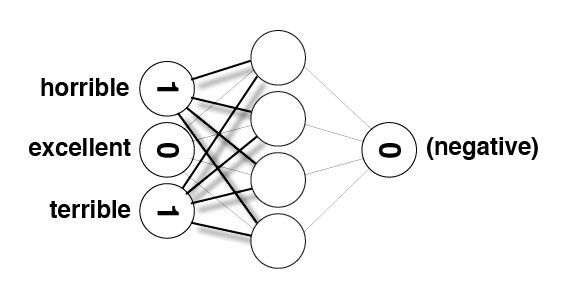

In [235]:
Image(filename='sentiment_network_sparse_2.png')

In [236]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.0775374439057197),
 ('felix', 3.1527360223636558),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.8067217286092401),
 ('victoria', 2.6810215287142909),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.5389738710582761),
 ('flawless', 2.451005098112319),
 ('superbly', 2.2600254785752498),
 ('perfection', 2.1594842493533721),
 ('astaire', 2.1400661634962708),
 ('captures', 2.0386195471595809),
 ('voight', 2.0301704926730531),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.9783454248084671),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('socc

In [237]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('boll', -4.9698132995760007),
 ('uwe', -4.6249728132842707),
 ('seagal', -3.6441435602725449),
 ('unwatchable', -3.2580965380214821),
 ('stinker', -3.2088254890146994),
 ('mst', -2.9502698994772336),
 ('incoherent', -2.9368917735310576),
 ('unfunny', -2.6922395950755678),
 ('waste', -2.6193845640165536),
 ('blah', -2.5704288232261625),
 ('horrid', -2.4849066497880004),
 ('pointless', -2.4553061800117097),
 ('atrocious', -2.4259083090260445),
 ('redeeming', -2.3682390632154826),
 ('prom', -2.3608540011180215),
 ('drivel', -2.3470368555648795),
 ('lousy', -2.3075726345050849),
 ('worst', -2.2869878961803778),
 ('laughable', -2.2643638801738479),
 ('awful', -2.2271942470274348),
 ('poorly', -2.2207550747464135),
 ('wasting', -2.2046046846338418),
 ('remotely', -2.1972245773362196),
 ('existent', -2.0794415416798357),
 ('boredom', -1.9951003932460849),
 ('miserably', -1.9924301646902063),
 ('sucks', -1.9870682215488209),
 ('uninspired', -1.9832976811269336),
 ('lame', -1.981767458946166)

In [238]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [239]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

In [240]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

In [241]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [251]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1, min_count=0, polarity_cutoff=1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels, min_count, polarity_cutoff)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels, min_count, polarity_cutoff):
        positive_counts = Counter()
        negative_counts = Counter()
        total_counts = Counter()
        for target, review in zip(labels, reviews):
            words = review.lower().split(' ')
            if target == 'NEGATIVE':
                negative_counts.update(words)
            else:
                positive_counts.update(words)
            total_counts.update(words)
        pos_neg_ratios = Counter()
        for word, count in total_counts.items():
            if count >= min_count:
                ratio = positive_counts[word] / float(negative_counts[word] + 1)
                if ratio > 1:
                    ratio = np.log(ratio)
                else:
                    ratio = -np.log((1 / (ratio + 0.01)))
                if((ratio >= polarity_cutoff) or (ratio <= -polarity_cutoff)):
                    pos_neg_ratios[word] = ratio
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(pos_neg_ratios.keys())
        
        # populate label_vocab with all of the words in the given labels.
        label_vocab = set(labels)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        
        # populate self.word2index with indices for all the words in self.review_vocab
        for i,word in enumerate(self.review_vocab):
            self.word2index[word] = i
        
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # populate self.label_vocab with indices for all the words in self.review_vocab
        for i,word in enumerate(self.label_vocab):
            self.label2index[word] = i
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((self.input_nodes, hidden_nodes))
        #np.random.normal(scale=1 / self.review_vocab_size ** .5,
        #                 size=(self.review_vocab_size, hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.normal(0.0, self.hidden_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_1 = np.zeros((1,hidden_nodes))
    
        
    def get_index_review_representation(self,reviews_raw):
        """ Modify the global layer_0 to represent the vector form of review.
        The element at a given index of layer_0 should represent
        how many times the given word occurs in the review.
        Args:
            review(string) - the string of the review
        Returns:
            None
        """
        reviews_result = []
        for review in reviews_raw:
            current_review_indx = []
            word_set = set(review.lower().split(' '))
            # clear out previous state by resetting the layer to be all 0s
            for words in word_set:
                if words in self.word2index.keys():
                    idx = self.word2index[words]
                    current_review_indx.append(idx)
            reviews_result.append(current_review_indx)
        return reviews_result
                
    def get_target_for_label(self,label):
        """Convert a label to `0` or `1`.
        Args:
            label(string) - Either "POSITIVE" or "NEGATIVE".
        Returns:
            `0` or `1`.
        """
        if label.lower().startswith('pos'):
            return 1
        return 0
        
    def sigmoid(self,x):
        """
        Calculate sigmoid
        """
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_output_2_derivative(self,output):
        '''
        Return the derivative of the sigmoid activation function, 
        where "output" is the original output from the sigmoid fucntion 
        '''
        return output * (1 - output)

    def train(self, training_reviews_raw, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews_raw) == len(training_labels))
        
        # Keep track of correct predictions to display accuracy during training 
        correct_so_far = 0
        
        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        
        training_reviews = self.get_index_review_representation(training_reviews_raw)
        for i in range(len(training_reviews)):
            # Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            # TODO: Implement the forward pass through the network. 
            #       That means use the given review to update the input layer, 
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            # 
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.
            self.layer_1 *= 0
            for index in review:
                self.layer_1 += self.weights_0_1[index]
            
            output = self.sigmoid(np.dot(self.layer_1, self.weights_1_2))
            
            # TODO: Implement the back propagation pass here. 
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you 
            #       learned in class.
            output_error = self.get_target_for_label(label) - output
            output_error_term = output_error * self.sigmoid_output_2_derivative(output)
            
            
            layer_1_error = np.dot(output_error_term, self.weights_1_2.T)
            # no non-linteraity
            layer_1_error_term = layer_1_error 
            
            self.weights_1_2 += self.learning_rate * np.dot(self.layer_1.T, output_error_term)
            self.weights_0_1[review] += self.learning_rate * layer_1_error_term
            
            
            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error 
            #       is less than 0.5. If so, add one to the correct_so_far count.
            # Keep track of correct predictions.
            if(output >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif(output < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the training process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i+1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i+1))[:4] + "%")
            if(i % 2500 == 0):
                print("")
    
    def test(self, testing_raw, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        testing_reviews = self.get_index_review_representation(testing_raw)
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        
        self.layer_1 *= 0
        for index in review:
            self.layer_1 += self.weights_0_1[index]
        output = self.sigmoid(np.dot(self.layer_1, self.weights_1_2))
        if(output >= 0.5):
            return 'POSITIVE'
        elif(output < 0.5):
            return 'NEGATIVE'


Run the following cell to train your network with a small polarity cutoff.

In [252]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:5.37% Speed(reviews/sec):407.5 #Correct:971 #Trained:1290 Training Accuracy:75.2%

Progress:8.22% Speed(reviews/sec):586.5 #Correct:1525 #Trained:1976 Training Accuracy:77.1%

Progress:10.4% Speed(reviews/sec):707.2 #Correct:1968 #Trained:2501 Training Accuracy:78.6%


Progress:13.5% Speed(reviews/sec):859.3 #Correct:2602 #Trained:3247 Training Accuracy:80.1%

Progress:16.1% Speed(reviews/sec):971.8 #Correct:3108 #Trained:3871 Training Accuracy:80.2%

Progress:18.8% Speed(reviews/sec):1082. #Correct:3648 #Trained:4535 Training Accuracy:80.4%

Progress:20.8% Speed(reviews/sec):1150. #Correct:4032 #Trained:5001 Training Accuracy:80.6%


Progress:24.1% Speed(reviews/sec):1259. #Correct:4690 #Trained:5790 Training Accuracy:81.0%

Progress:26.6% Speed(reviews/sec):1331. #Correct:5207 #Trained:6394 Training Accuracy:81.4%

Progress:29.3% Speed(reviews/sec):1404. #Correct:5760 #Trained:7035 Training Accuracy:81.8%

Progress:31.2% Speed(reviews/sec):1454. #Correct:6156 #Trained:7501 Training Accuracy:82.0%


Progress:34.7% Speed(reviews/sec):1541. #Correct:6883 #Trained:8350 Training Accuracy:82.4%

Progress:37.3% Speed(reviews/sec):1596. #Correct:7410 #Trained:8975 Training Accuracy:82.5%

Progress:40.0% Speed(reviews/sec):1649. #Correct:7971 #Trained:9610 Training Accuracy:82.9%

Progress:41.6% Speed(reviews/sec):1680. #Correct:8308 #Trained:10001 Training Accuracy:83.0%


Progress:45.3% Speed(reviews/sec):1745. #Correct:9063 #Trained:10888 Training Accuracy:83.2%

Progress:47.9% Speed(reviews/sec):1785. #Correct:9591 #Trained:11505 Training Accuracy:83.3%

Progress:50.4% Speed(reviews/sec):1823. #Correct:10127 #Trained:12118 Training Accuracy:83.5%

Progress:52.0% Speed(reviews/sec):1845. #Correct:10462 #Trained:12501 Training Accuracy:83.6%


Progress:55.7% Speed(reviews/sec):1895. #Correct:11202 #Trained:13380 Training Accuracy:83.7%

Progress:58.3% Speed(reviews/sec):1927. #Correct:11751 #Trained:13999 Training Accuracy:83.9%

Progress:61.0% Speed(reviews/sec):1961. #Correct:12278 #Trained:14645 Training Accuracy:83.8%

Progress:62.5% Speed(reviews/sec):1976. #Correct:12590 #Trained:15001 Training Accuracy:83.9%


Progress:66.0% Speed(reviews/sec):2011. #Correct:13315 #Trained:15844 Training Accuracy:84.0%

Progress:68.6% Speed(reviews/sec):2039. #Correct:13853 #Trained:16482 Training Accuracy:84.0%

Progress:71.2% Speed(reviews/sec):2063. #Correct:14378 #Trained:17096 Training Accuracy:84.1%

Progress:72.9% Speed(reviews/sec):2077. #Correct:14740 #Trained:17501 Training Accuracy:84.2%


Progress:76.3% Speed(reviews/sec):2107. #Correct:15452 #Trained:18325 Training Accuracy:84.3%

Progress:79.0% Speed(reviews/sec):2130. #Correct:16023 #Trained:18967 Training Accuracy:84.4%

Progress:81.5% Speed(reviews/sec):2150. #Correct:16564 #Trained:19581 Training Accuracy:84.5%

Progress:83.3% Speed(reviews/sec):2162. #Correct:16930 #Trained:20001 Training Accuracy:84.6%


Progress:86.6% Speed(reviews/sec):2184. #Correct:17618 #Trained:20788 Training Accuracy:84.7%

Progress:89.1% Speed(reviews/sec):2200. #Correct:18154 #Trained:21394 Training Accuracy:84.8%

Progress:91.8% Speed(reviews/sec):2220. #Correct:18729 #Trained:22041 Training Accuracy:84.9%

Progress:93.7% Speed(reviews/sec):2232. #Correct:19120 #Trained:22501 Training Accuracy:84.9%


Progress:97.1% Speed(reviews/sec):2255. #Correct:19823 #Trained:23320 Training Accuracy:85.0%

Progress:99.7% Speed(reviews/sec):2271. #Correct:20400 #Trained:23947 Training Accuracy:85.1%

Progress:99.9% Speed(reviews/sec):2271. #Correct:20448 #Trained:24000 Training Accuracy:85.2%

And run the following cell to test it's performance. It should be 

In [253]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:81.9% Speed(reviews/sec):2583. #Correct:699 #Tested:820 Testing Accuracy:85.2%

Progress:99.9% Speed(reviews/sec):2712. #Correct:854 #Tested:1000 Testing Accuracy:85.4%

Run the following cell to train your network with a much larger polarity cutoff.

In [254]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.8,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:10.4% Speed(reviews/sec):1105. #Correct:2066 #Trained:2501 Training Accuracy:82.6%


Progress:18.7% Speed(reviews/sec):1779. #Correct:3719 #Trained:4512 Training Accuracy:82.4%

Progress:20.8% Speed(reviews/sec):1916. #Correct:4113 #Trained:5001 Training Accuracy:82.2%


Progress:31.2% Speed(reviews/sec):2549. #Correct:6176 #Trained:7501 Training Accuracy:82.3%


Progress:37.8% Speed(reviews/sec):2881. #Correct:7500 #Trained:9092 Training Accuracy:82.4%

Progress:41.6% Speed(reviews/sec):3048. #Correct:8278 #Trained:10001 Training Accuracy:82.7%


Progress:50.2% Speed(reviews/sec):3381. #Correct:10014 #Trained:12070 Training Accuracy:82.9%

Progress:52.0% Speed(reviews/sec):3439. #Correct:10379 #Trained:12501 Training Accuracy:83.0%


Progress:62.5% Speed(reviews/sec):3781. #Correct:12485 #Trained:15001 Training Accuracy:83.2%


Progress:69.3% Speed(reviews/sec):3973. #Correct:13861 #Trained:16647 Training Accuracy:83.2%

Progress:72.9% Speed(reviews/sec):4060. #Correct:14578 #Trained:17501 Training Accuracy:83.2%


Progress:81.9% Speed(reviews/sec):4273. #Correct:16456 #Trained:19671 Training Accuracy:83.6%

Progress:83.3% Speed(reviews/sec):4296. #Correct:16734 #Trained:20001 Training Accuracy:83.6%


Progress:93.7% Speed(reviews/sec):4506. #Correct:18890 #Trained:22501 Training Accuracy:83.9%


Progress:99.9% Speed(reviews/sec):4617. #Correct:20173 #Trained:24000 Training Accuracy:84.0%

And run the following cell to test it's performance.

In [255]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):5469. #Correct:823 #Tested:1000 Testing Accuracy:82.3%

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [256]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [257]:
mlp_full.train(reviews[:-1000],labels[:-1000])

Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%


Progress:4.64% Speed(reviews/sec):307.3 #Correct:840 #Trained:1115 Training Accuracy:75.3%

Progress:6.99% Speed(reviews/sec):438.3 #Correct:1272 #Trained:1680 Training Accuracy:75.7%

Progress:9.44% Speed(reviews/sec):561.6 #Correct:1758 #Trained:2267 Training Accuracy:77.5%

Progress:10.4% Speed(reviews/sec):605.4 #Correct:1944 #Trained:2501 Training Accuracy:77.7%


Progress:13.9% Speed(reviews/sec):751.8 #Correct:2647 #Trained:3342 Training Accuracy:79.2%

Progress:16.2% Speed(reviews/sec):837.0 #Correct:3101 #Trained:3892 Training Accuracy:79.6%

Progress:18.5% Speed(reviews/sec):918.2 #Correct:3562 #Trained:4457 Training Accuracy:79.9%

Progress:20.6% Speed(reviews/sec):981.9 #Correct:3975 #Trained:4967 Training Accuracy:80.0%

Progress:20.8% Speed(reviews/sec):985.3 #Correct:4003 #Trained:5001 Training Accuracy:80.0%


Progress:25.2% Speed(reviews/sec):1107. #Correct:4868 #Trained:6055 Training Accuracy:80.3%

Progress:27.5% Speed(reviews/sec):1166. #Correct:5358 #Trained:6618 Training Accuracy:80.9%

Progress:29.8% Speed(reviews/sec):1217. #Correct:5822 #Trained:7156 Training Accuracy:81.3%

Progress:31.2% Speed(reviews/sec):1248. #Correct:6119 #Trained:7501 Training Accuracy:81.5%


Progress:34.4% Speed(reviews/sec):1316. #Correct:6781 #Trained:8276 Training Accuracy:81.9%

Progress:36.7% Speed(reviews/sec):1360. #Correct:7249 #Trained:8829 Training Accuracy:82.1%

Progress:39.1% Speed(reviews/sec):1403. #Correct:7750 #Trained:9394 Training Accuracy:82.4%

Progress:41.4% Speed(reviews/sec):1441. #Correct:8229 #Trained:9949 Training Accuracy:82.7%

Progress:41.6% Speed(reviews/sec):1444. #Correct:8273 #Trained:10001 Training Accuracy:82.7%


Progress:45.9% Speed(reviews/sec):1508. #Correct:9150 #Trained:11023 Training Accuracy:83.0%

Progress:48.2% Speed(reviews/sec):1540. #Correct:9624 #Trained:11575 Training Accuracy:83.1%

Progress:50.4% Speed(reviews/sec):1567. #Correct:10087 #Trained:12099 Training Accuracy:83.3%

Progress:52.0% Speed(reviews/sec):1589. #Correct:10433 #Trained:12501 Training Accuracy:83.4%


Progress:54.9% Speed(reviews/sec):1621. #Correct:11014 #Trained:13182 Training Accuracy:83.5%

Progress:57.1% Speed(reviews/sec):1646. #Correct:11473 #Trained:13719 Training Accuracy:83.6%

Progress:59.4% Speed(reviews/sec):1670. #Correct:11933 #Trained:14261 Training Accuracy:83.6%

Progress:61.7% Speed(reviews/sec):1695. #Correct:12399 #Trained:14823 Training Accuracy:83.6%

Progress:62.5% Speed(reviews/sec):1701. #Correct:12554 #Trained:15001 Training Accuracy:83.6%


Progress:66.1% Speed(reviews/sec):1736. #Correct:13307 #Trained:15888 Training Accuracy:83.7%

Progress:68.4% Speed(reviews/sec):1755. #Correct:13753 #Trained:16426 Training Accuracy:83.7%

Progress:70.7% Speed(reviews/sec):1775. #Correct:14217 #Trained:16970 Training Accuracy:83.7%

Progress:72.9% Speed(reviews/sec):1793. #Correct:14678 #Trained:17501 Training Accuracy:83.8%


Progress:75.1% Speed(reviews/sec):1809. #Correct:15141 #Trained:18040 Training Accuracy:83.9%

Progress:76.4% Speed(reviews/sec):1804. #Correct:15416 #Trained:18358 Training Accuracy:83.9%

Progress:77.5% Speed(reviews/sec):1794. #Correct:15646 #Trained:18614 Training Accuracy:84.0%

Progress:78.7% Speed(reviews/sec):1787. #Correct:15901 #Trained:18899 Training Accuracy:84.1%

Progress:79.8% Speed(reviews/sec):1778. #Correct:16135 #Trained:19167 Training Accuracy:84.1%

Progress:81.0% Speed(reviews/sec):1771. #Correct:16394 #Trained:19456 Training Accuracy:84.2%

Progress:82.0% Speed(reviews/sec):1761. #Correct:16607 #Trained:19703 Training Accuracy:84.2%

Progress:83.1% Speed(reviews/sec):1753. #Correct:16832 #Trained:19960 Training Accuracy:84.3%

Progress:83.3% Speed(reviews/sec):1752. #Correct:16869 #Trained:20001 Training Accuracy:84.3%


Progress:86.2% Speed(reviews/sec):1756. #Correct:17480 #Trained:20707 Training Accuracy:84.4%

Progress:87.3% Speed(reviews/sec):1747. #Correct:17701 #Trained:20960 Training Accuracy:84.4%

Progress:88.4% Speed(reviews/sec):1740. #Correct:17926 #Trained:21217 Training Accuracy:84.4%

Progress:89.9% Speed(reviews/sec):1741. #Correct:18251 #Trained:21585 Training Accuracy:84.5%

Progress:92.2% Speed(reviews/sec):1757. #Correct:18734 #Trained:22137 Training Accuracy:84.6%

Progress:93.7% Speed(reviews/sec):1766. #Correct:19050 #Trained:22501 Training Accuracy:84.6%


Progress:96.7% Speed(reviews/sec):1784. #Correct:19669 #Trained:23214 Training Accuracy:84.7%

Progress:98.9% Speed(reviews/sec):1797. #Correct:20141 #Trained:23746 Training Accuracy:84.8%

Progress:99.9% Speed(reviews/sec):1802. #Correct:20374 #Trained:24000 Training Accuracy:84.8%

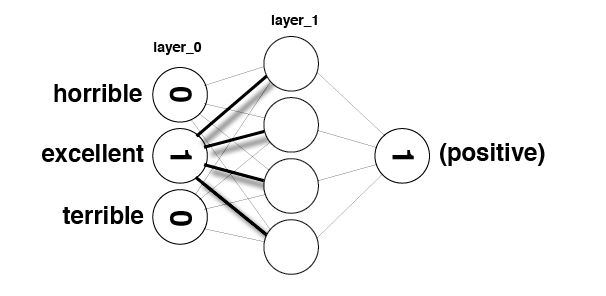

In [258]:
Image(filename='sentiment_network_sparse.png')

In [259]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [260]:
get_most_similar_words("excellent")

[('excellent', 0.14660809065567865),
 ('perfect', 0.12526627358447934),
 ('great', 0.10713868923526694),
 ('amazing', 0.10165619345416499),
 ('wonderful', 0.097065218763609323),
 ('best', 0.096335846592108171),
 ('today', 0.090621292413605753),
 ('fun', 0.088568449885944256),
 ('loved', 0.079106386972062043),
 ('definitely', 0.076910916981612676),
 ('superb', 0.076252610184256386),
 ('favorite', 0.074214143809246569),
 ('liked', 0.073096201388985593),
 ('highly', 0.073032035074142992),
 ('job', 0.072232193557377117),
 ('enjoyable', 0.071390774852963246),
 ('fantastic', 0.071372919421980985),
 ('brilliant', 0.070148099810838832),
 ('enjoyed', 0.070075511709459692),
 ('beautiful', 0.065376028482146312),
 ('bit', 0.063374844807184638),
 ('perfectly', 0.063300120945889785),
 ('simple', 0.062152494026229028),
 ('especially', 0.061055172119516943),
 ('rare', 0.057421238877737819),
 ('incredible', 0.057177953696605638),
 ('very', 0.05685178291127866),
 ('love', 0.0562103379459723),
 ('always'

In [261]:
get_most_similar_words("terrible")

[('worst', 0.17615579852418917),
 ('awful', 0.12575196125185906),
 ('waste', 0.11991666736024727),
 ('poor', 0.10184592068658212),
 ('boring', 0.097400821387369454),
 ('terrible', 0.09719201719001995),
 ('bad', 0.081941951574242153),
 ('dull', 0.081287986818830302),
 ('worse', 0.0750550215832054),
 ('poorly', 0.074959443771819956),
 ('annoying', 0.07439793982531949),
 ('stupid', 0.074265843287333169),
 ('unfortunately', 0.073345686388774076),
 ('disappointing', 0.071843479469419935),
 ('nothing', 0.070963065922136484),
 ('fails', 0.069936538803657286),
 ('horrible', 0.067055217675273823),
 ('mess', 0.066001347538888963),
 ('disappointment', 0.065496611290487367),
 ('supposed', 0.062477825746848376),
 ('badly', 0.060986416793552906),
 ('save', 0.060952859495263571),
 ('wasted', 0.060337953283393239),
 ('ridiculous', 0.06005541702141827),
 ('oh', 0.058652405935221891),
 ('minutes', 0.058426796504572706),
 ('avoid', 0.057527670138266158),
 ('script', 0.057222057075560336),
 ('crap', 0.056

In [262]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [263]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [264]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [265]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words